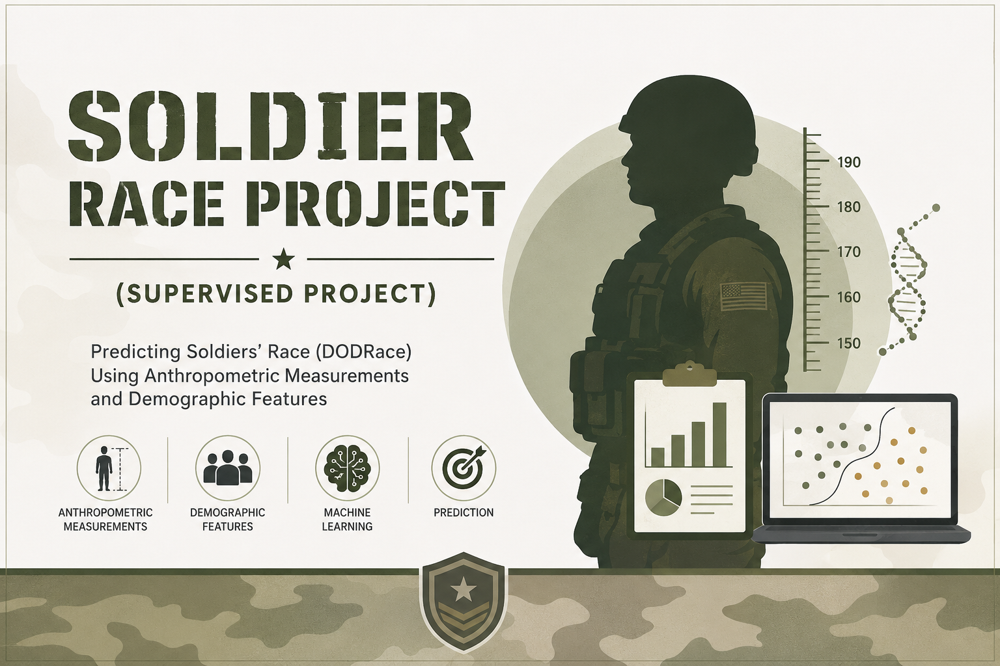


# About Dataset

**ANSUR II Databases: Etnik Köken Tahmini**

**1. Genel Bakış:** 
- ANSUR II (Anthropometric Survey of U.S. Army Personnel), 2012'de ABD Ordusu tarafından yürütülen geniş çaplı bir antropometrik (vücut ölçümleri) araştırmasının sonuçlarına dayanmaktadır.
  
**2. Veri Setinin İçeriği:**

- ANSUR II, ordu personelinin vücut ölçümlerini ve etnik köken bilgilerini içerir. Veri kümesi, bireylerin farklı vücut bölümlerinden alınan 100'den fazla ölçümü kapsar. Ölçümler, baş, el, ayak, bacak, kol, göğüs vb. gibi farklı vücut bölümlerine ait detayları içerir.

- Veri seti, doğrudan ölçülen 93 antropometrik ölçüm ve aşağıda açıklanan 15 demografik/idari değişken içerir. 

- Erkek veri seti, toplam 4.082 denekten oluşan bir örnek içerir. 

- ANSUR II Kadın veri seti, toplam 1.986 denekten oluşan bir örnek içerir.

- Ayrıca  antropometrik ve demografik verilere ek olarak, ANSUR II veri tabanı ayrıca Asker katılımcılarının 3B tüm vücut, ayak ve kafa taramalarından oluşur. 
- Bu 3B veriler, ANSUR II katılımcılarının mahremiyetine saygı nedeniyle halka açık değildir. 

**3. Kimler Katıldı?**
- Bu veritabanı, aktif görevdeki ordu personelinin çeşitli etnik gruplarından ve yaş gruplarından temsilcileri içermektedir. Veri kümesinde, hem erkeklerden hem de kadınlardan alınan ölçümler bulunmaktadır.

**4. Ölçüm ve Etnik Köken İlişkisi:**
- Farklı etnik gruplar, genetik ve çevresel faktörlere bağlı olarak farklı vücut yapısına sahip olabilir. Bu, bacak uzunluğu, kafa yapısı, el ve ayak ölçümleri gibi ölçümlerde farklılıklarla gözlemlenebilir.

**5. Modelleme ve Tahmin:**
- Etnik köken tahmini, ANSUR II veri kümesindeki vücut ölçümleri kullanılarak bir sınıflandırma problemi olarak ele alınabilir.
- Kullanılacak algoritma, ölçümler ile etnik köken arasındaki ilişkiyi öğrenir ve yeni verilere uygulanarak etnik köken tahminleri yapabilir.

**6. Projenin Önemi ve Uygulama Alanları:**
- Bu tür bir araştırma, ordu personelinin vücut ölçülerini analiz ederek askeri ekipman, kıyafet ve diğer sistemlerin tasarım ve üretimi için kullanılmaktadır. Doğru ölçümler, askeri personelin rahatlığı, hareket kabiliyeti ve genel güvenliği için kritik öneme sahiptir.

- Ayrıca birçok potansiyel ticari, endüstriyel ve akademik uygulamaya sahiptir.

- Ek olarak belki de Laser okuyucular ve sensörler ile örnek veriyorum bir havaalanından girişte kökeni tespit edilebilir. 

DATA DICT:

https://data.world/search?q=ansur&scope=_all

https://mreed.umtri.umich.edu/mreed/downloads.html#ansur2

https://data.world/datamil/ansur-ii-data-dictionary/workspace/file?filename=ANSUR+II+Databases+Overview.pdf

https://www.kaggle.com/datasets/seshadrikolluri/ansur-ii/data

# Tasks

Keşifsel Veri Analizi (EDA)

- Kütüphaneleri İçe Aktarma

- Veri Kümesi Yükleme

- Verileri Keşfetme

Veri Ön İşleme

- Scaling (gerekirse)

- Train-Test Split

Sınıflandırma Algoritmaları

- Logistic Regression 

- SVM Classifier 

- Random Forest Classifier 

- XGBoost Classifier 

Modelleri Karşılaştırın

Final Model

SMOTE

SHAP

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from skimpy import skim
import missingno as msno

from sklearn.model_selection import train_test_split, cross_validate, GridSearchCV, StratifiedKFold
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler
from sklearn.preprocessing import OrdinalEncoder, OneHotEncoder, LabelEncoder
from sklearn.pipeline import Pipeline

from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from catboost import CatBoostClassifier, Pool
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier

from sklearn.compose import make_column_transformer
from sklearn.metrics import confusion_matrix, classification_report, ConfusionMatrixDisplay
from sklearn.metrics import make_scorer, precision_score, recall_score, accuracy_score, f1_score
from sklearn.metrics import RocCurveDisplay, PrecisionRecallDisplay, roc_auc_score, auc, roc_curve, average_precision_score, precision_recall_curve
from yellowbrick.classifier import ClassPredictionError, ROCAUC

plt.rcParams["figure.figsize"] = (10,6)

import warnings
warnings.filterwarnings("ignore")
warnings.warn("this will not show")


from lazypredict.Supervised import LazyClassifier    # pip install lazypredict

# EDA

**Retrieve data from the following links and create a data frame**

- Soldiers Male : https://query.data.world/s/h3pbhckz5ck4rc7qmt2wlknlnn7esr
- Soldiers Female : https://query.data.world/s/sq27zz4hawg32yfxksqwijxmpwmynq

- Drop unnecessary colums
- Drop DODRace class if value count below 500 (we assume that our data model can't learn if it is below 500)

In [6]:
from charset_normalizer import from_path

result = from_path("ANSUR II MALE Public.csv").best()
print(result.encoding)

#charset_normalizer kütüphanesinden from_path fonksiyonunu içe aktarılır (import eder).Bu fonksiyon dosyanın içeriğini analiz ederek karakter kodlamasını (encoding) tahmin eder.
#cp1250 çıktısı almamız dosya büyük ihtimalle Windows Central European kodlamasıyla kaydedilmiştir.

cp1250


In [7]:
from charset_normalizer import from_path

result = from_path(r"ANSUR II FEMALE Public.csv").best()
print(result.encoding)

#ascii çıktısı, dosyanın yalnızca temel İngilizce karakterler içerdiğini gösterir; dosyanın mutlaka ASCII ile kaydedildiğini %100 kanıtlamaz. charset_normalizer en olası encoding'i tahmin eder.

ascii


In [8]:
female = pd.read_csv("ANSUR II FEMALE Public.csv", encoding="ascii")
female.head(5)

,SubjectId,abdominalextensiondepthsitting,acromialheight,acromionradialelength,anklecircumference,axillaheight,balloffootcircumference,balloffootlength,biacromialbreadth,bicepscircumferenceflexed,...,Branch,PrimaryMOS,SubjectsBirthLocation,SubjectNumericRace,Ethnicity,DODRace,Age,Heightin,Weightlbs,WritingPreference
0,10037,231,1282,301,204,1180,222,177,373,315,...,Combat Support,92Y,Germany,2,NaN,2,26,61,142,Right hand
1,10038,194,1379,320,207,1292,225,178,372,272,...,Combat Service Support,25U,California,3,Mexican,3,21,64,120,Right hand
2,10042,183,1369,329,233,1271,237,196,397,300,...,Combat Service Support,35D,Texas,1,NaN,1,23,68,147,Right hand
3,10043,261,1356,306,214,1250,240,188,384,364,...,Combat Service Support,25U,District of Columbia,8,Caribbean Islander,2,22,66,175,Right hand
4,10051,309,1303,308,214,1210,217,182,378,320,...,Combat Arms,42A,Texas,1,NaN,1,45,63,195,Right hand


In [9]:
female.shape

(1986, 108)

In [10]:
# female.info()
# 1986 tane gözlem var . 99 int, 9 str dytpe  sahip 108 tane feature mevcuttur. Fetaurelerin özellikleri görülmediği için Pandasın varsayılan görüntüleme sınırı kaldırıldı 

In [11]:
import pandas as pd

pd.set_option('display.max_info_columns', 200)
#df.info() çıktısında tüm sütunları tek tek görmek için Pandas'ın varsayılan görüntüleme sınırını kaldırdık 

In [12]:
female.info()

<class 'pandas.DataFrame'>
RangeIndex: 1986 entries, 0 to 1985
Data columns (total 108 columns):
 #    Column                          Non-Null Count  Dtype
---   ------                          --------------  -----
 0    SubjectId                       1986 non-null   int64
 1    abdominalextensiondepthsitting  1986 non-null   int64
 2    acromialheight                  1986 non-null   int64
 3    acromionradialelength           1986 non-null   int64
 4    anklecircumference              1986 non-null   int64
 5    axillaheight                    1986 non-null   int64
 6    balloffootcircumference         1986 non-null   int64
 7    balloffootlength                1986 non-null   int64
 8    biacromialbreadth               1986 non-null   int64
 9    bicepscircumferenceflexed       1986 non-null   int64
 10   bicristalbreadth                1986 non-null   int64
 11   bideltoidbreadth                1986 non-null   int64
 12   bimalleolarbreadth              1986 non-null   int64
 13

In [13]:
print(female.columns.tolist())

['SubjectId', 'abdominalextensiondepthsitting', 'acromialheight', 'acromionradialelength', 'anklecircumference', 'axillaheight', 'balloffootcircumference', 'balloffootlength', 'biacromialbreadth', 'bicepscircumferenceflexed', 'bicristalbreadth', 'bideltoidbreadth', 'bimalleolarbreadth', 'bitragionchinarc', 'bitragionsubmandibulararc', 'bizygomaticbreadth', 'buttockcircumference', 'buttockdepth', 'buttockheight', 'buttockkneelength', 'buttockpopliteallength', 'calfcircumference', 'cervicaleheight', 'chestbreadth', 'chestcircumference', 'chestdepth', 'chestheight', 'crotchheight', 'crotchlengthomphalion', 'crotchlengthposterioromphalion', 'earbreadth', 'earlength', 'earprotrusion', 'elbowrestheight', 'eyeheightsitting', 'footbreadthhorizontal', 'footlength', 'forearmcenterofgriplength', 'forearmcircumferenceflexed', 'forearmforearmbreadth', 'forearmhandlength', 'functionalleglength', 'handbreadth', 'handcircumference', 'handlength', 'headbreadth', 'headcircumference', 'headlength', 'heel

In [14]:
male = pd.read_csv("ANSUR II MALE Public.csv", encoding="cp1250")
male.head(5)

,subjectid,abdominalextensiondepthsitting,acromialheight,acromionradialelength,anklecircumference,axillaheight,balloffootcircumference,balloffootlength,biacromialbreadth,bicepscircumferenceflexed,...,Branch,PrimaryMOS,SubjectsBirthLocation,SubjectNumericRace,Ethnicity,DODRace,Age,Heightin,Weightlbs,WritingPreference
0,10027,266,1467,337,222,1347,253,202,401,369,...,Combat Arms,19D,North Dakota,1,NaN,1,41,71,180,Right hand
1,10032,233,1395,326,220,1293,245,193,394,338,...,Combat Support,68W,New York,1,NaN,1,35,68,160,Left hand
2,10033,287,1430,341,230,1327,256,196,427,408,...,Combat Support,68W,New York,2,NaN,2,42,68,205,Left hand
3,10092,234,1347,310,230,1239,262,199,401,359,...,Combat Service Support,88M,Wisconsin,1,NaN,1,31,66,175,Right hand
4,10093,250,1585,372,247,1478,267,224,435,356,...,Combat Service Support,92G,North Carolina,2,NaN,2,21,77,213,Right hand


In [15]:
male.shape

(4082, 108)

In [16]:
male.info()
# 4082 tane gözlem var . 99 int, 9 str dytpe  sahip 108 tane feature mevcuttur. 

<class 'pandas.DataFrame'>
RangeIndex: 4082 entries, 0 to 4081
Data columns (total 108 columns):
 #    Column                          Non-Null Count  Dtype
---   ------                          --------------  -----
 0    subjectid                       4082 non-null   int64
 1    abdominalextensiondepthsitting  4082 non-null   int64
 2    acromialheight                  4082 non-null   int64
 3    acromionradialelength           4082 non-null   int64
 4    anklecircumference              4082 non-null   int64
 5    axillaheight                    4082 non-null   int64
 6    balloffootcircumference         4082 non-null   int64
 7    balloffootlength                4082 non-null   int64
 8    biacromialbreadth               4082 non-null   int64
 9    bicepscircumferenceflexed       4082 non-null   int64
 10   bicristalbreadth                4082 non-null   int64
 11   bideltoidbreadth                4082 non-null   int64
 12   bimalleolarbreadth              4082 non-null   int64
 13

In [17]:
print(male.columns.tolist())

['subjectid', 'abdominalextensiondepthsitting', 'acromialheight', 'acromionradialelength', 'anklecircumference', 'axillaheight', 'balloffootcircumference', 'balloffootlength', 'biacromialbreadth', 'bicepscircumferenceflexed', 'bicristalbreadth', 'bideltoidbreadth', 'bimalleolarbreadth', 'bitragionchinarc', 'bitragionsubmandibulararc', 'bizygomaticbreadth', 'buttockcircumference', 'buttockdepth', 'buttockheight', 'buttockkneelength', 'buttockpopliteallength', 'calfcircumference', 'cervicaleheight', 'chestbreadth', 'chestcircumference', 'chestdepth', 'chestheight', 'crotchheight', 'crotchlengthomphalion', 'crotchlengthposterioromphalion', 'earbreadth', 'earlength', 'earprotrusion', 'elbowrestheight', 'eyeheightsitting', 'footbreadthhorizontal', 'footlength', 'forearmcenterofgriplength', 'forearmcircumferenceflexed', 'forearmforearmbreadth', 'forearmhandlength', 'functionalleglength', 'handbreadth', 'handcircumference', 'handlength', 'headbreadth', 'headcircumference', 'headlength', 'heel

In [18]:
female.columns = female.columns.str.lower()
male.columns = male.columns.str.lower()

In [19]:
male.columns == female.columns

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True])

In [20]:
df1 = pd.concat([male, female], axis=0, ignore_index=True)
df1.head(5)

#Male ve female veri setlerinin sütunları karşılaştırıldığında tüm feature’ların birebir aynı olduğu görülmüştür. Bu durum iki veri setinin aynı ölçüm yapısına sahip olduğunu ve modelleme için uyumlu olduğunu göstermektedir. 
#Bu nedenle veri setleri, modelin daha fazla örnek görerek genelleme performansını artırması amacıyla birleştirilmiş (concatenate edilmiştir). Böylece cinsiyet bazlı ayrım korunarak tek bir eğitim veri seti oluşturulmuştur.
#Male ve female veri setleri birleştirilirken ignore_index=True parametresi kullanılarak mevcut index yapısı sıfırlanmış ve birleşik veri seti için 0’dan başlayan yeni bir sıralı index oluşturulmuştur.
# Bu işlem, veri bütünlüğünü korumak ve duplicate index oluşumunu engellemek amacıyla gerçekleştirilmiştir.

,subjectid,abdominalextensiondepthsitting,acromialheight,acromionradialelength,anklecircumference,axillaheight,balloffootcircumference,balloffootlength,biacromialbreadth,bicepscircumferenceflexed,...,branch,primarymos,subjectsbirthlocation,subjectnumericrace,ethnicity,dodrace,age,heightin,weightlbs,writingpreference
0,10027,266,1467,337,222,1347,253,202,401,369,...,Combat Arms,19D,North Dakota,1,NaN,1,41,71,180,Right hand
1,10032,233,1395,326,220,1293,245,193,394,338,...,Combat Support,68W,New York,1,NaN,1,35,68,160,Left hand
2,10033,287,1430,341,230,1327,256,196,427,408,...,Combat Support,68W,New York,2,NaN,2,42,68,205,Left hand
3,10092,234,1347,310,230,1239,262,199,401,359,...,Combat Service Support,88M,Wisconsin,1,NaN,1,31,66,175,Right hand
4,10093,250,1585,372,247,1478,267,224,435,356,...,Combat Service Support,92G,North Carolina,2,NaN,2,21,77,213,Right hand


In [21]:
df = df1.copy()

In [22]:
df.shape
# 6068 satır ve 109 sütun vardır 

(6068, 108)

In [23]:
df.info()

<class 'pandas.DataFrame'>
RangeIndex: 6068 entries, 0 to 6067
Data columns (total 108 columns):
 #    Column                          Non-Null Count  Dtype
---   ------                          --------------  -----
 0    subjectid                       6068 non-null   int64
 1    abdominalextensiondepthsitting  6068 non-null   int64
 2    acromialheight                  6068 non-null   int64
 3    acromionradialelength           6068 non-null   int64
 4    anklecircumference              6068 non-null   int64
 5    axillaheight                    6068 non-null   int64
 6    balloffootcircumference         6068 non-null   int64
 7    balloffootlength                6068 non-null   int64
 8    biacromialbreadth               6068 non-null   int64
 9    bicepscircumferenceflexed       6068 non-null   int64
 10   bicristalbreadth                6068 non-null   int64
 11   bideltoidbreadth                6068 non-null   int64
 12   bimalleolarbreadth              6068 non-null   int64
 13

In [24]:
print(df.columns.tolist())

['subjectid', 'abdominalextensiondepthsitting', 'acromialheight', 'acromionradialelength', 'anklecircumference', 'axillaheight', 'balloffootcircumference', 'balloffootlength', 'biacromialbreadth', 'bicepscircumferenceflexed', 'bicristalbreadth', 'bideltoidbreadth', 'bimalleolarbreadth', 'bitragionchinarc', 'bitragionsubmandibulararc', 'bizygomaticbreadth', 'buttockcircumference', 'buttockdepth', 'buttockheight', 'buttockkneelength', 'buttockpopliteallength', 'calfcircumference', 'cervicaleheight', 'chestbreadth', 'chestcircumference', 'chestdepth', 'chestheight', 'crotchheight', 'crotchlengthomphalion', 'crotchlengthposterioromphalion', 'earbreadth', 'earlength', 'earprotrusion', 'elbowrestheight', 'eyeheightsitting', 'footbreadthhorizontal', 'footlength', 'forearmcenterofgriplength', 'forearmcircumferenceflexed', 'forearmforearmbreadth', 'forearmhandlength', 'functionalleglength', 'handbreadth', 'handcircumference', 'handlength', 'headbreadth', 'headcircumference', 'headlength', 'heel

In [25]:
def unique_values(df, columns):
    """Prints unique values and their counts for specific columns in the DataFrame."""

    for column_name in columns:
        print(f"Column: {column_name}\n{'-'*30}")
        
        unique_vals = df[column_name].unique()
        value_counts = df[column_name].value_counts()
        
        print(f"Unique Values ({len(unique_vals)}): {unique_vals[:10]}")  # çok uzunsa ilk 10
        print(f"\nValue Counts:\n{value_counts.head(10)}")  # ilk 10 değer
        print(f"{'='*40}\n")

# Tüm kolonları manuel veriyoruz
columns = ['subjectid', 'abdominalextensiondepthsitting', 'acromialheight', 'acromionradialelength', 'anklecircumference', 'axillaheight', 'balloffootcircumference', 'balloffootlength', 'biacromialbreadth', 'bicepscircumferenceflexed', 
           'bicristalbreadth', 'bideltoidbreadth', 'bimalleolarbreadth', 'bitragionchinarc', 'bitragionsubmandibulararc', 'bizygomaticbreadth', 'buttockcircumference', 'buttockdepth', 'buttockheight', 'buttockkneelength', 'buttockpopliteallength',
           'calfcircumference', 'cervicaleheight', 'chestbreadth', 'chestcircumference', 'chestdepth', 'chestheight', 'crotchheight', 'crotchlengthomphalion', 'crotchlengthposterioromphalion', 'earbreadth', 'earlength', 'earprotrusion',
           'elbowrestheight', 'eyeheightsitting', 'footbreadthhorizontal', 'footlength', 'forearmcenterofgriplength', 'forearmcircumferenceflexed', 'forearmforearmbreadth', 'forearmhandlength', 'functionalleglength', 'handbreadth',
           'handcircumference', 'handlength', 'headbreadth', 'headcircumference', 'headlength', 'heelanklecircumference', 'heelbreadth', 'hipbreadth', 'hipbreadthsitting', 'iliocristaleheight', 'interpupillarybreadth', 'interscyei', 'interscyeii',
           'kneeheightmidpatella', 'kneeheightsitting', 'lateralfemoralepicondyleheight', 'lateralmalleolusheight', 'lowerthighcircumference', 'mentonsellionlength', 'neckcircumference', 'neckcircumferencebase', 'overheadfingertipreachsitting', 
           'palmlength', 'poplitealheight', 'radialestylionlength', 'shouldercircumference', 'shoulderelbowlength', 'shoulderlength', 'sittingheight', 'sleevelengthspinewrist', 'sleeveoutseam', 'span', 'stature', 'suprasternaleheight',
           'tenthribheight', 'thighcircumference', 'thighclearance', 'thumbtipreach', 'tibialheight', 'tragiontopofhead', 'trochanterionheight', 'verticaltrunkcircumferenceusa', 'waistbacklength', 'waistbreadth', 'waistcircumference', 
           'waistdepth', 'waistfrontlengthsitting', 'waistheightomphalion', 'weightkg', 'wristcircumference', 'wristheight', 'gender', 'date', 'installation', 'component', 'branch', 'primarymos', 'subjectsbirthlocation', 'subjectnumericrace', 
           'ethnicity', 'dodrace', 'age', 'heightin', 'weightlbs', 'writingpreference']


unique_values(df, columns)

Column: subjectid
------------------------------
Unique Values (6068): [10027 10032 10033 10092 10093 10115 10117 10237 10242 10244]

Value Counts:
subjectid
10027    1
10032    1
10033    1
10092    1
10093    1
10115    1
10117    1
10237    1
10242    1
10244    1
Name: count, dtype: int64

Column: abdominalextensiondepthsitting
------------------------------
Unique Values (218): [266 233 287 234 250 263 314 304 321 227]

Value Counts:
abdominalextensiondepthsitting
230    85
250    83
227    78
238    78
237    74
244    74
252    73
223    72
220    71
225    70
Name: count, dtype: int64

Column: acromialheight
------------------------------
Unique Values (432): [1467 1395 1430 1347 1585 1407 1476 1529 1457 1481]

Value Counts:
acromialheight
1418    43
1435    41
1427    38
1410    38
1375    38
1443    38
1450    37
1434    37
1422    37
1428    37
Name: count, dtype: int64

Column: acromionradialelength
------------------------------
Unique Values (133): [337 326 341 310 372 34

In [26]:
#Projenin amacı askerlerin antropometrik ölçümlerinden (boy, kol uzunluğu , baş çevresi vb.) yararlanarak DODRacr (etnik köken) tahmini etmektir.
#Sınıflandırma algoritmalarınızın (Logistic Regression, SVM, RF, XGBoost) performansı için veri setindeki "idari" ve "gürültü" yaratan değişkenleri ayıklamalısınız.
# Tanımlayıcı ve İdari Sütunlar: SubjectId, Date, Installation, Component, Branch, PrimaryMOS gibi askerlerin kimlik veya görev yeri bilgilerini içeren sütunlar, 
#fiziksel bir ölçüm olmadığı için modelin etnik kökeni öğrenmesine katkı sağlamaz ve drop edilmelidir.
# Mükerrer Birimler: Veri setinde hem metrik hem de emperyal birimler (inç/libre) bulunabilir. Örneğin, weightkg varken Weightlbs sütununu, stature (mm) varken Heightin sütununu drop etmelidir.

df.drop(columns=['subjectid', 'date', 'installation', 'component', 'branch', 'primarymos', 'heightin', 'weightlbs', 'subjectnumericrace', 'ethnicity'], inplace=True)


In [27]:
df.info()
# drop edilen featurelerden sonra datada 95 tane int, 3 tane str değer vardır. Missing value olmadığı görülmektedir. 

<class 'pandas.DataFrame'>
RangeIndex: 6068 entries, 0 to 6067
Data columns (total 98 columns):
 #   Column                          Non-Null Count  Dtype
---  ------                          --------------  -----
 0   abdominalextensiondepthsitting  6068 non-null   int64
 1   acromialheight                  6068 non-null   int64
 2   acromionradialelength           6068 non-null   int64
 3   anklecircumference              6068 non-null   int64
 4   axillaheight                    6068 non-null   int64
 5   balloffootcircumference         6068 non-null   int64
 6   balloffootlength                6068 non-null   int64
 7   biacromialbreadth               6068 non-null   int64
 8   bicepscircumferenceflexed       6068 non-null   int64
 9   bicristalbreadth                6068 non-null   int64
 10  bideltoidbreadth                6068 non-null   int64
 11  bimalleolarbreadth              6068 non-null   int64
 12  bitragionchinarc                6068 non-null   int64
 13  bitragionsubma

In [28]:
# Veri setinin genel bir profilini elde etmek için
# Gözlem sayısı-veri tipi-null değer sayısı-unique değer sayısı-min-max değerleri
# null değerler "0" gözüküyor!

def summary(df, pred=None):
    obs = df.shape[0]
    Types = df.dtypes
    Counts = df.apply(lambda x: x.count())
    Min = df.min()
    Max = df.max()
    Uniques = df.apply(lambda x: x.unique().shape[0])
    Nulls = df.apply(lambda x: x.isnull().sum())
    print('Data shape:', df.shape)

    if pred is None:
        cols = ['Types', 'Counts', 'Uniques', 'Nulls', 'Min', 'Max']
        str = pd.concat([Types, Counts, Uniques, Nulls, Min, Max], axis = 1, sort=True)

    str.columns = cols
    print('___________________________\nData Types:')
    print(str.Types.value_counts())
    print('___________________________')
    return str

summary(df)

Data shape: (6068, 98)
___________________________
Data Types:
Types
int64    95
str       3
Name: count, dtype: int64
___________________________


,Types,Counts,Uniques,Nulls,Min,Max
abdominalextensiondepthsitting,int64,6068,218,0,155,451
acromialheight,int64,6068,432,0,1115,1683
acromionradialelength,int64,6068,133,0,249,393
age,int64,6068,42,0,17,58
anklecircumference,int64,6068,112,0,156,293
...,...,...,...,...,...,...
waistheightomphalion,int64,6068,350,0,805,1245
weightkg,int64,6068,783,0,358,1442
wristcircumference,int64,6068,79,0,124,216
wristheight,int64,6068,276,0,672,1009


In [29]:
df.duplicated().sum()
# duplicated veri yoktur 

np.int64(0)

In [30]:
df.isnull().sum().sum()
# missing value yoktur 

np.int64(0)

In [31]:
pd.set_option('display.max_rows', None)
df.describe().T

#Veri setindeki sürekli değişkenler için betimsel istatistikler incelendiğinde, bazı değişkenlerde maksimum değerlerin üst çeyreklik (75%) değerinden belirgin şekilde uzaklaştığı gözlemlenmiştir. 
#Bu durum potansiyel aykırı (outlier) gözlemlerin varlığına işaret etmektedir.Örneğin axillaheight,chestcircumference featureleri  

,count,mean,std,min,25%,50%,75%,max
abdominalextensiondepthsitting,6068.0,246.468688,37.400106,155.0,219.00,242.0,271.00,451.0
acromialheight,6068.0,1406.161338,79.091048,1115.0,1350.00,1410.0,1462.00,1683.0
acromionradialelength,6068.0,327.374423,20.720018,249.0,313.00,328.0,341.25,393.0
anklecircumference,6068.0,224.891397,16.051833,156.0,214.00,225.0,235.00,293.0
axillaheight,6068.0,1299.608767,72.022286,1038.0,1249.00,1302.0,1349.00,1553.0
balloffootcircumference,6068.0,244.192650,16.845020,186.0,232.00,245.0,256.00,306.0
balloffootlength,6068.0,194.754614,13.516368,151.0,185.00,195.0,204.00,245.0
biacromialbreadth,6068.0,399.204186,30.236914,283.0,376.00,404.0,421.00,489.0
bicepscircumferenceflexed,6068.0,340.934245,41.519866,216.0,311.00,341.0,370.00,490.0
bicristalbreadth,6068.0,274.735003,19.221034,197.0,262.00,274.0,288.00,362.0


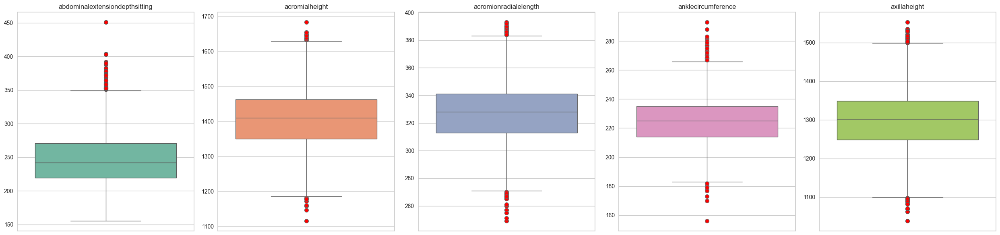

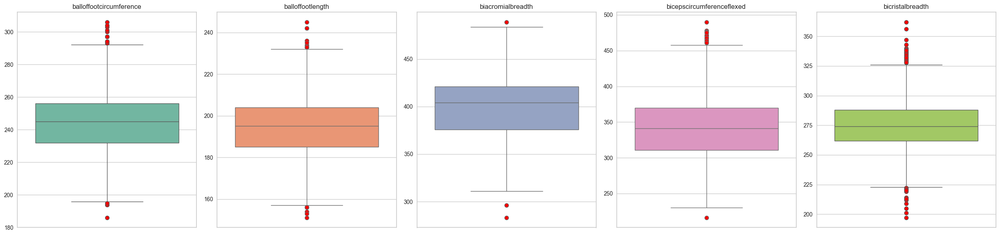

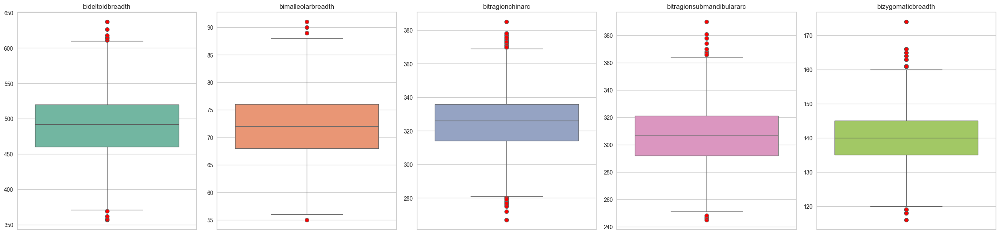

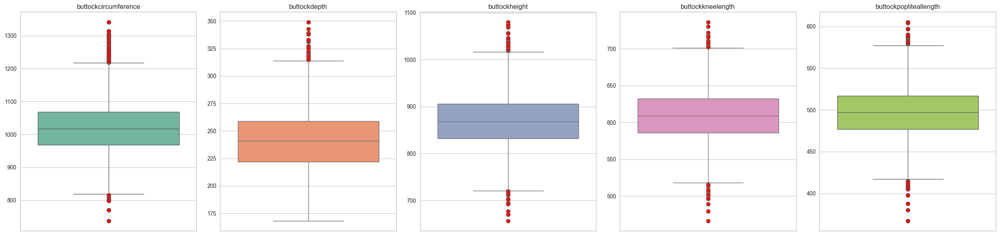

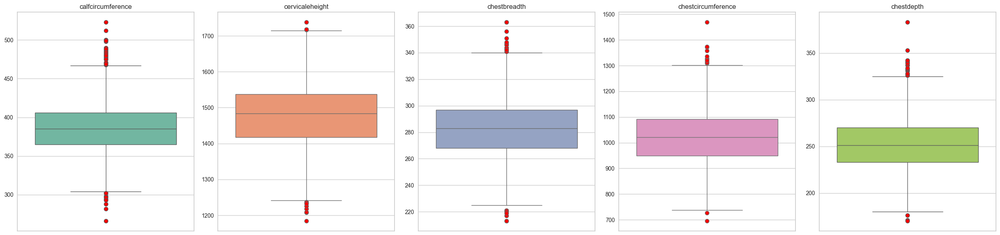

...

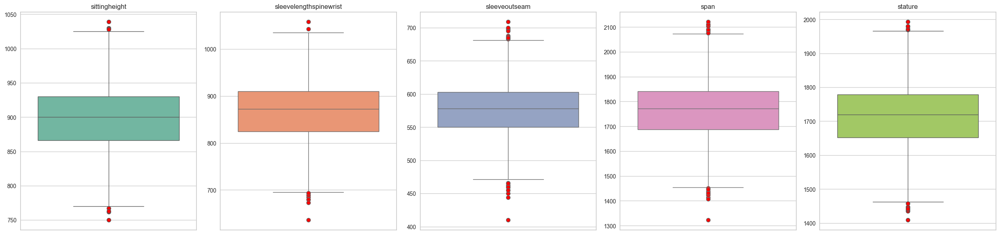

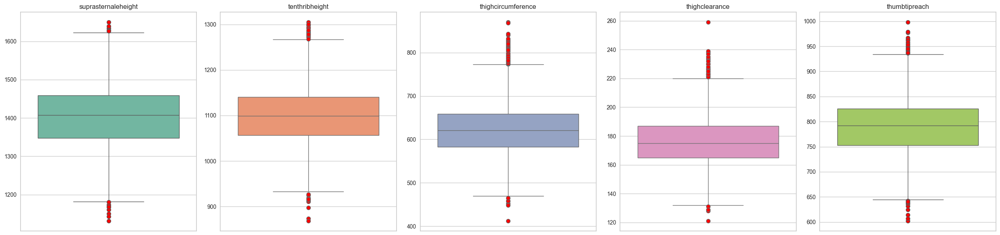

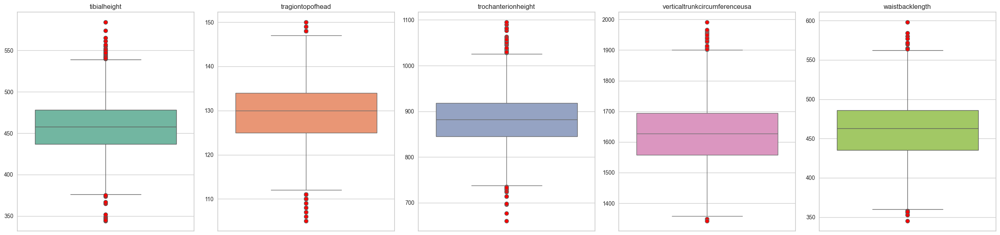

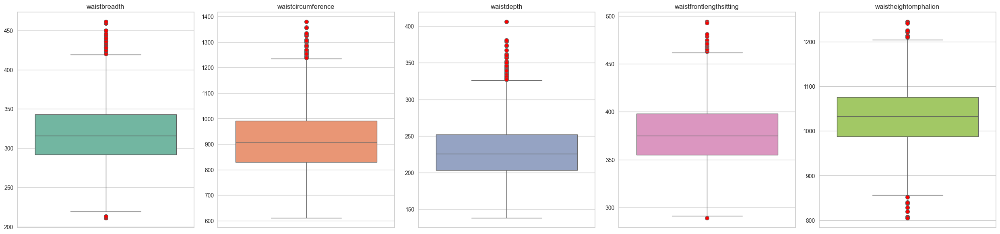

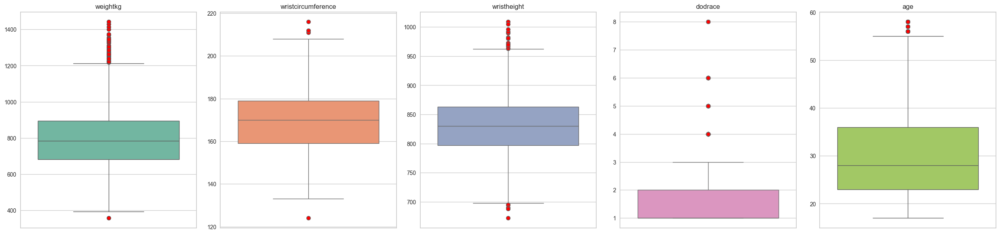

In [32]:
import seaborn as sns
import matplotlib.pyplot as plt

num_cols = df.select_dtypes(include="number").columns

chunks = [num_cols[i:i+5] for i in range(0, len(num_cols), 5)]

palette = sns.color_palette("Set2", 5)

for chunk in chunks: # sütunları küçük gruplara bölmek için kullanılan bir listedir.

    fig, axes = plt.subplots(1, len(chunk), figsize=(5 * len(chunk), 6)    )

    if len(chunk) == 1:
        axes = [axes]

    for ax, col, color in zip(axes, chunk, palette):

        sns.boxplot( y=df[col], ax=ax, color=color,flierprops={ "marker": "o", "markerfacecolor": "red"})

        ax.set_title(col)
        ax.set_xlabel("")
        ax.set_ylabel("")

    plt.tight_layout()
    plt.show()

In [33]:
numeric_cols = df.select_dtypes(include="number").columns

outlier_summary = {}

for col in numeric_cols:

    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1

    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR

    outlier_count = df[(df[col] < lower) | (df[col] > upper)].shape[0]

    outlier_summary[col] = outlier_count

outlier_summary

{'abdominalextensiondepthsitting': 46,
 'acromialheight': 17,
 'acromionradialelength': 41,
 'anklecircumference': 77,
 'axillaheight': 30,
 'balloffootcircumference': 18,
 'balloffootlength': 18,
 'biacromialbreadth': 3,
 'bicepscircumferenceflexed': 19,
 'bicristalbreadth': 58,
 'bideltoidbreadth': 10,
 'bimalleolarbreadth': 6,
 'bitragionchinarc': 48,
 'bitragionsubmandibulararc': 17,
 'bizygomaticbreadth': 18,
 'buttockcircumference': 63,
 'buttockdepth': 42,
 'buttockheight': 48,
 'buttockkneelength': 36,
 'buttockpopliteallength': 32,
 'calfcircumference': 55,
 'cervicaleheight': 13,
 'chestbreadth': 24,
 'chestcircumference': 15,
 'chestdepth': 29,
 'chestheight': 11,
 'crotchheight': 23,
 'crotchlengthomphalion': 48,
 'crotchlengthposterioromphalion': 28,
 'earbreadth': 56,
 'earlength': 23,
 'earprotrusion': 49,
 'elbowrestheight': 30,
 'eyeheightsitting': 17,
 'footbreadthhorizontal': 14,
 'footlength': 7,
 'forearmcenterofgriplength': 22,
 'forearmcircumferenceflexed': 4,
 '

In [34]:
for col in numeric_cols:

    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1

    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR

    outlier_pct = ((df[col] < lower) | (df[col] > upper)).mean() * 100

    print(f"{col}: %{outlier_pct:.2f} outlier")
    
#Veri setinde (ANSUR gibi antropometrik ölçümler) outlier’lar çoğunlukla gerçek bireysel farklılıklardır, hata değil.Veri setindeki sayısal değişkenler IQR (Interquartile Range) yöntemi kullanılarak incelenmiştir.
#Elde edilen sonuçlara göre tüm değişkenlerdeki aykırı değer oranlarının oldukça düşük olduğu (%0 – %1.5 aralığında) görülmüştür. Bu durum, veri setinin genel olarak temiz ve tutarlı olduğunu göstermektedir.
# Aykırı değerlerin büyük kısmı veri hatasından ziyade bireyler arasındaki doğal biyometrik farklılıklardan kaynaklanmaktadır.

abdominalextensiondepthsitting: %0.76 outlier
acromialheight: %0.28 outlier
acromionradialelength: %0.68 outlier
anklecircumference: %1.27 outlier
axillaheight: %0.49 outlier
balloffootcircumference: %0.30 outlier
balloffootlength: %0.30 outlier
biacromialbreadth: %0.05 outlier
bicepscircumferenceflexed: %0.31 outlier
bicristalbreadth: %0.96 outlier
bideltoidbreadth: %0.16 outlier
bimalleolarbreadth: %0.10 outlier
bitragionchinarc: %0.79 outlier
bitragionsubmandibulararc: %0.28 outlier
bizygomaticbreadth: %0.30 outlier
buttockcircumference: %1.04 outlier
buttockdepth: %0.69 outlier
buttockheight: %0.79 outlier
buttockkneelength: %0.59 outlier
buttockpopliteallength: %0.53 outlier
calfcircumference: %0.91 outlier
cervicaleheight: %0.21 outlier
chestbreadth: %0.40 outlier
chestcircumference: %0.25 outlier
chestdepth: %0.48 outlier
chestheight: %0.18 outlier
crotchheight: %0.38 outlier
crotchlengthomphalion: %0.79 outlier
crotchlengthposterioromphalion: %0.46 outlier
earbreadth: %0.92 out

In [ ]:

sns.set_theme(style="whitegrid", context="talk")

numeric_columns = df.drop("dodrace", axis=1).select_dtypes(include="number").columns

columns = numeric_columns

num_columns = 5
num_rows = (len(columns) + num_columns - 1) // num_columns

fig, axes = plt.subplots(num_rows, num_columns,figsize=(18, 4 * num_rows), constrained_layout=True)

axes = axes.flatten()

palette = sns.color_palette("husl", len(columns))

for i, column in enumerate(columns):

    sns.histplot(df[column], kde=True,ax=axes[i], color=palette[i], edgecolor="black", linewidth=0.5 )
    axes[i].set_title(column, fontsize=11, fontweight="bold")
    axes[i].set_xlabel("")
    axes[i].set_ylabel("")
    axes[i].tick_params(axis='both', labelsize=10)
    axes[i].grid(True, alpha=0.2)

# boş subplotları temizle
for i in range(len(columns), len(axes)):
    fig.delaxes(axes[i])

plt.show()
# sayısal featurelerin dağılımı incelendi 

In [167]:
corr = df.select_dtypes(include="number").corr().abs()

high_corr_cols = set()

for col in corr.columns:
    if any(corr[col] > 0.80):
        high_corr_cols.add(col)

corr_small = df[list(high_corr_cols)].corr()
# heatmap incelendiğinde veriler arasındanegatif ve pozitif yönde ilişki olduğu görülmektedir. 

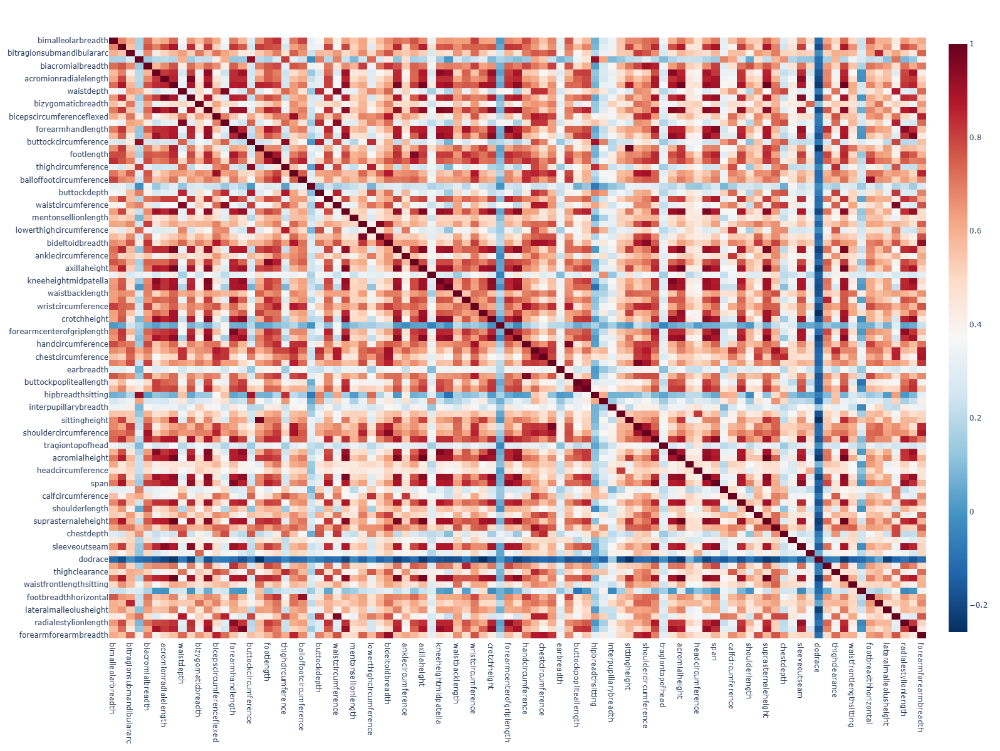

In [168]:
fig = px.imshow(corr_small,color_continuous_scale="RdBu_r",aspect="auto")

fig.update_layout(width=1400,height=1200)

fig.show()

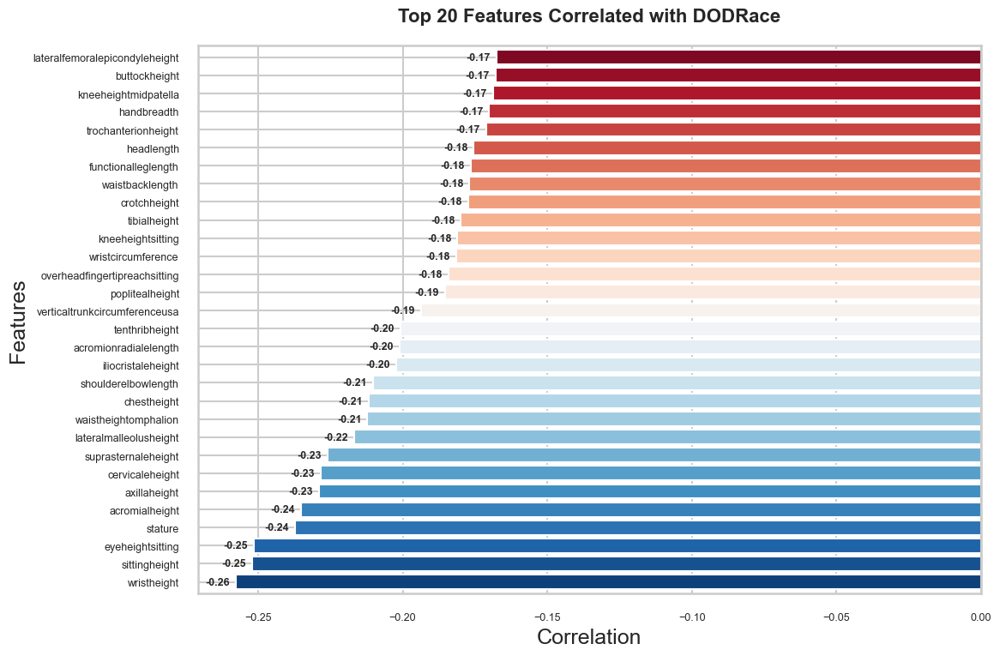

In [169]:
import matplotlib.pyplot as plt
import seaborn as sns

# DODRace ile korelasyonlar
corr_target = (
    df.corr(numeric_only=True)["dodrace"]
    .drop("dodrace")
)

# Mutlak değeri en yüksek 20 feature
top_corr = (corr_target.abs() .sort_values(ascending=False) .head(30) .index)

# Orijinal korelasyon değerlerini koru
correlations = corr_target[top_corr].sort_values()

plt.figure(figsize=(12, 8))
sns.set_style("whitegrid")

colors = sns.color_palette("RdBu_r", len(correlations))

ax = correlations.plot(kind="barh",color=colors, width=0.8)

ax.bar_label(ax.containers[0],fmt="%.2f", padding=5, fontsize=9,fontweight="bold")
ax.tick_params(axis='x', labelsize=9)
ax.tick_params(axis='y', labelsize=9)
plt.title( "Top 20 Features Correlated with DODRace",  fontsize=16,  pad=20, fontweight="bold")

plt.xlabel("Correlation")
plt.ylabel("Features")

plt.axvline( 0, color="black", linewidth=1)

plt.tight_layout()
plt.show()

In [170]:
def cat_summary(dataframe, col_name):
    print(pd.DataFrame({
        col_name: dataframe[col_name].value_counts(),
        "Ratio": 100 * dataframe[col_name].value_counts() / len(dataframe)
    }))
    print("#" * 40)

In [171]:
cat_cols = df.select_dtypes(include="object").columns

for col in cat_cols:
    cat_summary(df, col)

        gender      Ratio
gender                   
Male      4082  67.270929
Female    1986  32.729071
########################################
                          subjectsbirthlocation     Ratio
subjectsbirthlocation                                    
California                                  446  7.350033
New York                                    420  6.921556
Texas                                       397  6.542518
Indiana                                     266  4.383652
Oklahoma                                    221  3.642057
Illinois                                    216  3.559657
Florida                                     210  3.460778
Minnesota                                   200  3.295979
Michigan                                    196  3.230059
Mississippi                                 194  3.197100
Georgia                                     170  2.801582
Alabama                                     164  2.702703
South Carolina                             

In [172]:
usa_states = set([
    "California", "New York", "Texas", "Indiana", "Oklahoma", "Illinois", "Florida", "Minnesota", "Michigan",
    "Mississippi", "Georgia", "Alabama", "South Carolina", "North Carolina", "Ohio", "Louisiana", "Pennsylvania",
    "Virginia", "Massachusetts", "Wisconsin", "New Jersey", "Arizona","Missouri","Colorado","Maryland",
    "Tennessee","Kentucky","Washington","Kansas","South Dakota","Iowa","Arkansas","Connecticut",
    "Nebraska","Hawaii","Utah","West Virginia","Nevada","Idaho","Rhode Island",
    "District of Columbia","North Dakota","Maine","Delaware","New Mexico","New Hampshire",
    "Vermont","Montana","Alaska","Wyoming","US Virgin Islands","United States"
])

latin_america = set([
    "Puerto Rico","Mexico","Jamaica","Dominican Republic","Colombia","Haiti","Panama","Guam",
    "Guyana","Brazil","Peru","El Salvador","Ecuador","Barbados","Grenada","Honduras","Nicaragua","Cuba",
    "Liberia","Portugal","Chile","Argentina","Belize","Costa Rica","Paraguay","Venezuela",
    "Trinidad and Tobago","Antigua and Barbuda","Ghana","Togo","Ivory Coast",
    "Guatemala","Senegal"
])

europe = set([
    "Germany","United Kingdom","Russia","France","Italy","Poland","Belgium","Netherlands",
    "Romania","Israel","Spain","Denmark"
])

asia = set(["South Korea","China","Japan","Vietnam","India","Nepal","Taiwan","Iran","Sri Lanka","Korea"])

africa = set(["South Africa","Nigeria","Liberia","Kenya","Ethiopia"])

In [173]:
region_map = {}

for state in usa_states:
    region_map[state] = "USA and States"

for country in latin_america:
    region_map[country] = "Latin America and Caribbean"

for country in europe:
    region_map[country] = "Europe"

for country in asia:
    region_map[country] = "Asia"

for country in africa:
    region_map[country] = "Africa"


df["subjectsbirthlocation"] = df["subjectsbirthlocation"].map(region_map).fillna("Other")

In [174]:
df["subjectsbirthlocation"].value_counts(normalize=True) 

subjectsbirthlocation
USA and States                 0.885465
Latin America and Caribbean    0.049440
Other                          0.027521
Europe                         0.021918
Asia                           0.012690
Africa                         0.002966
Name: proportion, dtype: float64

In [175]:
df.subjectsbirthlocation.value_counts()

subjectsbirthlocation
USA and States                 5373
Latin America and Caribbean     300
Other                           167
Europe                          133
Asia                             77
Africa                           18
Name: count, dtype: int64

In [176]:
df.describe(include="object").T

,count,unique,top,freq
gender,6068,2,Male,4082
subjectsbirthlocation,6068,6,USA and States,5373
writingpreference,6068,3,Right hand,5350


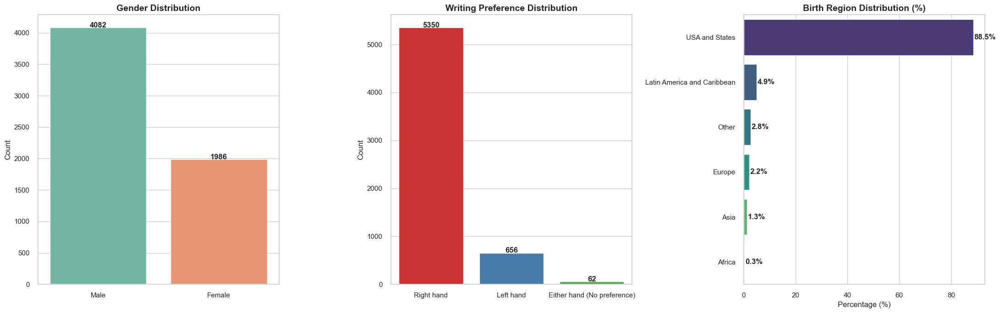

In [177]:
sns.set_theme(style="whitegrid")

fig, axes = plt.subplots(1, 3, figsize=(22, 7))


# 1. Gender Distribution
# =========================
gender_counts = df["gender"].value_counts()

sns.barplot( x=gender_counts.index, y=gender_counts.values, palette="Set2", ax=axes[0])

axes[0].set_title("Gender Distribution", fontsize=14, fontweight="bold")
axes[0].set_xlabel("")
axes[0].set_ylabel("Count")

# annotation
for i, v in enumerate(gender_counts.values):
    axes[0].text(i, v + 0.5, str(v), ha="center", fontweight="bold")



# 2. Writing Preference
# =========================
writing_counts = df["writingpreference"].value_counts()

sns.barplot(x=writing_counts.index, y=writing_counts.values, palette="Set1", ax=axes[1], order=writing_counts.index)

axes[1].set_title("Writing Preference Distribution", fontsize=14, fontweight="bold")
axes[1].set_xlabel("")
axes[1].set_ylabel("Count")

# annotation
for i, v in enumerate(writing_counts.values):
    axes[1].text(i, v + 0.5, str(v), ha="center", fontweight="bold")


# 3. Birth Region (%)
# =========================
region_pct = df["subjectsbirthlocation"].value_counts(normalize=True) * 100

sns.barplot( y=region_pct.index, x=region_pct.values, palette="viridis", ax=axes[2])

axes[2].set_title("Birth Region Distribution (%)", fontsize=14, fontweight="bold")
axes[2].set_xlabel("Percentage (%)")
axes[2].set_ylabel("")

# annotation (% label)
for i, v in enumerate(region_pct.values):
    axes[2].text(v + 0.3, i, f"{v:.1f}%", va="center", fontweight="bold")


# =========================
# Layout optimization
# =========================
plt.tight_layout()
plt.show()

In [178]:
# Drop DODRace class if value count below 500 (we assume that our data model can't learn if it is below 500) /  Değer sayısı 500'ün altındaysa DODRace sınıfını silin (500'ün altındaysa veri modelimizin öğrenemeyeceğini varsayıyoruz).
# Yönergesine dayanarak DODRace sınıfını 500 altında olan değişkenler silinecektir. 
#DODRace, ANSUR II veri setinde ABD Savunma Bakanlığı'nın (Department of Defense - DoD) standartlaştırılmış ırk sınıflandırmasını ifade eder. 
# Bu sütun, SubjectNumericRace sütunundan türetilmiştir ancak çoklu ırk kombinasyonlarını tek bir kategoriye indirger. Kodların anlamı
    # DODRace  Irk
    # 1   	   White
    # 2	       Black
    # 3	       Hispanic
    # 4	       Asian
    # 5	       Native American
    # 6	       Pacific Islander
    # 8	       Other


race_dict = { 
    1: "White",
    2: "Black",
    3: "Hispanic",
    4: "Asian",
    5: "Native American",
    6: "Pacific Islander",
    8: "Other"
}

DODRace_counts = df["dodrace"].value_counts().reset_index()

DODRace_counts.columns = ["DODRace", "Count"]

DODRace_counts["Race"] = DODRace_counts["DODRace"].map(race_dict)

DODRace_counts = DODRace_counts[["DODRace", "Race", "Count"]]

print(DODRace_counts)

   DODRace              Race  Count
0        1             White   3792
1        2             Black   1298
2        3          Hispanic    679
3        4             Asian    188
4        6  Pacific Islander     59
5        5   Native American     49
6        8             Other      3


In [179]:
valid_classes = DODRace_counts.loc[DODRace_counts["Count"] >= 500, "DODRace"]

df = df[df["dodrace"].isin(valid_classes)]
#filtreleme yaparak 500'den az örneğe sahip sınıfların bulunduğu satırları veri setinden çıkardık.

In [180]:
race_counts = (df["dodrace"]
    .value_counts()
    .sort_index()
    .reset_index()
)

race_counts.columns = ["DODRace", "Count"]

race_counts["Race"] = race_counts["DODRace"].map(race_dict)

race_counts = race_counts[["DODRace", "Race", "Count"]]

race_counts

# hedef değişkeni dengesizdir. inbalance datatipidir. 

,DODRace,Race,Count
0,1,White,3792
1,2,Black,1298
2,3,Hispanic,679


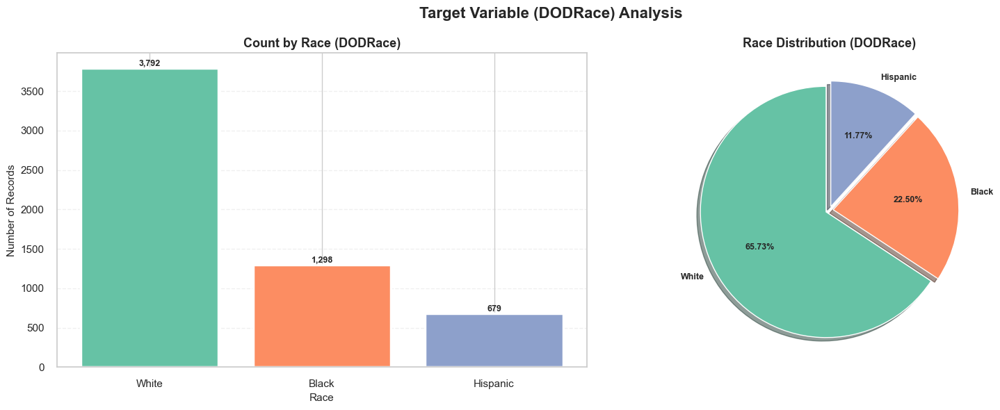

In [181]:
target_col = "dodrace"

# Race mapping (senin verdiğin tabloya göre)
race_map = {
    1: "White",
    2: "Black",
    3: "Hispanic"
}

# Count
dodrace_counts = df[target_col].value_counts().sort_index()
dodrace_counts.index = dodrace_counts.index.map(race_map)

# Grafik
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

colors = sns.color_palette("Set2", len(dodrace_counts))

# 1. Bar Chart - Count
bars = axes[0].bar(dodrace_counts.index, dodrace_counts.values, color=colors, linewidth=2.5)

axes[0].set_title('Count by Race (DODRace)', fontsize=13, fontweight='bold')
axes[0].set_xlabel('Race', fontsize=11)
axes[0].set_ylabel('Number of Records', fontsize=11)
axes[0].grid(True, alpha=0.3, axis='y', linestyle='--')

for bar in bars:
    height = bar.get_height()
    axes[0].text(bar.get_x() + bar.get_width()/2., height,
                f'{int(height):,}',
                ha='center', va='bottom',
                fontweight='bold', fontsize=9)

# 2. Pie Chart
wedges, texts, autotexts = axes[1].pie(
    dodrace_counts.values, 
    labels=dodrace_counts.index,
    autopct='%1.2f%%',
    colors=colors,
    startangle=90,
    explode=[0.03]*len(dodrace_counts),
    shadow=True,
    textprops={'fontsize': 9, 'fontweight': 'bold'}
)

axes[1].set_title('Race Distribution (DODRace)', fontsize=13, fontweight='bold')

plt.suptitle('Target Variable (DODRace) Analysis', fontsize=16, fontweight='bold')

plt.tight_layout()
plt.show()

# Feature Engineering

-  Yapılan araştırmada antropometrik verilerde (vücut ölçümleri) sadece ham verilerle değil, bu veriler arasındaki oranlarla (ratios) çalışmak etnik köken tahmininde çok daha güçlü sonuçlar verildiği görülmüştür.
-  93 ham ölçüm birbiriyle yüksek korelasyonlu (multikolinearite) oluşturabilir .
-  Boy farkı etnik gruplar arasındaki ölçüm farkını maskeleyebilir.
-  Oransal ölçümler oluşabilecek  bias'ı ortadan kaldırır.
-  Biyolojik literatürde kullanılan indeksler (cephalic index vb.) özellikle kafa yapısı güçlü bir özelliktir, etnik morfolojiyi daha iyi yakalar
-  BMI (Vücut Kitle Endeksi): weightkg ve stature (boy) kullanılarak hesaplanmalıdır (kg/m2 ).
-  Bu sebeple vücut Oranları: Etnik kökenler arasındaki morfolojik farkları yakalamak için oranlar oluşturulabilir .  

In [182]:
def add_features(df):
    """Antropometrik oranlar ve bileşik indeksler ekler."""

    # ── KAFA İNDEKSLERİ ─────────────────────────────
    df['cephalic_index']   = df['headbreadth'] / df['headlength'] * 100 # Cephalic Index: kafa şeklini tanımlar — brakisefal (geniş) vs dolikosefal (uzun)
    df['head_circ_length'] = df['headcircumference'] / df['headlength'] # Kafa çevresi / Baş uzunluğu oranı
    df['facial_index']     = df['mentonsellionlength'] / df['bizygomaticbreadth'] * 100 # Yüz indeksi (alın-çene uzunluğu / çıkıntı genişliği)
    df['ear_index']        = df['earbreadth'] / df['earlength'] * 100  # Kulak şekli indeksi

    # ── VÜCUT ORANLARI ──────────────────────────────
    df['bmi'] = df['weightkg'] / (df['stature'] / 100) ** 2   # BMI — basit ama güçlü

    df['sitting_height_ratio'] = df['sittingheight'] / df['stature'] * 100   # Sitting Height Ratio: gövde/toplam boy — Asya vs Avrupa farklı
    df['leg_to_height']        = (df['stature'] - df['sittingheight']) / df['stature']   # Bağıl bacak uzunluğu
    df['ape_index']            = df['span'] / df['stature']    # Ape index (kanat açıklığı / boy)

    # ── EL & AYAK ───────────────────────────────────
    df['foot_length_ratio']  = df['footlength'] / df['stature'] * 100
    df['foot_width_ratio']   = df['footbreadthhorizontal'] / df['footlength'] * 100
    df['hand_length_ratio']  = df['handlength'] / df['stature'] * 100
    df['hand_breadth_ratio'] = df['handbreadth'] / df['handlength'] * 100

    # ── ÜST VÜCUT ORANLARI─────────────────────────
    df['shoulder_hip_ratio'] = df['biacromialbreadth'] / df['hipbreadth']
    df['waist_hip_ratio']    = df['waistcircumference'] / df['buttockcircumference']
    df['chest_waist_ratio']  = df['chestcircumference'] / df['waistcircumference']

    # ── KOL ─────────────────────────────────────────
    df['arm_length_ratio']    = df['sleeveoutseam'] / df['stature'] * 100
    df['forearm_upper_ratio'] = df['radialestylionlength'] / df['acromionradialelength']

    # ── BACAK ───────────────────────────────────────
    df['tibia_femur_ratio']   = df['tibialheight'] / df['trochanterionheight']

    # ── BOYUN ───────────────────────────────────────
    df['neck_height_ratio']   = df['neckcircumference'] / df['stature'] * 100

    return df

In [183]:
df = add_features(df)
df.head(5)

,abdominalextensiondepthsitting,acromialheight,acromionradialelength,anklecircumference,axillaheight,balloffootcircumference,balloffootlength,biacromialbreadth,bicepscircumferenceflexed,bicristalbreadth,...,foot_width_ratio,hand_length_ratio,hand_breadth_ratio,shoulder_hip_ratio,waist_hip_ratio,chest_waist_ratio,arm_length_ratio,forearm_upper_ratio,tibia_femur_ratio,neck_height_ratio
0,266,1467,337,222,1347,253,202,401,369,274,...,36.996337,10.867117,46.632124,1.207831,0.953013,1.151125,33.783784,0.810089,0.534276,22.522523
1,233,1395,326,220,1293,245,193,394,338,257,...,37.262357,11.457109,44.102564,1.262821,0.921610,1.173563,33.137485,0.779141,0.518519,22.326675
2,287,1430,341,230,1327,256,196,427,408,261,...,38.148148,11.700288,45.812808,1.223496,0.914611,1.161826,34.812680,0.785924,0.519608,23.227666
3,234,1347,310,230,1239,262,199,401,359,262,...,39.700375,11.722054,46.907216,1.186391,0.864783,1.299883,33.232628,0.803226,0.525384,24.592145
4,250,1585,372,247,1478,267,224,435,356,263,...,36.393443,11.389760,43.119266,1.310241,0.843537,1.207373,33.490073,0.811828,0.535780,20.794148


In [184]:
new_feats = [
    'cephalic_index', 'head_circ_length', 'facial_index', 'ear_index',
    'bmi', 'sitting_height_ratio', 'leg_to_height', 'ape_index',
    'foot_length_ratio', 'foot_width_ratio', 'hand_length_ratio',
    'hand_breadth_ratio', 'shoulder_hip_ratio', 'waist_hip_ratio',
    'chest_waist_ratio', 'arm_length_ratio', 'forearm_upper_ratio',
    'tibia_femur_ratio', 'neck_height_ratio'
]

print(f"✅ {len(new_feats)} yeni feature eklendi.")
display(df[new_feats].describe().round(3))

✅ 19 yeni feature eklendi.


,cephalic_index,head_circ_length,facial_index,ear_index,bmi,sitting_height_ratio,leg_to_height,ape_index,foot_length_ratio,foot_width_ratio,hand_length_ratio,hand_breadth_ratio,shoulder_hip_ratio,waist_hip_ratio,chest_waist_ratio,arm_length_ratio,forearm_upper_ratio,tibia_femur_ratio,neck_height_ratio
count,5769.000,5769.000,5769.000,5769.000,5769.000,5769.000,5769.000,5769.000,5769.000,5769.000,5769.000,5769.000,5769.000,5769.000,5769.000,5769.000,5769.000,5769.000,5769.000
mean,77.401,2.903,85.812,56.342,2.703,52.359,0.476,1.029,15.345,37.572,11.045,44.910,1.151,0.895,1.122,33.656,0.792,0.519,21.889
std,3.421,0.073,5.324,5.018,0.400,1.366,0.014,0.029,0.545,1.720,0.442,2.418,0.110,0.070,0.069,1.082,0.036,0.012,1.841
min,66.047,2.679,69.333,39.189,1.535,46.541,0.409,0.915,13.480,31.250,9.550,34.562,0.764,0.701,0.870,28.354,0.654,0.457,17.223
25%,75.122,2.852,82.192,52.941,2.416,51.495,0.467,1.009,14.972,36.398,10.742,43.299,1.073,0.847,1.076,32.916,0.769,0.511,20.508
50%,77.157,2.894,85.714,56.250,2.676,52.422,0.476,1.027,15.347,37.545,11.026,44.928,1.165,0.894,1.119,33.627,0.791,0.520,21.855
75%,79.444,2.945,89.313,59.677,2.951,53.300,0.485,1.047,15.698,38.723,11.323,46.535,1.228,0.946,1.168,34.361,0.816,0.528,23.140
max,92.697,3.351,113.043,75.000,4.345,59.059,0.535,1.151,17.738,45.000,13.259,54.878,1.545,1.220,1.436,37.579,0.949,0.580,30.147


In [185]:
# Modeli sadece ham değişkenler yerine, onların daha anlamlı ve türetilmiş versiyonlarıyla eğitmek bazen daha iyi sonuç verdiği için ana datanın kopyası olan  df data verisinden  feature engineering de kullanılan featureler
# multicollinearity ve overfitting oluşmaması için silinecektir. 

cols_to_drop = [
    # KAFA
    "headbreadth",
    "headlength",
    "headcircumference",
    "mentonsellionlength",
    "bizygomaticbreadth",
    "earbreadth",
    "earlength",

    # VÜCUT
    "weightkg",
    "stature",
    "sittingheight",
    "span",

    # EL - AYAK
    "footlength",
    "footbreadthhorizontal",
    "handlength",
    "handbreadth",

    # ÜST VÜCUT
    "biacromialbreadth",
    "hipbreadth",
    "waistcircumference",
    "buttockcircumference",
    "chestcircumference",

    # KOL
    "sleeveoutseam",
    "radialestylionlength",
    "acromionradialelength",

    # BACAK
    "tibialheight",
    "trochanterionheight",

    # BOYUN
    "neckcircumference"
]

df = df.drop(columns=cols_to_drop)
df.head(5)

,abdominalextensiondepthsitting,acromialheight,anklecircumference,axillaheight,balloffootcircumference,balloffootlength,bicepscircumferenceflexed,bicristalbreadth,bideltoidbreadth,bimalleolarbreadth,...,foot_width_ratio,hand_length_ratio,hand_breadth_ratio,shoulder_hip_ratio,waist_hip_ratio,chest_waist_ratio,arm_length_ratio,forearm_upper_ratio,tibia_femur_ratio,neck_height_ratio
0,266,1467,222,1347,253,202,369,274,493,71,...,36.996337,10.867117,46.632124,1.207831,0.953013,1.151125,33.783784,0.810089,0.534276,22.522523
1,233,1395,220,1293,245,193,338,257,479,67,...,37.262357,11.457109,44.102564,1.262821,0.921610,1.173563,33.137485,0.779141,0.518519,22.326675
2,287,1430,230,1327,256,196,408,261,544,75,...,38.148148,11.700288,45.812808,1.223496,0.914611,1.161826,34.812680,0.785924,0.519608,23.227666
3,234,1347,230,1239,262,199,359,262,518,73,...,39.700375,11.722054,46.907216,1.186391,0.864783,1.299883,33.232628,0.803226,0.525384,24.592145
4,250,1585,247,1478,267,224,356,263,524,80,...,36.393443,11.389760,43.119266,1.310241,0.843537,1.207373,33.490073,0.811828,0.535780,20.794148


In [186]:
# Data setimizi ara ara csv dosyası olarak kaydetmek iyidir, özellikle EDA sonrası sıfırdan çalıştırmak zorunda kalmayız

df.to_csv("ANSUR II Public_EDA.csv", index = False)

# index=False parametresi, indeks sütununu dahil etmeden df in diğer sütunlarını CSV dosyasına aktarır. 
# Bu parametre, dosyanın daha düzenli ve anlaşılır olmasını sağlar.

# DATA Preprocessing
- In this step we divide our data to X(Features) and y(Target) then ,
- To train and evaluation purposes we create train and test sets,
- Lastly, scale our data if features not in same scale. Why?

In [2]:
df = pd.read_csv("ANSUR II Public_EDA.csv")

In [3]:
df.head()

,abdominalextensiondepthsitting,acromialheight,anklecircumference,axillaheight,balloffootcircumference,balloffootlength,bicepscircumferenceflexed,bicristalbreadth,bideltoidbreadth,bimalleolarbreadth,...,foot_width_ratio,hand_length_ratio,hand_breadth_ratio,shoulder_hip_ratio,waist_hip_ratio,chest_waist_ratio,arm_length_ratio,forearm_upper_ratio,tibia_femur_ratio,neck_height_ratio
0,266,1467,222,1347,253,202,369,274,493,71,...,36.996337,10.867117,46.632124,1.207831,0.953013,1.151125,33.783784,0.810089,0.534276,22.522523
1,233,1395,220,1293,245,193,338,257,479,67,...,37.262357,11.457109,44.102564,1.262821,0.921610,1.173563,33.137485,0.779141,0.518519,22.326675
2,287,1430,230,1327,256,196,408,261,544,75,...,38.148148,11.700288,45.812808,1.223496,0.914611,1.161826,34.812680,0.785924,0.519608,23.227666
3,234,1347,230,1239,262,199,359,262,518,73,...,39.700375,11.722054,46.907216,1.186391,0.864783,1.299883,33.232628,0.803226,0.525384,24.592145
4,250,1585,247,1478,267,224,356,263,524,80,...,36.393443,11.389760,43.119266,1.310241,0.843537,1.207373,33.490073,0.811828,0.535780,20.794148


In [4]:
X = df.drop("dodrace", axis = 1)
y = df["dodrace"]

In [5]:
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size = 0.2,stratify=y, random_state=42)

In [6]:
numeric_col = df.drop("dodrace", axis =1).select_dtypes(include ="number").columns
numeric_col

Index(['abdominalextensiondepthsitting', 'acromialheight',
       'anklecircumference', 'axillaheight', 'balloffootcircumference',
       'balloffootlength', 'bicepscircumferenceflexed', 'bicristalbreadth',
       'bideltoidbreadth', 'bimalleolarbreadth', 'bitragionchinarc',
       'bitragionsubmandibulararc', 'buttockdepth', 'buttockheight',
       'buttockkneelength', 'buttockpopliteallength', 'calfcircumference',
       'cervicaleheight', 'chestbreadth', 'chestdepth', 'chestheight',
       'crotchheight', 'crotchlengthomphalion',
       'crotchlengthposterioromphalion', 'earprotrusion', 'elbowrestheight',
       'eyeheightsitting', 'forearmcenterofgriplength',
       'forearmcircumferenceflexed', 'forearmforearmbreadth',
       'forearmhandlength', 'functionalleglength', 'handcircumference',
       'heelanklecircumference', 'heelbreadth', 'hipbreadthsitting',
       'iliocristaleheight', 'interpupillarybreadth', 'interscyei',
       'interscyeii', 'kneeheightmidpatella', 'kneeheight

In [7]:
cat_col =  df.select_dtypes(include ="object").columns
cat_col

Index(['gender', 'subjectsbirthlocation', 'writingpreference'], dtype='str')

In [8]:
# Scale ölçekleme işlemi çalışacak modellerden Logistic Regression , SVM Classifier gerekli; Random Forest Classifier ve XGBoost Classifier ölçeksiz de çalışır.

# column_transformer = make_column_transformer(
   # (StandardScaler(), numeric_col),       # For Scaling 
   # (OneHotEncoder(), cat_col) )    # For Encoding 


# Modelling
- Fit the model with train dataset
- Get predict from vanilla model on both train and test sets to examine if there is over/underfitting   
- Apply GridseachCV for both hyperparemeter tuning and sanity test of our model.
- Use hyperparameters that you find from gridsearch and make final prediction and evaluate the result according to chosen metric.

In [9]:
def eval_metric(model, X_train, y_train, X_test, y_test):
    y_train_pred = model.predict(X_train)
    y_pred = model.predict(X_test)
    
    print("Test_Set")
    print(confusion_matrix(y_test, y_pred))
    print(classification_report(y_test, y_pred))
    print()
    print("Train_Set")
    print(confusion_matrix(y_train, y_train_pred))
    print(classification_report(y_train, y_train_pred))

## Logistic model

In [13]:
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, StandardScaler

preprocessor = ColumnTransformer(
    transformers=[('num', StandardScaler(), numeric_col),
        ('cat', OneHotEncoder(handle_unknown='ignore', sparse_output=False, drop='first'), cat_col)],
    remainder='passthrough')

In [46]:
log_model = Pipeline(steps=[("preprocessor", preprocessor), ("logistic", LogisticRegression(max_iter=1000))])

log_model.fit(X_train, y_train)

,steps,"[('preprocessor', ...), ('logistic', ...)]"
,transform_input,None
,memory,None
,verbose,False
,"transformers transformers: list of tuplesList of (name, transformer, columns) tuples specifying thetransformer objects to be applied to subsets of the data.name : str Like in Pipeline and FeatureUnion, this allows the transformer and its parameters to be set using ``set_params`` and searched in grid search.transformer : {'drop', 'passthrough'} or estimator Estimator must support :term:`fit` and :term:`transform`. Special-cased strings 'drop' and 'passthrough' are accepted as well, to indicate to drop the columns or to pass them through untransformed, respectively.columns : str, array-like of str, int, array-like of int, array-like of bool, slice or callable Indexes the data on its second axis. Integers are interpreted as positional columns, while strings can reference DataFrame columns by name. A scalar string or int should be used where ``transformer`` expects X to be a 1d array-like (vector), otherwise a 2d array will be passed to the transformer. A callable is passed the input data `X` and can return any of the above. To select multiple columns by name or dtype, you can use :obj:`make_column_selector`.","[('num', ...), ('cat', ...)]"
,"remainder remainder: {'drop', 'passthrough'} or estimator, default='drop'By default, only the specified columns in `transformers` aretransformed and combined in the output, and the non-specifiedcolumns are dropped. (default of ``'drop'``).By specifying ``remainder='passthrough'``, all remaining columns thatwere not specified in `transformers`, but present in the data passedto `fit` will be automatically passed through. This subset of columnsis concatenated with the output of the transformers. For dataframes,extra columns not seen during `fit` will be excluded from the outputof `transform`.By setting ``remainder`` to be an estimator, the remainingnon-specified columns will use the ``remainder`` estimator. Theestimator must support :term:`fit` and :term:`transform`.Note that using this feature requires that the DataFrame columnsinput at :term:`fit` and :term:`transform` have identical order.",'passthrough'
,"sparse_threshold sparse_threshold: float, default=0.3If the output of the different transformers contains sparse matrices,these will be stacked as a sparse matrix if the overall density islower than this value. Use ``sparse_threshold=0`` to always returndense. When the transformed output consists of all dense data, thestacked result will be dense, and this keyword will be ignored.",0.3
,"n_jobs n_jobs: int, default=NoneNumber of jobs to run in parallel.``None`` means 1 unless in a :obj:`joblib.parallel_backend` context.``-1`` means using all processors. See :term:`Glossary `for more details.",None
,"transformer_weights transformer_weights: dict, default=NoneMultiplicative weights for features per transformer. The output of thetransformer is multiplied by these weights. Keys are transformer names,values the weights.",None
,"verbose verbose: bool, default=FalseIf True, the time elapsed while fitting each transformer will beprinted as it is completed.",False
,"verbose_feature_names_out verbose_feature_names_out: bool, str or Callable[[str, str], str], default=True- If True, :meth:`ColumnTransformer.get_feature_names_out` will prefix all feature names with the name of the transformer that generated that feature. It is equivalent to setting `verbose_feature_names_out=""{transformer_name}__{feature_name}""`.- If False, :meth:`ColumnTransformer.get_feature_names_out` will not prefix any feature names and will error if feature names are not unique.- If ``Callable[[str, str], str]``, :meth:`ColumnTransformer.get_feature_names_out` will rename all the features using the name of the transformer. The first argument of the callable is the transformer name and the second argument is the feature name. The returned string will be the new feature name.- If ``str``, it must be a string ready for formatting

In [47]:
from sklearn.metrics import accuracy_score, f1_score, recall_score, roc_auc_score, precision_score

y_pred = log_model.predict(X_test)
y_pred_proba = log_model.predict_proba(X_test)

log_accuracy = accuracy_score(y_test, y_pred)

log_f1 = f1_score(y_test, y_pred,average="macro") # Multiclass için average parametresi verildi 

log_recall = recall_score(y_test,y_pred, average="macro")

log_precision = precision_score(y_test,y_pred, average="macro")

log_auc = roc_auc_score(y_test,y_pred_proba, multi_class="ovr")

print(f"Accuracy : {log_accuracy:.4f}")
print(f"F1 Score : {log_f1:.4f}")
print(f"Recall   : {log_recall:.4f}")
print(f"Percision : {log_precision:.4f}")
print(f"ROC AUC  : {log_auc:.4f}")

Accuracy : 0.8873
F1 Score : 0.7998
Recall   : 0.7807
Percision : 0.8316
ROC AUC  : 0.9213


In [48]:
eval_metric(log_model, X_train, y_train, X_test, y_test)

#Model, test seti üzerinde %89 accuracy ve %88 weighted F1-score elde ederek genel anlamda güçlü bir sınıflandırma performansı göstermiştir. 
# Eğitim ve test performanslarının birbirine yakın olması, modelin overfitting yapmadığını ve iyi genelleme kapasitesine sahip olduğunu göstermektedir.
#Logistic Regression modeli güçlü bir baseline performansı sunmaktadır. Ancak lineer yapısı nedeniyle karmaşık ve az temsil edilen sınıfları (özellikle Class 3) ayırt etmede sınırlı kalmaktadır.

Test_Set
[[722  12  24]
 [ 17 237   6]
 [ 58  13  65]]
              precision    recall  f1-score   support

           1       0.91      0.95      0.93       758
           2       0.90      0.91      0.91       260
           3       0.68      0.48      0.56       136

    accuracy                           0.89      1154
   macro avg       0.83      0.78      0.80      1154
weighted avg       0.88      0.89      0.88      1154


Train_Set
[[2951   35   48]
 [  61  956   21]
 [ 227   39  277]]
              precision    recall  f1-score   support

           1       0.91      0.97      0.94      3034
           2       0.93      0.92      0.92      1038
           3       0.80      0.51      0.62       543

    accuracy                           0.91      4615
   macro avg       0.88      0.80      0.83      4615
weighted avg       0.90      0.91      0.90      4615



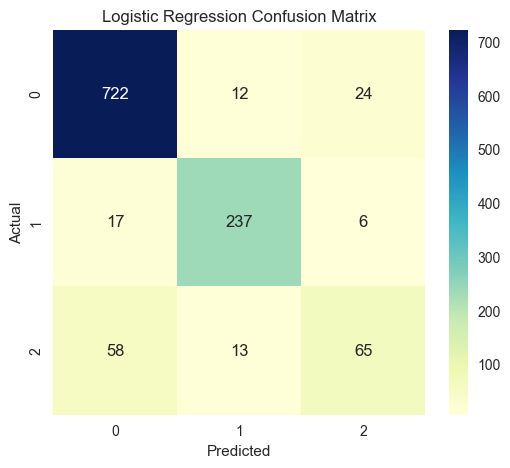

In [49]:
from sklearn.metrics import confusion_matrix

y_pred = log_model.predict(X_test)
cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt='d', cmap='YlGnBu')

plt.title("Logistic Regression Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

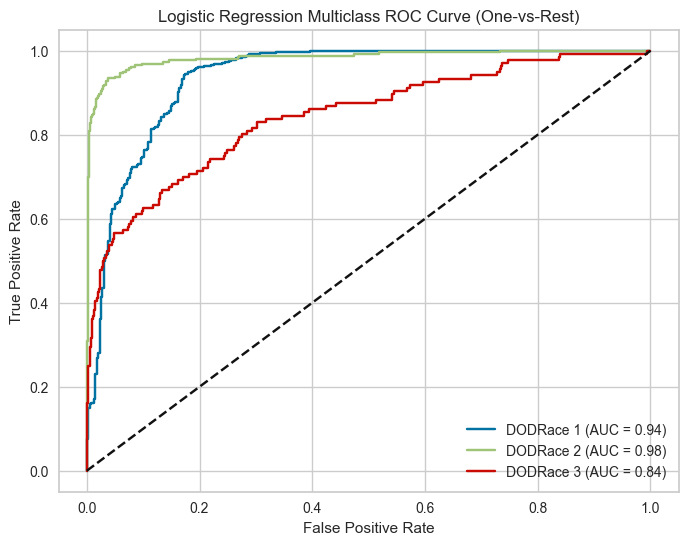

In [50]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc

# Proba tahminleri
y_score = log_model.predict_proba(X_test)

# DODRace sınıfları al
dodrace = np.unique(y_test)

# Binary format
y_test_bin = label_binarize(y_test, classes=dodrace)

plt.figure(figsize=(8,6))

# Her DODRace sınıfı için ROC curve
for i in range(len(dodrace)):
    fpr, tpr, _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc = auc(fpr, tpr)

    plt.plot(fpr, tpr, label=f"DODRace {dodrace[i]} (AUC = {roc_auc:.2f})"    )

# Random model çizgisi
plt.plot([0, 1], [0, 1], "k--")

plt.title("Logistic Regression Multiclass ROC Curve (One-vs-Rest)")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend()
plt.grid(True)
plt.show()

In [51]:
from sklearn.metrics import get_scorer_names
scorers = get_scorer_names()
print(scorers)

['accuracy', 'adjusted_mutual_info_score', 'adjusted_rand_score', 'average_precision', 'balanced_accuracy', 'completeness_score', 'd2_absolute_error_score', 'd2_brier_score', 'd2_log_loss_score', 'explained_variance', 'f1', 'f1_macro', 'f1_micro', 'f1_samples', 'f1_weighted', 'fowlkes_mallows_score', 'homogeneity_score', 'jaccard', 'jaccard_macro', 'jaccard_micro', 'jaccard_samples', 'jaccard_weighted', 'matthews_corrcoef', 'mutual_info_score', 'neg_brier_score', 'neg_log_loss', 'neg_max_error', 'neg_mean_absolute_error', 'neg_mean_absolute_percentage_error', 'neg_mean_gamma_deviance', 'neg_mean_poisson_deviance', 'neg_mean_squared_error', 'neg_mean_squared_log_error', 'neg_median_absolute_error', 'neg_negative_likelihood_ratio', 'neg_root_mean_squared_error', 'neg_root_mean_squared_log_error', 'normalized_mutual_info_score', 'positive_likelihood_ratio', 'precision', 'precision_macro', 'precision_micro', 'precision_samples', 'precision_weighted', 'r2', 'rand_score', 'recall', 'recall_m

In [52]:
model = Pipeline(steps=[("preprocessor", preprocessor),("logistic", LogisticRegression(max_iter=1000))])

scores = cross_validate(
    model,
    X_train,
    y_train,
    scoring={
        "precision": "precision_macro",
        "recall": "recall_macro",
        "f1": "f1_macro",
        "accuracy": "accuracy"
    },
    cv=10,
    return_train_score=True
)
df_scores = pd.DataFrame(scores, index = range(1, 11))
df_scores.mean()[2:]

test_precision     0.844403
train_precision    0.877466
test_recall        0.778545
train_recall       0.801440
test_f1            0.801348
train_f1           0.828996
test_accuracy      0.889931
train_accuracy     0.906200
dtype: float64

In [53]:
log_model.get_params()

{'memory': None,
 'steps': [('preprocessor',
   ColumnTransformer(remainder='passthrough',
                     transformers=[('num', StandardScaler(),
                                    Index(['abdominalextensiondepthsitting', 'acromialheight',
          'anklecircumference', 'axillaheight', 'balloffootcircumference',
          'balloffootlength', 'bicepscircumferenceflexed', 'bicristalbreadth',
          'bideltoidbreadth', 'bimalleolarbreadth', 'bitragionchinarc',
          'bitragionsubmandibulararc...
          'foot_length_ratio', 'foot_width_ratio', 'hand_length_ratio',
          'hand_breadth_ratio', 'shoulder_hip_ratio', 'waist_hip_ratio',
          'chest_waist_ratio', 'arm_length_ratio', 'forearm_upper_ratio',
          'tibia_femur_ratio', 'neck_height_ratio'],
         dtype='str')),
                                   ('cat',
                                    OneHotEncoder(drop='first',
                                                  handle_unknown='ignore',
         

In [54]:
from sklearn.model_selection import GridSearchCV
import numpy as np

grid_pipeline = Pipeline( steps=[("preprocessor", preprocessor),("logistic", LogisticRegression(max_iter=2000))])

C = np.logspace(-2, 3, 15)

param_grid = [
    {
        "logistic__penalty": ["l2"],
        "logistic__solver": ["lbfgs", "saga"],
        "logistic__C": C,
        "logistic__class_weight": ["balanced", None]
    },
    {
        "logistic__penalty": ["l1"],
        "logistic__solver": ["saga"],  
        "logistic__C": C,
        "logistic__class_weight": ["balanced", None]
    }
]

log_grid_model = GridSearchCV(
    estimator=grid_pipeline,
    param_grid=param_grid,
    cv=5,
    scoring="f1_macro",  
    n_jobs=-1,
    verbose=1,
    refit=True
)

log_grid_model.fit(X_train, y_train)

Fitting 5 folds for each of 90 candidates, totalling 450 fits


,"estimator estimator: estimator objectThis is assumed to implement the scikit-learn estimator interface.Either estimator needs to provide a ``score`` function,or ``scoring`` must be passed.",Pipeline(step..._iter=2000))])
,"param_grid param_grid: dict or list of dictionariesDictionary with parameters names (`str`) as keys and lists ofparameter settings to try as values, or a list of suchdictionaries, in which case the grids spanned by each dictionaryin the list are explored. This enables searching over any sequenceof parameter settings.","[{'logistic__C': array([1.0000...00000000e+03]), 'logistic__class_weight': ['balanced', None], 'logistic__penalty': ['l2'], 'logistic__solver': ['lbfgs', 'saga']}, {'logistic__C': array([1.0000...00000000e+03]), 'logistic__class_weight': ['balanced', None], 'logistic__penalty': ['l1'], 'logistic__solver': ['saga']}]"
,"scoring scoring: str, callable, list, tuple or dict, default=NoneStrategy to evaluate the performance of the cross-validated model onthe test set.If `scoring` represents a single score, one can use:- a single string (see :ref:`scoring_string_names`);- a callable (see :ref:`scoring_callable`) that returns a single value;- `None`, the `estimator`'s :ref:`default evaluation criterion ` is used.If `scoring` represents multiple scores, one can use:- a list or tuple of unique strings;- a callable returning a dictionary where the keys are the metric names and the values are the metric scores;- a dictionary with metric names as keys and callables as values.See :ref:`multimetric_grid_search` for an example.",'f1_macro'
,"n_jobs n_jobs: int, default=NoneNumber of jobs to run in parallel.``None`` means 1 unless in a :obj:`joblib.parallel_backend` context.``-1`` means using all processors. See :term:`Glossary `for more details... versionchanged:: v0.20 `n_jobs` default changed from 1 to None",-1
,"refit refit: bool, str, or callable, default=TrueRefit an estimator using the best found parameters on the wholedataset.For multiple metric evaluation, this needs to be a `str` denoting thescorer that would be used to find the best parameters for refittingthe estimator at the end.Where there are considerations other than maximum score inchoosing a best estimator, ``refit`` can be set to a function whichreturns the selected ``best_index_`` given ``cv_results_``. In thatcase, the ``best_estimator_`` and ``best_params_`` will be setaccording to the returned ``best_index_`` while the ``best_score_``attribute will not be available.The refitted estimator is made available at the ``best_estimator_``attribute and permits using ``predict`` directly on this``GridSearchCV`` instance.Also for multiple metric evaluation, the attributes ``best_index_``,``best_score_`` and ``best_params_`` will only be available if``refit`` is set and all of them will be determined w.r.t this specificscorer.See ``scoring`` parameter to know more about multiple metricevaluation.See :ref:`sphx_glr_auto_examples_model_selection_plot_grid_search_digits.py`to see how to design a custom selection strategy using a callablevia `refit`.See :ref:`this example`for an example of how to use ``refit=callable`` to balance modelcomplexity and cross-validated score... versionchanged:: 0.20 Support for callable added.",True
,"cv cv: int, cross-validation generator or an iterable, default=NoneDetermines the cross-validation splitting strategy.Possible inputs for cv are:- None, to use the default 5-fold cross validation,- integer, to specify the number of folds in a `(Stratified)KFold`,- :term:`CV splitter`,- An iterable yielding (train, test) splits as arrays of indices.For integer/None inputs, if the estimator is a classifier and ``y`` iseither binary or multiclass, :class:`StratifiedKFold` is used. In allother cases, :class:`KFold` is used. These splitters are instantiatedwith `shuffle=False` so the splits will be the same across calls.Refer :ref:`User Guide ` for the variouscross-validation strategies that can be used here... versionchanged::

In [55]:
log_grid_model.best_estimator_

,steps,"[('preprocessor', ...), ('logistic', ...)]"
,transform_input,None
,memory,None
,verbose,False
,"transformers transformers: list of tuplesList of (name, transformer, columns) tuples specifying thetransformer objects to be applied to subsets of the data.name : str Like in Pipeline and FeatureUnion, this allows the transformer and its parameters to be set using ``set_params`` and searched in grid search.transformer : {'drop', 'passthrough'} or estimator Estimator must support :term:`fit` and :term:`transform`. Special-cased strings 'drop' and 'passthrough' are accepted as well, to indicate to drop the columns or to pass them through untransformed, respectively.columns : str, array-like of str, int, array-like of int, array-like of bool, slice or callable Indexes the data on its second axis. Integers are interpreted as positional columns, while strings can reference DataFrame columns by name. A scalar string or int should be used where ``transformer`` expects X to be a 1d array-like (vector), otherwise a 2d array will be passed to the transformer. A callable is passed the input data `X` and can return any of the above. To select multiple columns by name or dtype, you can use :obj:`make_column_selector`.","[('num', ...), ('cat', ...)]"
,"remainder remainder: {'drop', 'passthrough'} or estimator, default='drop'By default, only the specified columns in `transformers` aretransformed and combined in the output, and the non-specifiedcolumns are dropped. (default of ``'drop'``).By specifying ``remainder='passthrough'``, all remaining columns thatwere not specified in `transformers`, but present in the data passedto `fit` will be automatically passed through. This subset of columnsis concatenated with the output of the transformers. For dataframes,extra columns not seen during `fit` will be excluded from the outputof `transform`.By setting ``remainder`` to be an estimator, the remainingnon-specified columns will use the ``remainder`` estimator. Theestimator must support :term:`fit` and :term:`transform`.Note that using this feature requires that the DataFrame columnsinput at :term:`fit` and :term:`transform` have identical order.",'passthrough'
,"sparse_threshold sparse_threshold: float, default=0.3If the output of the different transformers contains sparse matrices,these will be stacked as a sparse matrix if the overall density islower than this value. Use ``sparse_threshold=0`` to always returndense. When the transformed output consists of all dense data, thestacked result will be dense, and this keyword will be ignored.",0.3
,"n_jobs n_jobs: int, default=NoneNumber of jobs to run in parallel.``None`` means 1 unless in a :obj:`joblib.parallel_backend` context.``-1`` means using all processors. See :term:`Glossary `for more details.",None
,"transformer_weights transformer_weights: dict, default=NoneMultiplicative weights for features per transformer. The output of thetransformer is multiplied by these weights. Keys are transformer names,values the weights.",None
,"verbose verbose: bool, default=FalseIf True, the time elapsed while fitting each transformer will beprinted as it is completed.",False
,"verbose_feature_names_out verbose_feature_names_out: bool, str or Callable[[str, str], str], default=True- If True, :meth:`ColumnTransformer.get_feature_names_out` will prefix all feature names with the name of the transformer that generated that feature. It is equivalent to setting `verbose_feature_names_out=""{transformer_name}__{feature_name}""`.- If False, :meth:`ColumnTransformer.get_feature_names_out` will not prefix any feature names and will error if feature names are not unique.- If ``Callable[[str, str], str]``, :meth:`ColumnTransformer.get_feature_names_out` will rename all the features using the name of the transformer. The first argument of the callable is the transformer name and the second argument is the feature name. The returned string will be the new feature name.- If ``str``, it must be a string ready for formatting

In [56]:
log_grid_model.best_params_


{'logistic__C': np.float64(1.3894954943731375),
 'logistic__class_weight': None,
 'logistic__penalty': 'l2',
 'logistic__solver': 'saga'}

In [57]:
log_grid_model.best_score_

np.float64(0.8036475965521929)

In [58]:

y_pred = log_grid_model.predict(X_test)
y_pred_proba = log_grid_model.predict_proba(X_test)

log_grid_accuracy = accuracy_score(y_test, y_pred)

log_grid_f1 = f1_score(y_test, y_pred,average="macro") # Multiclass için average parametresi verildi 

log_grid_recall = recall_score(y_test,y_pred, average="macro")

log_grid_precision = precision_score(y_test,y_pred, average="macro")

log_grid_auc = roc_auc_score(y_test,y_pred_proba, multi_class="ovr")

print(f"Accuracy : {log_grid_accuracy:.4f}")
print(f"F1 Score : {log_grid_f1:.4f}")
print(f"Recall   : {log_grid_recall:.4f}")
print(f"Percision : {log_grid_precision:.4f}")
print(f"ROC AUC  : {log_grid_auc:.4f}")

Accuracy : 0.8856
F1 Score : 0.7963
Recall   : 0.7769
Percision : 0.8288
ROC AUC  : 0.9212


In [33]:
eval_metric(log_grid_model, X_train, y_train, X_test, y_test)

Test_Set
[[722  12  24]
 [ 18 236   6]
 [ 58  14  64]]
              precision    recall  f1-score   support

           1       0.90      0.95      0.93       758
           2       0.90      0.91      0.90       260
           3       0.68      0.47      0.56       136

    accuracy                           0.89      1154
   macro avg       0.83      0.78      0.80      1154
weighted avg       0.88      0.89      0.88      1154


Train_Set
[[2953   34   47]
 [  59  958   21]
 [ 225   38  280]]
              precision    recall  f1-score   support

           1       0.91      0.97      0.94      3034
           2       0.93      0.92      0.93      1038
           3       0.80      0.52      0.63       543

    accuracy                           0.91      4615
   macro avg       0.88      0.80      0.83      4615
weighted avg       0.90      0.91      0.90      4615



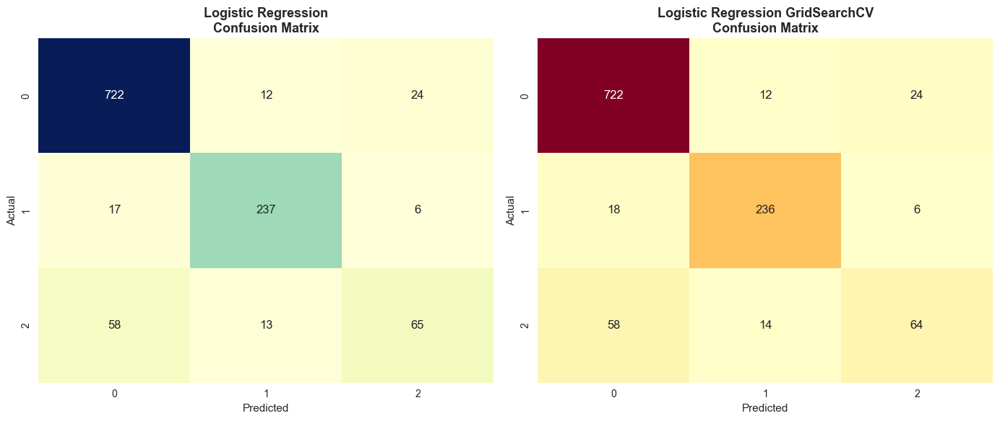

In [59]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Tahminler
y_pred_log = log_model.predict(X_test)
y_pred_grid = log_grid_model.predict(X_test)

# Confusion Matrix'ler
cm_log = confusion_matrix(y_test, y_pred_log)
cm_grid = confusion_matrix(y_test, y_pred_grid)

# Yan yana grafikler
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Logistic Regression
sns.heatmap(cm_log, annot=True, fmt="d", cmap='YlGnBu', ax=axes[0], cbar=False)

axes[0].set_title("Logistic Regression\nConfusion Matrix", fontsize=13, fontweight="bold")
axes[0].set_xlabel("Predicted")
axes[0].set_ylabel("Actual")

# Logistic Regression GridSearchCV
sns.heatmap(cm_grid, annot=True, fmt="d", cmap= 'YlOrRd', ax=axes[1], cbar=False)

axes[1].set_title("Logistic Regression GridSearchCV\nConfusion Matrix",fontsize=13,fontweight="bold")
axes[1].set_xlabel("Predicted")
axes[1].set_ylabel("Actual")

plt.tight_layout()
plt.show()

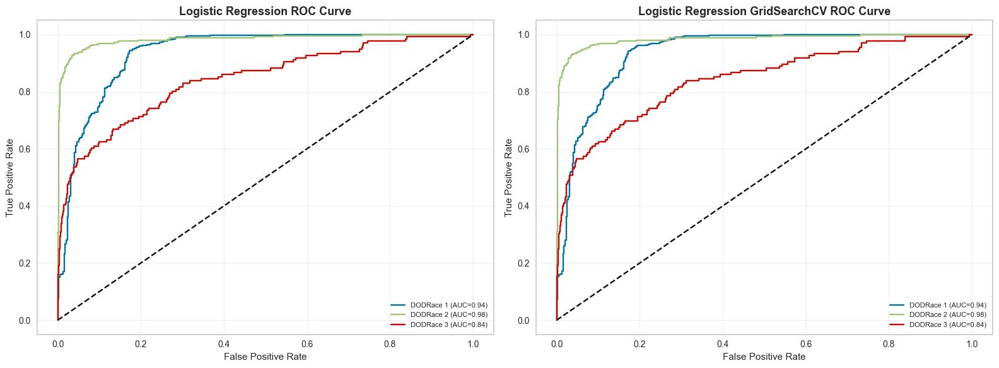

In [60]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc

# Tahmin olasılıkları
y_score_log = log_model.predict_proba(X_test)
y_score_grid = log_grid_model.predict_proba(X_test)

# Sınıflar
dodrace = np.unique(y_test)

# One-vs-Rest için binarize
y_test_bin = label_binarize(y_test, classes=dodrace)

# Yan yana grafikler
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# =========================
# Logistic Regression
# =========================
for i in range(len(dodrace)):

    fpr, tpr, _ = roc_curve( y_test_bin[:, i], y_score_log[:, i] )

    roc_auc = auc(fpr, tpr)

    axes[0].plot(fpr, tpr, label=f"DODRace {dodrace[i]} (AUC={roc_auc:.2f})" )

axes[0].plot([0, 1], [0, 1], "k--")

axes[0].set_title("Logistic Regression ROC Curve", fontsize=13, fontweight="bold")

axes[0].set_xlabel("False Positive Rate")
axes[0].set_ylabel("True Positive Rate")
axes[0].legend(fontsize=8)
axes[0].grid(alpha=0.3)

# =========================
# Logistic Regression GridSearchCV
# =========================
for i in range(len(dodrace)):

    fpr, tpr, _ = roc_curve(y_test_bin[:, i], y_score_grid[:, i])

    roc_auc = auc(fpr, tpr)

    axes[1].plot(fpr, tpr,label=f"DODRace {dodrace[i]} (AUC={roc_auc:.2f})"    )

axes[1].plot([0, 1], [0, 1], "k--")

axes[1].set_title("Logistic Regression GridSearchCV ROC Curve", fontsize=13, fontweight="bold")

axes[1].set_xlabel("False Positive Rate")
axes[1].set_ylabel("True Positive Rate")
axes[1].legend(fontsize=8)
axes[1].grid(alpha=0.3)

plt.tight_layout()
plt.show()

## SVC

In [79]:
preprocessor = ColumnTransformer(
    transformers=[('num', StandardScaler(), numeric_col),
        ('cat', OneHotEncoder(handle_unknown='ignore', sparse_output=False, drop='first'), cat_col)],
    remainder='passthrough')

In [80]:
from sklearn.svm import SVC
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder

# ön işlem 
preprocessor = ColumnTransformer(
    transformers=[('num', StandardScaler(), numeric_col),
        ('cat', OneHotEncoder(handle_unknown='ignore', sparse_output=False, drop='first'), cat_col)],
    remainder='passthrough')

# SVM Classifier Pipeline
svm_model = Pipeline([
    ("preprocessor", preprocessor),
    ("classifier", SVC(
                        kernel="rbf",
                        C=1,
                        gamma="scale",
                        probability=True,
                        random_state=42
                        ))
                        ])

# Model eğitimi
svm_model.fit(X_train, y_train)

#ANSUR II verisinde DODRace tahmini yapıyorsan hedef değişkenin çok sınıflı (multiclass) ve antropometrik ölçümler arasındaki ilişki büyük ihtimalle doğrusal değildir.BF kernel doğrusal olmayan sınırları öğrenebilir
# ve çok boyutlu biyometrik verilerde genellikle linear kerneldan daha başarılıdır. Birçok çok sınıflı sınıflandırma probleminde RBF kernel en güçlü başlangıç noktası olarak kabul edilir

,"steps steps: list of tuplesList of (name of step, estimator) tuples that are to be chained insequential order. To be compatible with the scikit-learn API, all stepsmust define `fit`. All non-last steps must also define `transform`. See:ref:`Combining Estimators ` for more details.","[('preprocessor', ...), ('classifier', ...)]"
,"transform_input transform_input: list of str, default=NoneThe names of the :term:`metadata` parameters that should be transformed by thepipeline before passing it to the step consuming it.This enables transforming some input arguments to ``fit`` (other than ``X``)to be transformed by the steps of the pipeline up to the step which requiresthem. Requirement is defined via :ref:`metadata routing `.For instance, this can be used to pass a validation set through the pipeline.You can only set this if metadata routing is enabled, which youcan enable using ``sklearn.set_config(enable_metadata_routing=True)``... versionadded:: 1.6",None
,"memory memory: str or object with the joblib.Memory interface, default=NoneUsed to cache the fitted transformers of the pipeline. The last stepwill never be cached, even if it is a transformer. By default, nocaching is performed. If a string is given, it is the path to thecaching directory. Enabling caching triggers a clone of the transformersbefore fitting. Therefore, the transformer instance given to thepipeline cannot be inspected directly. Use the attribute ``named_steps``or ``steps`` to inspect estimators within the pipeline. Caching thetransformers is advantageous when fitting is time consuming. See:ref:`sphx_glr_auto_examples_neighbors_plot_caching_nearest_neighbors.py`for an example on how to enable caching.",None
,"verbose verbose: bool, default=FalseIf True, the time elapsed while fitting each step will be printed as itis completed.",False
,"transformers transformers: list of tuplesList of (name, transformer, columns) tuples specifying thetransformer objects to be applied to subsets of the data.name : str Like in Pipeline and FeatureUnion, this allows the transformer and its parameters to be set using ``set_params`` and searched in grid search.transformer : {'drop', 'passthrough'} or estimator Estimator must support :term:`fit` and :term:`transform`. Special-cased strings 'drop' and 'passthrough' are accepted as well, to indicate to drop the columns or to pass them through untransformed, respectively.columns : str, array-like of str, int, array-like of int, array-like of bool, slice or callable Indexes the data on its second axis. Integers are interpreted as positional columns, while strings can reference DataFrame columns by name. A scalar string or int should be used where ``transformer`` expects X to be a 1d array-like (vector), otherwise a 2d array will be passed to the transformer. A callable is passed the input data `X` and can return any of the above. To select multiple columns by name or dtype, you can use :obj:`make_column_selector`.","[('num', ...), ('cat', ...)]"
,"remainder remainder: {'drop', 'passthrough'} or estimator, default='drop'By default, only the specified columns in `transformers` aretransformed and combined in the output, and the non-specifiedcolumns are dropped. (default of ``'drop'``).By specifying ``remainder='passthrough'``, all remaining columns thatwere not specified in `transformers`, but present in the data passedto `fit` will be automatically passed through. This subset of columnsis concatenated with the output of the transformers. For dataframes,extra columns not seen during `fit` will be excluded from the outputof `transform`.By setting ``remainder`` to be an estimator, the remainingnon-specified columns will use the ``remainder`` estimator. Theestimator must support :term:`fit` and :term:`transform`.Note that using this feature requires that the DataFrame columnsinput at :term:`fit` and :term:`transform` have identical order.",'passthrough'
,"sparse_threshold sparse_threshold: float, default=0.3If the output of the different tra

In [81]:
from sklearn.metrics import accuracy_score, f1_score, recall_score, roc_auc_score, precision_score

y_pred = svm_model.predict(X_test)
y_pred_proba = svm_model.predict_proba(X_test)

svm_accuracy = accuracy_score(y_test, y_pred)

svm_f1 = f1_score(y_test, y_pred,average="macro") # Multiclass için average parametresi verildi 

svm_recall = recall_score(y_test,y_pred, average="macro")

svm_precision = precision_score(y_test,y_pred, average="macro")

svm_auc = roc_auc_score(y_test,y_pred_proba, multi_class="ovr")

print(f"Accuracy : {svm_accuracy:.4f}")
print(f"F1 Score : {svm_f1:.4f}")
print(f"Recall   : {svm_recall:.4f}")
print(f"Percision : {svm_precision:.4f}")
print(f"ROC AUC  : {svm_auc:.4f}")

Accuracy : 0.8795
F1 Score : 0.7617
Recall   : 0.7328
Percision : 0.8596
ROC AUC  : 0.9093


In [82]:
eval_metric(svm_model, X_train, y_train, X_test, y_test)

Test_Set
[[736  13   9]
 [ 23 235   2]
 [ 79  13  44]]
              precision    recall  f1-score   support

           1       0.88      0.97      0.92       758
           2       0.90      0.90      0.90       260
           3       0.80      0.32      0.46       136

    accuracy                           0.88      1154
   macro avg       0.86      0.73      0.76      1154
weighted avg       0.87      0.88      0.86      1154


Train_Set
[[3004   16   14]
 [  56  977    5]
 [ 275   47  221]]
              precision    recall  f1-score   support

           1       0.90      0.99      0.94      3034
           2       0.94      0.94      0.94      1038
           3       0.92      0.41      0.56       543

    accuracy                           0.91      4615
   macro avg       0.92      0.78      0.82      4615
weighted avg       0.91      0.91      0.90      4615



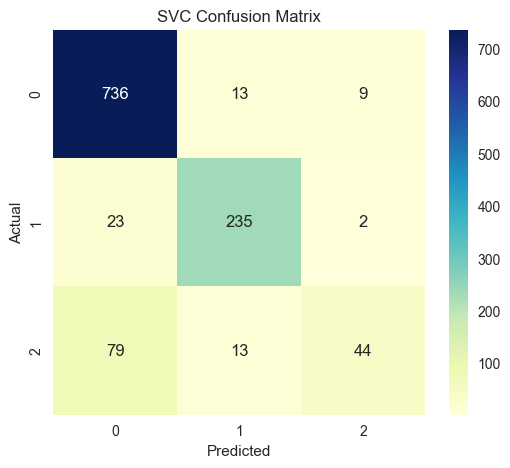

In [83]:
from sklearn.metrics import confusion_matrix

y_pred = svm_model.predict(X_test)
cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt='d', cmap='YlGnBu')

plt.title("SVC Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

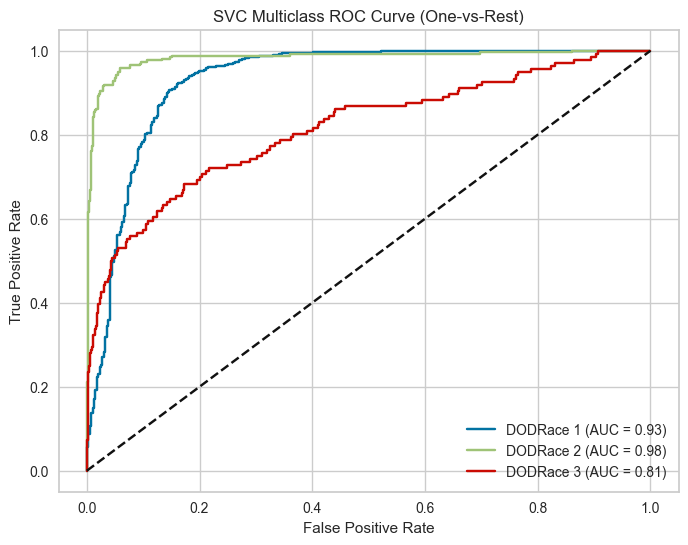

In [84]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc

# Proba tahminleri
y_score = svm_model.predict_proba(X_test)

# DODRace sınıfları al
dodrace = np.unique(y_test)

# Binary format
y_test_bin = label_binarize(y_test, classes=dodrace)

plt.figure(figsize=(8,6))

# Her DODRace sınıfı için ROC curve
for i in range(len(dodrace)):
    fpr, tpr, _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc = auc(fpr, tpr)

    plt.plot(fpr, tpr, label=f"DODRace {dodrace[i]} (AUC = {roc_auc:.2f})"    )

# Random model çizgisi
plt.plot([0, 1], [0, 1], "k--")

plt.title("SVC Multiclass ROC Curve (One-vs-Rest)")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend()
plt.grid(True)
plt.show()

In [85]:
operations = [("preprocessor", preprocessor), ("svc", SVC(kernel="rbf", C=10, gamma="scale", probability=True, random_state=42 ))]

model = Pipeline(steps=operations)

scores = cross_validate( model,
                        X_train, y_train,
                        scoring={ "accuracy": "accuracy", "precision": "precision_macro", "recall": "recall_macro", "f1": "f1_macro"},
                        cv=10,
                        return_train_score=True,
                        n_jobs=-1
                    )

df_scores = pd.DataFrame(scores, index = range(1,11))

df_scores.mean()[2:]

test_accuracy      0.879310
train_accuracy     0.988973
test_precision     0.821203
train_precision    0.993050
test_recall        0.762751
train_recall       0.971056
test_f1            0.782813
train_f1           0.981497
dtype: float64

In [86]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Pipeline
model = Pipeline([("preprocessor", preprocessor),("svc", SVC(probability=True))])

# 2. Hyperparameter Grid
param_grid = {"svc__kernel": ["linear", "rbf", "poly"],
                "svc__C": [0.1, 1, 10, 100],
                "svc__gamma": ["scale", "auto", 0.01, 0.001] }

# 3. GridSearch
grid_svm = GridSearchCV(
    model,
    param_grid,
    cv=5,
    scoring="f1_macro",  # DODRace çok sınıflı ise uygun
    n_jobs=-1,
    verbose=2
)

# 4. Train
grid_svm.fit(X_train, y_train)


Fitting 5 folds for each of 48 candidates, totalling 240 fits


,"estimator estimator: estimator objectThis is assumed to implement the scikit-learn estimator interface.Either estimator needs to provide a ``score`` function,or ``scoring`` must be passed.",Pipeline(step...ility=True))])
,"param_grid param_grid: dict or list of dictionariesDictionary with parameters names (`str`) as keys and lists ofparameter settings to try as values, or a list of suchdictionaries, in which case the grids spanned by each dictionaryin the list are explored. This enables searching over any sequenceof parameter settings.","{'svc__C': [0.1, 1, ...], 'svc__gamma': ['scale', 'auto', ...], 'svc__kernel': ['linear', 'rbf', ...]}"
,"scoring scoring: str, callable, list, tuple or dict, default=NoneStrategy to evaluate the performance of the cross-validated model onthe test set.If `scoring` represents a single score, one can use:- a single string (see :ref:`scoring_string_names`);- a callable (see :ref:`scoring_callable`) that returns a single value;- `None`, the `estimator`'s :ref:`default evaluation criterion ` is used.If `scoring` represents multiple scores, one can use:- a list or tuple of unique strings;- a callable returning a dictionary where the keys are the metric names and the values are the metric scores;- a dictionary with metric names as keys and callables as values.See :ref:`multimetric_grid_search` for an example.",'f1_macro'
,"n_jobs n_jobs: int, default=NoneNumber of jobs to run in parallel.``None`` means 1 unless in a :obj:`joblib.parallel_backend` context.``-1`` means using all processors. See :term:`Glossary `for more details... versionchanged:: v0.20 `n_jobs` default changed from 1 to None",-1
,"refit refit: bool, str, or callable, default=TrueRefit an estimator using the best found parameters on the wholedataset.For multiple metric evaluation, this needs to be a `str` denoting thescorer that would be used to find the best parameters for refittingthe estimator at the end.Where there are considerations other than maximum score inchoosing a best estimator, ``refit`` can be set to a function whichreturns the selected ``best_index_`` given ``cv_results_``. In thatcase, the ``best_estimator_`` and ``best_params_`` will be setaccording to the returned ``best_index_`` while the ``best_score_``attribute will not be available.The refitted estimator is made available at the ``best_estimator_``attribute and permits using ``predict`` directly on this``GridSearchCV`` instance.Also for multiple metric evaluation, the attributes ``best_index_``,``best_score_`` and ``best_params_`` will only be available if``refit`` is set and all of them will be determined w.r.t this specificscorer.See ``scoring`` parameter to know more about multiple metricevaluation.See :ref:`sphx_glr_auto_examples_model_selection_plot_grid_search_digits.py`to see how to design a custom selection strategy using a callablevia `refit`.See :ref:`this example`for an example of how to use ``refit=callable`` to balance modelcomplexity and cross-validated score... versionchanged:: 0.20 Support for callable added.",True
,"cv cv: int, cross-validation generator or an iterable, default=NoneDetermines the cross-validation splitting strategy.Possible inputs for cv are:- None, to use the default 5-fold cross validation,- integer, to specify the number of folds in a `(Stratified)KFold`,- :term:`CV splitter`,- An iterable yielding (train, test) splits as arrays of indices.For integer/None inputs, if the estimator is a classifier and ``y`` iseither binary or multiclass, :class:`StratifiedKFold` is used. In allother cases, :class:`KFold` is used. These splitters are instantiatedwith `shuffle=False` so the splits will be the same across calls.Refer :ref:`User Guide ` for the variouscross-validation strategies that can be used here... versionchanged:: 0.22 ``cv`` default value if None changed from 3-fold to 5-fold.",5
,"verbose verbose: intControls the verbosity: the higher, the more messages.- >1 : the computation time for each fold and parameter candidate is d

In [87]:
grid_svm.best_estimator_

,"steps steps: list of tuplesList of (name of step, estimator) tuples that are to be chained insequential order. To be compatible with the scikit-learn API, all stepsmust define `fit`. All non-last steps must also define `transform`. See:ref:`Combining Estimators ` for more details.","[('preprocessor', ...), ('svc', ...)]"
,"transform_input transform_input: list of str, default=NoneThe names of the :term:`metadata` parameters that should be transformed by thepipeline before passing it to the step consuming it.This enables transforming some input arguments to ``fit`` (other than ``X``)to be transformed by the steps of the pipeline up to the step which requiresthem. Requirement is defined via :ref:`metadata routing `.For instance, this can be used to pass a validation set through the pipeline.You can only set this if metadata routing is enabled, which youcan enable using ``sklearn.set_config(enable_metadata_routing=True)``... versionadded:: 1.6",None
,"memory memory: str or object with the joblib.Memory interface, default=NoneUsed to cache the fitted transformers of the pipeline. The last stepwill never be cached, even if it is a transformer. By default, nocaching is performed. If a string is given, it is the path to thecaching directory. Enabling caching triggers a clone of the transformersbefore fitting. Therefore, the transformer instance given to thepipeline cannot be inspected directly. Use the attribute ``named_steps``or ``steps`` to inspect estimators within the pipeline. Caching thetransformers is advantageous when fitting is time consuming. See:ref:`sphx_glr_auto_examples_neighbors_plot_caching_nearest_neighbors.py`for an example on how to enable caching.",None
,"verbose verbose: bool, default=FalseIf True, the time elapsed while fitting each step will be printed as itis completed.",False
,"transformers transformers: list of tuplesList of (name, transformer, columns) tuples specifying thetransformer objects to be applied to subsets of the data.name : str Like in Pipeline and FeatureUnion, this allows the transformer and its parameters to be set using ``set_params`` and searched in grid search.transformer : {'drop', 'passthrough'} or estimator Estimator must support :term:`fit` and :term:`transform`. Special-cased strings 'drop' and 'passthrough' are accepted as well, to indicate to drop the columns or to pass them through untransformed, respectively.columns : str, array-like of str, int, array-like of int, array-like of bool, slice or callable Indexes the data on its second axis. Integers are interpreted as positional columns, while strings can reference DataFrame columns by name. A scalar string or int should be used where ``transformer`` expects X to be a 1d array-like (vector), otherwise a 2d array will be passed to the transformer. A callable is passed the input data `X` and can return any of the above. To select multiple columns by name or dtype, you can use :obj:`make_column_selector`.","[('num', ...), ('cat', ...)]"
,"remainder remainder: {'drop', 'passthrough'} or estimator, default='drop'By default, only the specified columns in `transformers` aretransformed and combined in the output, and the non-specifiedcolumns are dropped. (default of ``'drop'``).By specifying ``remainder='passthrough'``, all remaining columns thatwere not specified in `transformers`, but present in the data passedto `fit` will be automatically passed through. This subset of columnsis concatenated with the output of the transformers. For dataframes,extra columns not seen during `fit` will be excluded from the outputof `transform`.By setting ``remainder`` to be an estimator, the remainingnon-specified columns will use the ``remainder`` estimator. Theestimator must support :term:`fit` and :term:`transform`.Note that using this feature requires that the DataFrame columnsinput at :term:`fit` and :term:`transform` have identical order.",'passthrough'
,"sparse_threshold sparse_threshold: float, default=0.3If the output of the different transforme

In [88]:
grid_svm.best_params_


{'svc__C': 100, 'svc__gamma': 0.001, 'svc__kernel': 'rbf'}

In [89]:
grid_svm.best_score_

np.float64(0.7964000788759469)

In [90]:
from sklearn.metrics import accuracy_score, f1_score, recall_score, roc_auc_score, precision_score

y_pred = grid_svm.predict(X_test)
y_pred_proba = grid_svm.predict_proba(X_test)

grid_svm_accuracy = accuracy_score(y_test, y_pred)

grid_svm_f1 = f1_score(y_test, y_pred,average="macro") # Multiclass için average parametresi verildi 

grid_svm_recall = recall_score(y_test,y_pred, average="macro")

grid_svm_precision = precision_score(y_test,y_pred, average="macro")

grid_svm_auc = roc_auc_score(y_test,y_pred_proba, multi_class="ovr")

print(f"Accuracy : {grid_svm_accuracy:.4f}")
print(f"F1 Score : {grid_svm_f1:.4f}")
print(f"Recall   : {grid_svm_recall:.4f}")
print(f"Percision : {grid_svm_precision:.4f}")
print(f"ROC AUC  : {grid_svm_auc:.4f}")

Accuracy : 0.8821
F1 Score : 0.7920
Recall   : 0.7718
Percision : 0.8233
ROC AUC  : 0.9164


In [91]:
eval_metric(grid_svm, X_train, y_train, X_test, y_test)

Test_Set
[[722  12  24]
 [ 19 232   9]
 [ 61  11  64]]
              precision    recall  f1-score   support

           1       0.90      0.95      0.93       758
           2       0.91      0.89      0.90       260
           3       0.66      0.47      0.55       136

    accuracy                           0.88      1154
   macro avg       0.82      0.77      0.79      1154
weighted avg       0.87      0.88      0.88      1154


Train_Set
[[2988   19   27]
 [  47  986    5]
 [ 207   29  307]]
              precision    recall  f1-score   support

           1       0.92      0.98      0.95      3034
           2       0.95      0.95      0.95      1038
           3       0.91      0.57      0.70       543

    accuracy                           0.93      4615
   macro avg       0.93      0.83      0.87      4615
weighted avg       0.93      0.93      0.92      4615



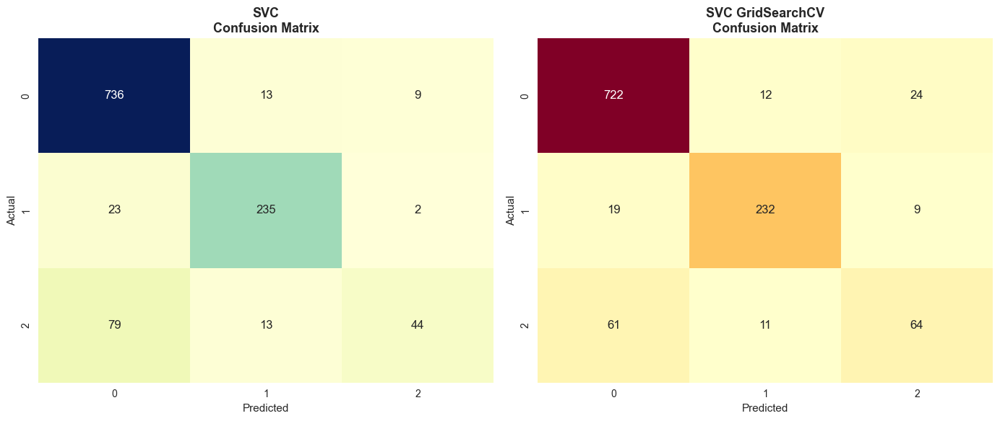

In [137]:
# Tahminler
y_pred_svm = svm_model.predict(X_test)
y_pred_grid = grid_svm.predict(X_test)

# Confusion Matrix'ler
cm_svm = confusion_matrix(y_test, y_pred_svm)
cm_grid = confusion_matrix(y_test, y_pred_grid)

# Yan yana grafikler
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# SVM 
sns.heatmap(cm_svm, annot=True, fmt="d", cmap="YlGnBu", ax=axes[0], cbar=False)

axes[0].set_title("SVC\nConfusion Matrix", fontsize=13, fontweight="bold")
axes[0].set_xlabel("Predicted")
axes[0].set_ylabel("Actual")

# SVM GridSearchCV
sns.heatmap(cm_grid, annot=True, fmt="d", cmap="YlOrRd", ax=axes[1], cbar=False)

axes[1].set_title("SVC GridSearchCV\nConfusion Matrix",fontsize=13,fontweight="bold")
axes[1].set_xlabel("Predicted")
axes[1].set_ylabel("Actual")

plt.tight_layout()
plt.show()

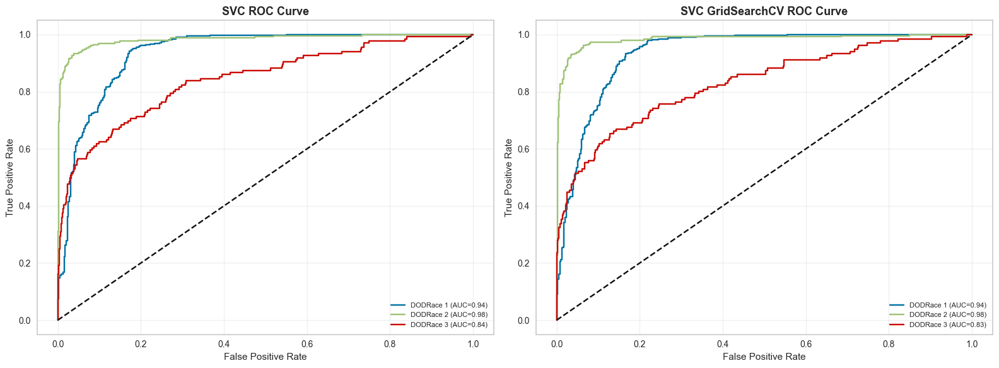

In [138]:
# Tahmin olasılıkları
y_score_svm = svm_model.predict_proba(X_test)
y_score_grid = grid_svm.predict_proba(X_test)

# Sınıflar
dodrace = np.unique(y_test)

# One-vs-Rest için binarize
y_test_bin = label_binarize(y_test, classes=dodrace)

# Yan yana grafikler
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# =========================
# SVM
# =========================
for i in range(len(dodrace)):

    fpr, tpr, _ = roc_curve( y_test_bin[:, i], y_score_log[:, i] )

    roc_auc = auc(fpr, tpr)

    axes[0].plot(fpr, tpr, label=f"DODRace {dodrace[i]} (AUC={roc_auc:.2f})" )

axes[0].plot([0, 1], [0, 1], "k--")

axes[0].set_title("SVC ROC Curve", fontsize=13, fontweight="bold")

axes[0].set_xlabel("False Positive Rate")
axes[0].set_ylabel("True Positive Rate")
axes[0].legend(fontsize=8)
axes[0].grid(alpha=0.3)

# =========================
# SVM GridSearchCV
# =========================
for i in range(len(dodrace)):

    fpr, tpr, _ = roc_curve(y_test_bin[:, i], y_score_grid[:, i])

    roc_auc = auc(fpr, tpr)

    axes[1].plot(fpr, tpr,label=f"DODRace {dodrace[i]} (AUC={roc_auc:.2f})"  )

axes[1].plot([0, 1], [0, 1], "k--")

axes[1].set_title("SVC GridSearchCV ROC Curve", fontsize=13, fontweight="bold")

axes[1].set_xlabel("False Positive Rate")
axes[1].set_ylabel("True Positive Rate")
axes[1].legend(fontsize=8)
axes[1].grid(alpha=0.3)

plt.tight_layout()
plt.show()

## RF

In [94]:
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestClassifier

rf_model = Pipeline( steps=[("preprocessor", preprocessor),("RF_model", RandomForestClassifier(random_state=101))])

rf_model.fit(X_train, y_train)

,"steps steps: list of tuplesList of (name of step, estimator) tuples that are to be chained insequential order. To be compatible with the scikit-learn API, all stepsmust define `fit`. All non-last steps must also define `transform`. See:ref:`Combining Estimators ` for more details.","[('preprocessor', ...), ('RF_model', ...)]"
,"transform_input transform_input: list of str, default=NoneThe names of the :term:`metadata` parameters that should be transformed by thepipeline before passing it to the step consuming it.This enables transforming some input arguments to ``fit`` (other than ``X``)to be transformed by the steps of the pipeline up to the step which requiresthem. Requirement is defined via :ref:`metadata routing `.For instance, this can be used to pass a validation set through the pipeline.You can only set this if metadata routing is enabled, which youcan enable using ``sklearn.set_config(enable_metadata_routing=True)``... versionadded:: 1.6",None
,"memory memory: str or object with the joblib.Memory interface, default=NoneUsed to cache the fitted transformers of the pipeline. The last stepwill never be cached, even if it is a transformer. By default, nocaching is performed. If a string is given, it is the path to thecaching directory. Enabling caching triggers a clone of the transformersbefore fitting. Therefore, the transformer instance given to thepipeline cannot be inspected directly. Use the attribute ``named_steps``or ``steps`` to inspect estimators within the pipeline. Caching thetransformers is advantageous when fitting is time consuming. See:ref:`sphx_glr_auto_examples_neighbors_plot_caching_nearest_neighbors.py`for an example on how to enable caching.",None
,"verbose verbose: bool, default=FalseIf True, the time elapsed while fitting each step will be printed as itis completed.",False
,"transformers transformers: list of tuplesList of (name, transformer, columns) tuples specifying thetransformer objects to be applied to subsets of the data.name : str Like in Pipeline and FeatureUnion, this allows the transformer and its parameters to be set using ``set_params`` and searched in grid search.transformer : {'drop', 'passthrough'} or estimator Estimator must support :term:`fit` and :term:`transform`. Special-cased strings 'drop' and 'passthrough' are accepted as well, to indicate to drop the columns or to pass them through untransformed, respectively.columns : str, array-like of str, int, array-like of int, array-like of bool, slice or callable Indexes the data on its second axis. Integers are interpreted as positional columns, while strings can reference DataFrame columns by name. A scalar string or int should be used where ``transformer`` expects X to be a 1d array-like (vector), otherwise a 2d array will be passed to the transformer. A callable is passed the input data `X` and can return any of the above. To select multiple columns by name or dtype, you can use :obj:`make_column_selector`.","[('num', ...), ('cat', ...)]"
,"remainder remainder: {'drop', 'passthrough'} or estimator, default='drop'By default, only the specified columns in `transformers` aretransformed and combined in the output, and the non-specifiedcolumns are dropped. (default of ``'drop'``).By specifying ``remainder='passthrough'``, all remaining columns thatwere not specified in `transformers`, but present in the data passedto `fit` will be automatically passed through. This subset of columnsis concatenated with the output of the transformers. For dataframes,extra columns not seen during `fit` will be excluded from the outputof `transform`.By setting ``remainder`` to be an estimator, the remainingnon-specified columns will use the ``remainder`` estimator. Theestimator must support :term:`fit` and :term:`transform`.Note that using this feature requires that the DataFrame columnsinput at :term:`fit` and :term:`transform` have identical order.",'passthrough'
,"sparse_threshold sparse_threshold: float, default=0.3If the output of the different trans

In [96]:
from sklearn.metrics import accuracy_score, f1_score, recall_score, roc_auc_score, precision_score

y_pred = rf_model.predict(X_test)
y_pred_proba = rf_model.predict_proba(X_test)

rf_model_accuracy = accuracy_score(y_test, y_pred)

rf_model_f1 = f1_score(y_test, y_pred,average="macro") # Multiclass için average parametresi verildi 

rf_model_recall = recall_score(y_test,y_pred, average="macro")

rf_model_precision = precision_score(y_test,y_pred, average="macro")

rf_model_auc = roc_auc_score(y_test,y_pred_proba, multi_class="ovr")

print(f"Accuracy : {rf_model_accuracy:.4f}")
print(f"F1 Score : {rf_model_f1:.4f}")
print(f"Recall   : {rf_model_recall:.4f}")
print(f"Percision : {rf_model_precision:.4f}")
print(f"ROC AUC  : {rf_model_auc:.4f}")

Accuracy : 0.8397
F1 Score : 0.7074
Recall   : 0.6702
Percision : 0.8438
ROC AUC  : 0.8683


In [97]:
eval_metric(rf_model, X_train, y_train, X_test, y_test)

Test_Set
[[732  21   5]
 [ 59 199   2]
 [ 84  14  38]]
              precision    recall  f1-score   support

           1       0.84      0.97      0.90       758
           2       0.85      0.77      0.81       260
           3       0.84      0.28      0.42       136

    accuracy                           0.84      1154
   macro avg       0.84      0.67      0.71      1154
weighted avg       0.84      0.84      0.82      1154


Train_Set
[[3034    0    0]
 [   0 1038    0]
 [   0    0  543]]
              precision    recall  f1-score   support

           1       1.00      1.00      1.00      3034
           2       1.00      1.00      1.00      1038
           3       1.00      1.00      1.00       543

    accuracy                           1.00      4615
   macro avg       1.00      1.00      1.00      4615
weighted avg       1.00      1.00      1.00      4615



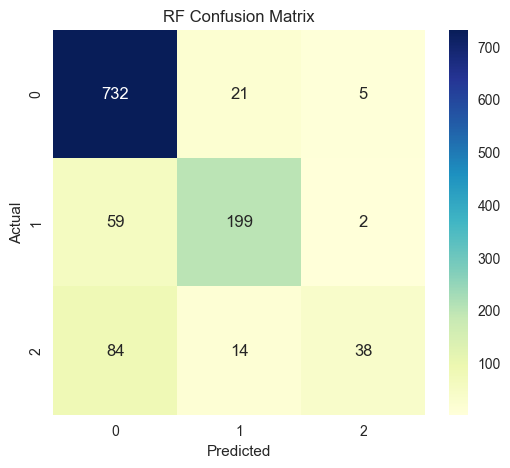

In [101]:
from sklearn.metrics import confusion_matrix

y_pred = rf_model.predict(X_test)
cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt='d', cmap="YlGnBu")

plt.title("RF Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

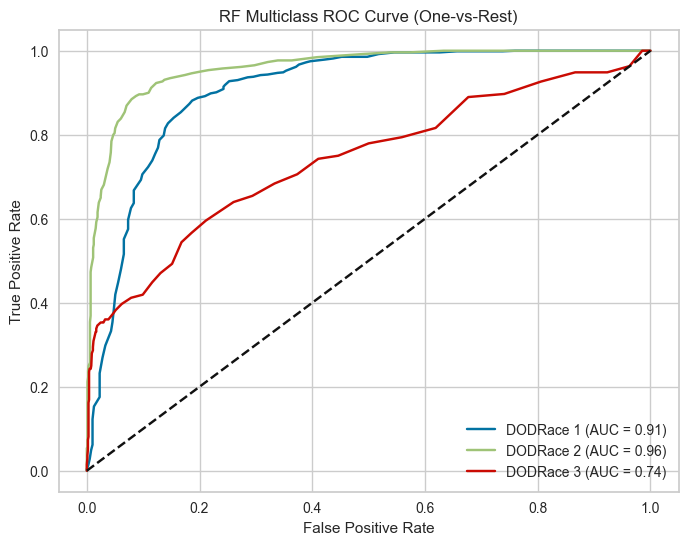

In [102]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc

# Proba tahminleri
y_score = rf_model.predict_proba(X_test)

# DODRace sınıfları al
dodrace = np.unique(y_test)

# Binary format
y_test_bin = label_binarize(y_test, classes=dodrace)

plt.figure(figsize=(8,6))

# Her DODRace sınıfı için ROC curve
for i in range(len(dodrace)):
    fpr, tpr, _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc = auc(fpr, tpr)

    plt.plot(fpr, tpr, label=f"DODRace {dodrace[i]} (AUC = {roc_auc:.2f})"    )

# Random model çizgisi
plt.plot([0, 1], [0, 1], "k--")

plt.title("RF Multiclass ROC Curve (One-vs-Rest)")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend()
plt.grid(True)
plt.show()

In [103]:
from sklearn.model_selection import cross_validate
import pandas as pd

model = Pipeline(steps=[("preprocessor", preprocessor),("RF_model", RandomForestClassifier(random_state=101))])

scores = cross_validate(model,
                        X_train, y_train,
                        scoring={"accuracy": "accuracy","precision": "precision_macro","recall": "recall_macro","f1": "f1_macro"},
                        cv=10,
                        return_train_score=True,
                        n_jobs=-1
                        )

df_scores = pd.DataFrame(scores, index=range(1, 11))

print(df_scores.mean()[2:])

test_accuracy      0.832937
train_accuracy     1.000000
test_precision     0.830569
train_precision    1.000000
test_recall        0.646607
train_recall       1.000000
test_f1            0.679278
train_f1           1.000000
dtype: float64


In [105]:
grid_model = Pipeline(steps=[("preprocessor", preprocessor),  ("RF_model", RandomForestClassifier( random_state=101, n_jobs=-1 ))])

param_grid = {
    "RF_model__n_estimators": [200, 500],
    "RF_model__max_depth": [10, 20, None],
    "RF_model__min_samples_leaf": [1, 2],
    "RF_model__max_features": ["sqrt"],
    "RF_model__class_weight": [None, "balanced"]
}


In [106]:
from sklearn.model_selection import GridSearchCV

grid_rf = GridSearchCV(
                        estimator=grid_model,
                        param_grid=param_grid,
                        scoring="f1_macro",     # Accuracy yerine
                        cv=5,
                        n_jobs=-1,
                        verbose=1,
                        refit=True,
                        return_train_score=True
                    )

grid_rf.fit(X_train, y_train)

Fitting 5 folds for each of 24 candidates, totalling 120 fits


,"estimator estimator: estimator objectThis is assumed to implement the scikit-learn estimator interface.Either estimator needs to provide a ``score`` function,or ``scoring`` must be passed.",Pipeline(step..._state=101))])
,"param_grid param_grid: dict or list of dictionariesDictionary with parameters names (`str`) as keys and lists ofparameter settings to try as values, or a list of suchdictionaries, in which case the grids spanned by each dictionaryin the list are explored. This enables searching over any sequenceof parameter settings.","{'RF_model__class_weight': [None, 'balanced'], 'RF_model__max_depth': [10, 20, ...], 'RF_model__max_features': ['sqrt'], 'RF_model__min_samples_leaf': [1, 2], ...}"
,"scoring scoring: str, callable, list, tuple or dict, default=NoneStrategy to evaluate the performance of the cross-validated model onthe test set.If `scoring` represents a single score, one can use:- a single string (see :ref:`scoring_string_names`);- a callable (see :ref:`scoring_callable`) that returns a single value;- `None`, the `estimator`'s :ref:`default evaluation criterion ` is used.If `scoring` represents multiple scores, one can use:- a list or tuple of unique strings;- a callable returning a dictionary where the keys are the metric names and the values are the metric scores;- a dictionary with metric names as keys and callables as values.See :ref:`multimetric_grid_search` for an example.",'f1_macro'
,"n_jobs n_jobs: int, default=NoneNumber of jobs to run in parallel.``None`` means 1 unless in a :obj:`joblib.parallel_backend` context.``-1`` means using all processors. See :term:`Glossary `for more details... versionchanged:: v0.20 `n_jobs` default changed from 1 to None",-1
,"refit refit: bool, str, or callable, default=TrueRefit an estimator using the best found parameters on the wholedataset.For multiple metric evaluation, this needs to be a `str` denoting thescorer that would be used to find the best parameters for refittingthe estimator at the end.Where there are considerations other than maximum score inchoosing a best estimator, ``refit`` can be set to a function whichreturns the selected ``best_index_`` given ``cv_results_``. In thatcase, the ``best_estimator_`` and ``best_params_`` will be setaccording to the returned ``best_index_`` while the ``best_score_``attribute will not be available.The refitted estimator is made available at the ``best_estimator_``attribute and permits using ``predict`` directly on this``GridSearchCV`` instance.Also for multiple metric evaluation, the attributes ``best_index_``,``best_score_`` and ``best_params_`` will only be available if``refit`` is set and all of them will be determined w.r.t this specificscorer.See ``scoring`` parameter to know more about multiple metricevaluation.See :ref:`sphx_glr_auto_examples_model_selection_plot_grid_search_digits.py`to see how to design a custom selection strategy using a callablevia `refit`.See :ref:`this example`for an example of how to use ``refit=callable`` to balance modelcomplexity and cross-validated score... versionchanged:: 0.20 Support for callable added.",True
,"cv cv: int, cross-validation generator or an iterable, default=NoneDetermines the cross-validation splitting strategy.Possible inputs for cv are:- None, to use the default 5-fold cross validation,- integer, to specify the number of folds in a `(Stratified)KFold`,- :term:`CV splitter`,- An iterable yielding (train, test) splits as arrays of indices.For integer/None inputs, if the estimator is a classifier and ``y`` iseither binary or multiclass, :class:`StratifiedKFold` is used. In allother cases, :class:`KFold` is used. These splitters are instantiatedwith `shuffle=False` so the splits will be the same across calls.Refer :ref:`User Guide ` for the variouscross-validation strategies that can be used here... versionchanged:: 0.22 ``cv`` default value if None changed from 3-fold to 5-fold.",5
,"verbose verbose: intControls the verbosity: the higher, the more messages.- >1 : th

In [107]:
grid_rf.best_estimator_

,"steps steps: list of tuplesList of (name of step, estimator) tuples that are to be chained insequential order. To be compatible with the scikit-learn API, all stepsmust define `fit`. All non-last steps must also define `transform`. See:ref:`Combining Estimators ` for more details.","[('preprocessor', ...), ('RF_model', ...)]"
,"transform_input transform_input: list of str, default=NoneThe names of the :term:`metadata` parameters that should be transformed by thepipeline before passing it to the step consuming it.This enables transforming some input arguments to ``fit`` (other than ``X``)to be transformed by the steps of the pipeline up to the step which requiresthem. Requirement is defined via :ref:`metadata routing `.For instance, this can be used to pass a validation set through the pipeline.You can only set this if metadata routing is enabled, which youcan enable using ``sklearn.set_config(enable_metadata_routing=True)``... versionadded:: 1.6",None
,"memory memory: str or object with the joblib.Memory interface, default=NoneUsed to cache the fitted transformers of the pipeline. The last stepwill never be cached, even if it is a transformer. By default, nocaching is performed. If a string is given, it is the path to thecaching directory. Enabling caching triggers a clone of the transformersbefore fitting. Therefore, the transformer instance given to thepipeline cannot be inspected directly. Use the attribute ``named_steps``or ``steps`` to inspect estimators within the pipeline. Caching thetransformers is advantageous when fitting is time consuming. See:ref:`sphx_glr_auto_examples_neighbors_plot_caching_nearest_neighbors.py`for an example on how to enable caching.",None
,"verbose verbose: bool, default=FalseIf True, the time elapsed while fitting each step will be printed as itis completed.",False
,"transformers transformers: list of tuplesList of (name, transformer, columns) tuples specifying thetransformer objects to be applied to subsets of the data.name : str Like in Pipeline and FeatureUnion, this allows the transformer and its parameters to be set using ``set_params`` and searched in grid search.transformer : {'drop', 'passthrough'} or estimator Estimator must support :term:`fit` and :term:`transform`. Special-cased strings 'drop' and 'passthrough' are accepted as well, to indicate to drop the columns or to pass them through untransformed, respectively.columns : str, array-like of str, int, array-like of int, array-like of bool, slice or callable Indexes the data on its second axis. Integers are interpreted as positional columns, while strings can reference DataFrame columns by name. A scalar string or int should be used where ``transformer`` expects X to be a 1d array-like (vector), otherwise a 2d array will be passed to the transformer. A callable is passed the input data `X` and can return any of the above. To select multiple columns by name or dtype, you can use :obj:`make_column_selector`.","[('num', ...), ('cat', ...)]"
,"remainder remainder: {'drop', 'passthrough'} or estimator, default='drop'By default, only the specified columns in `transformers` aretransformed and combined in the output, and the non-specifiedcolumns are dropped. (default of ``'drop'``).By specifying ``remainder='passthrough'``, all remaining columns thatwere not specified in `transformers`, but present in the data passedto `fit` will be automatically passed through. This subset of columnsis concatenated with the output of the transformers. For dataframes,extra columns not seen during `fit` will be excluded from the outputof `transform`.By setting ``remainder`` to be an estimator, the remainingnon-specified columns will use the ``remainder`` estimator. Theestimator must support :term:`fit` and :term:`transform`.Note that using this feature requires that the DataFrame columnsinput at :term:`fit` and :term:`transform` have identical order.",'passthrough'
,"sparse_threshold sparse_threshold: float, default=0.3If the output of the different trans

In [108]:
grid_rf.best_params_
# Best parameters

{'RF_model__class_weight': 'balanced',
 'RF_model__max_depth': 10,
 'RF_model__max_features': 'sqrt',
 'RF_model__min_samples_leaf': 2,
 'RF_model__n_estimators': 200}

In [109]:
grid_rf.best_score_

np.float64(0.7166201776530683)

In [111]:
from sklearn.metrics import accuracy_score, f1_score, recall_score, roc_auc_score, precision_score

y_pred = grid_rf.predict(X_test)
y_pred_proba = grid_rf.predict_proba(X_test)

grid_rf_accuracy = accuracy_score(y_test, y_pred)

grid_rf_f1 = f1_score(y_test, y_pred,average="macro") # Multiclass için average parametresi verildi 

grid_rf_recall = recall_score(y_test,y_pred, average="macro")

grid_rf_precision = precision_score(y_test,y_pred, average="macro")

grid_rf_auc = roc_auc_score(y_test,y_pred_proba, multi_class="ovr")

print(f"Accuracy : {grid_rf_accuracy:.4f}")
print(f"F1 Score : {grid_rf_f1:.4f}")
print(f"Recall   : {grid_rf_recall:.4f}")
print(f"Percision : {grid_rf_precision:.4f}")
print(f"ROC AUC  : {grid_rf_auc:.4f}")

Accuracy : 0.8232
F1 Score : 0.7073
Recall   : 0.6836
Percision : 0.7519
ROC AUC  : 0.8638


In [112]:
eval_metric(grid_rf, X_train, y_train, X_test, y_test)

Test_Set
[[701  28  29]
 [ 54 201   5]
 [ 73  15  48]]
              precision    recall  f1-score   support

           1       0.85      0.92      0.88       758
           2       0.82      0.77      0.80       260
           3       0.59      0.35      0.44       136

    accuracy                           0.82      1154
   macro avg       0.75      0.68      0.71      1154
weighted avg       0.81      0.82      0.81      1154


Train_Set
[[3000   10   24]
 [  23 1014    1]
 [  27    1  515]]
              precision    recall  f1-score   support

           1       0.98      0.99      0.99      3034
           2       0.99      0.98      0.98      1038
           3       0.95      0.95      0.95       543

    accuracy                           0.98      4615
   macro avg       0.98      0.97      0.97      4615
weighted avg       0.98      0.98      0.98      4615



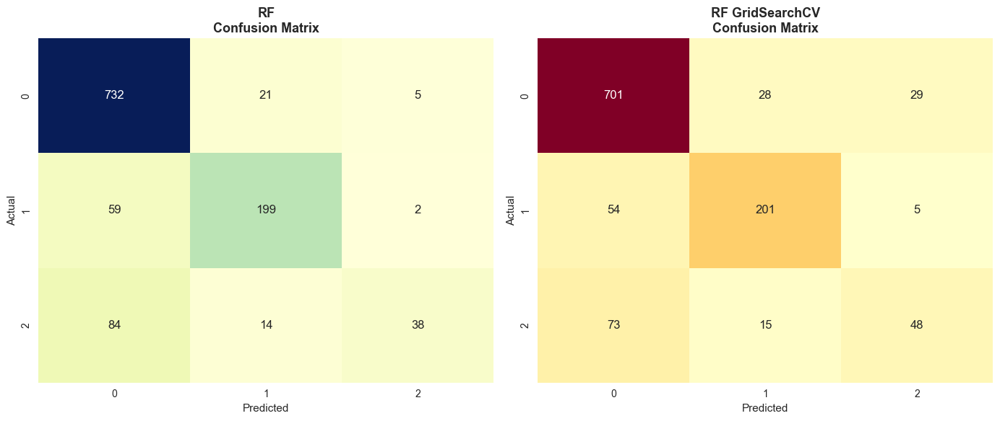

In [113]:
# Tahminler
y_pred_rf = rf_model.predict(X_test)
y_pred_grid = grid_rf.predict(X_test)

# Confusion Matrix'ler
cm_rf = confusion_matrix(y_test, y_pred_svm)
cm_grid = confusion_matrix(y_test, y_pred_grid)

# Yan yana grafikler
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# RF
sns.heatmap(cm_rf, annot=True, fmt="d", cmap="YlGnBu", ax=axes[0], cbar=False)

axes[0].set_title("RF\nConfusion Matrix", fontsize=13, fontweight="bold")
axes[0].set_xlabel("Predicted")
axes[0].set_ylabel("Actual")

# RF GridSearchCV
sns.heatmap(cm_grid, annot=True, fmt="d", cmap="YlOrRd", ax=axes[1], cbar=False)

axes[1].set_title("RF GridSearchCV\nConfusion Matrix",fontsize=13,fontweight="bold")
axes[1].set_xlabel("Predicted")
axes[1].set_ylabel("Actual")

plt.tight_layout()
plt.show()

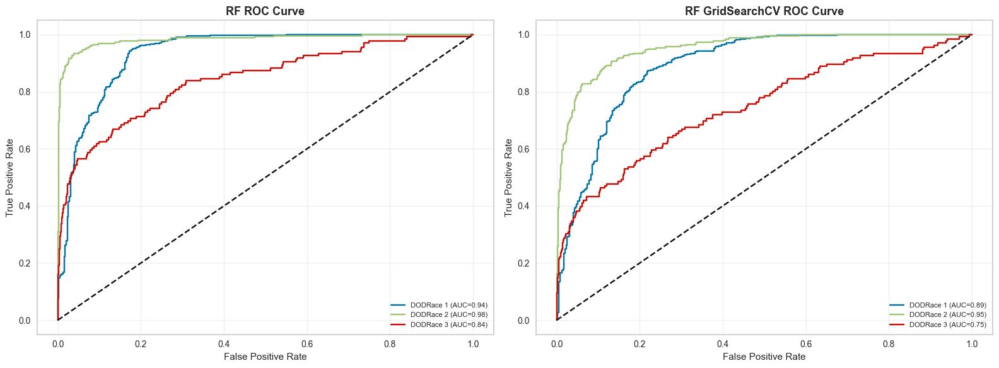

In [114]:
# Tahmin olasılıkları
y_score_rf = rf_model.predict_proba(X_test)
y_score_grid = grid_rf.predict_proba(X_test)

# Sınıflar
dodrace = np.unique(y_test)

# One-vs-Rest için binarize
y_test_bin = label_binarize(y_test, classes=dodrace)

# Yan yana grafikler
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# =========================
# RF
# =========================
for i in range(len(dodrace)):

    fpr, tpr, _ = roc_curve( y_test_bin[:, i], y_score_log[:, i] )

    roc_auc = auc(fpr, tpr)

    axes[0].plot(fpr, tpr, label=f"DODRace {dodrace[i]} (AUC={roc_auc:.2f})" )

axes[0].plot([0, 1], [0, 1], "k--")

axes[0].set_title("RF ROC Curve", fontsize=13, fontweight="bold")

axes[0].set_xlabel("False Positive Rate")
axes[0].set_ylabel("True Positive Rate")
axes[0].legend(fontsize=8)
axes[0].grid(alpha=0.3)

# =========================
# RF GridSearchCV
# =========================
for i in range(len(dodrace)):

    fpr, tpr, _ = roc_curve(y_test_bin[:, i], y_score_grid[:, i])

    roc_auc = auc(fpr, tpr)

    axes[1].plot(fpr, tpr,label=f"DODRace {dodrace[i]} (AUC={roc_auc:.2f})"  )

axes[1].plot([0, 1], [0, 1], "k--")

axes[1].set_title("RF GridSearchCV ROC Curve", fontsize=13, fontweight="bold")

axes[1].set_xlabel("False Positive Rate")
axes[1].set_ylabel("True Positive Rate")
axes[1].legend(fontsize=8)
axes[1].grid(alpha=0.3)

plt.tight_layout()
plt.show()

## Boosting Methods

In [116]:
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()

y_train_enc = le.fit_transform(y_train)
y_test_enc = le.transform(y_test)

print(np.unique(y_train_enc))

#XGBoost, çok sınıflı sınıflandırmada sınıf etiketlerinin 0'dan başlayıp ardışık gitmesini bekler.
#y_train içindeki sınıflar:[1, 2, 3] ama XGBoost: [0, 1, 2] olarak bekler 

[0 1 2]


In [117]:
from xgboost import XGBClassifier
from sklearn.pipeline import Pipeline
xgb_model = Pipeline(steps=[("preprocessor", preprocessor),("xgb", XGBClassifier(random_state=42, objective="multi:softprob", eval_metric="mlogloss"))])

xgb_model.fit(X_train, y_train_enc)
 
#objective="multi:softprob : Modelin ne öğrenmeye çalışacağını belirtir.White ,Black, Hispanic olduğu için 3 sınıflı sınıflandırma problemi var. her sınıf için olasılık üret demektir. 
# eval_metric="mlogloss" :Modelin eğitim sırasında başarısını nasıl ölçeceğini belirtir. mlogloss = Multiclass Log Loss : çoklu sınıflandırmalar için kullanılan hata ölçüsüdür.

,"steps steps: list of tuplesList of (name of step, estimator) tuples that are to be chained insequential order. To be compatible with the scikit-learn API, all stepsmust define `fit`. All non-last steps must also define `transform`. See:ref:`Combining Estimators ` for more details.","[('preprocessor', ...), ('xgb', ...)]"
,"transform_input transform_input: list of str, default=NoneThe names of the :term:`metadata` parameters that should be transformed by thepipeline before passing it to the step consuming it.This enables transforming some input arguments to ``fit`` (other than ``X``)to be transformed by the steps of the pipeline up to the step which requiresthem. Requirement is defined via :ref:`metadata routing `.For instance, this can be used to pass a validation set through the pipeline.You can only set this if metadata routing is enabled, which youcan enable using ``sklearn.set_config(enable_metadata_routing=True)``... versionadded:: 1.6",None
,"memory memory: str or object with the joblib.Memory interface, default=NoneUsed to cache the fitted transformers of the pipeline. The last stepwill never be cached, even if it is a transformer. By default, nocaching is performed. If a string is given, it is the path to thecaching directory. Enabling caching triggers a clone of the transformersbefore fitting. Therefore, the transformer instance given to thepipeline cannot be inspected directly. Use the attribute ``named_steps``or ``steps`` to inspect estimators within the pipeline. Caching thetransformers is advantageous when fitting is time consuming. See:ref:`sphx_glr_auto_examples_neighbors_plot_caching_nearest_neighbors.py`for an example on how to enable caching.",None
,"verbose verbose: bool, default=FalseIf True, the time elapsed while fitting each step will be printed as itis completed.",False
,"transformers transformers: list of tuplesList of (name, transformer, columns) tuples specifying thetransformer objects to be applied to subsets of the data.name : str Like in Pipeline and FeatureUnion, this allows the transformer and its parameters to be set using ``set_params`` and searched in grid search.transformer : {'drop', 'passthrough'} or estimator Estimator must support :term:`fit` and :term:`transform`. Special-cased strings 'drop' and 'passthrough' are accepted as well, to indicate to drop the columns or to pass them through untransformed, respectively.columns : str, array-like of str, int, array-like of int, array-like of bool, slice or callable Indexes the data on its second axis. Integers are interpreted as positional columns, while strings can reference DataFrame columns by name. A scalar string or int should be used where ``transformer`` expects X to be a 1d array-like (vector), otherwise a 2d array will be passed to the transformer. A callable is passed the input data `X` and can return any of the above. To select multiple columns by name or dtype, you can use :obj:`make_column_selector`.","[('num', ...), ('cat', ...)]"
,"remainder remainder: {'drop', 'passthrough'} or estimator, default='drop'By default, only the specified columns in `transformers` aretransformed and combined in the output, and the non-specifiedcolumns are dropped. (default of ``'drop'``).By specifying ``remainder='passthrough'``, all remaining columns thatwere not specified in `transformers`, but present in the data passedto `fit` will be automatically passed through. This subset of columnsis concatenated with the output of the transformers. For dataframes,extra columns not seen during `fit` will be excluded from the outputof `transform`.By setting ``remainder`` to be an estimator, the remainingnon-specified columns will use the ``remainder`` estimator. Theestimator must support :term:`fit` and :term:`transform`.Note that using this feature requires that the DataFrame columnsinput at :term:`fit` and :term:`transform` have identical order.",'passthrough'
,"sparse_threshold sparse_threshold: float, default=0.3If the output of the different transforme

In [121]:
from sklearn.metrics import accuracy_score, f1_score, recall_score, roc_auc_score, precision_score

y_pred_enc = xgb_model.predict(X_test)
y_pred_enc_proba = xgb_model.predict_proba(X_test)

xgb_model_accuracy = accuracy_score(y_test_enc, y_pred_enc)

xgb_model_f1 = f1_score(y_test_enc, y_pred_enc,average="macro") # Multiclass için average parametresi verildi 

xgb_model_recall = recall_score(y_test_enc,y_pred_enc, average="macro")

xgb_model_precision = precision_score(y_test_enc,y_pred_enc, average="macro")

xgb_model_auc = roc_auc_score(y_test_enc,y_pred_enc_proba, multi_class="ovr")

print(f"Accuracy : {xgb_model_accuracy:.4f}")
print(f"F1 Score : {xgb_model_f1:.4f}")
print(f"Recall   : {xgb_model_recall:.4f}")
print(f"Percision : {xgb_model_precision:.4f}")
print(f"ROC AUC  : {xgb_model_auc:.4f}")

Accuracy : 0.8622
F1 Score : 0.7485
Recall   : 0.7219
Percision : 0.8120
ROC AUC  : 0.8979


In [122]:
eval_metric(xgb_model,X_train,y_train_enc, X_test, y_test_enc)

Test_Set
[[724  17  17]
 [ 32 223   5]
 [ 74  14  48]]
              precision    recall  f1-score   support

           0       0.87      0.96      0.91       758
           1       0.88      0.86      0.87       260
           2       0.69      0.35      0.47       136

    accuracy                           0.86      1154
   macro avg       0.81      0.72      0.75      1154
weighted avg       0.85      0.86      0.85      1154


Train_Set
[[3034    0    0]
 [   0 1038    0]
 [   0    0  543]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3034
           1       1.00      1.00      1.00      1038
           2       1.00      1.00      1.00       543

    accuracy                           1.00      4615
   macro avg       1.00      1.00      1.00      4615
weighted avg       1.00      1.00      1.00      4615



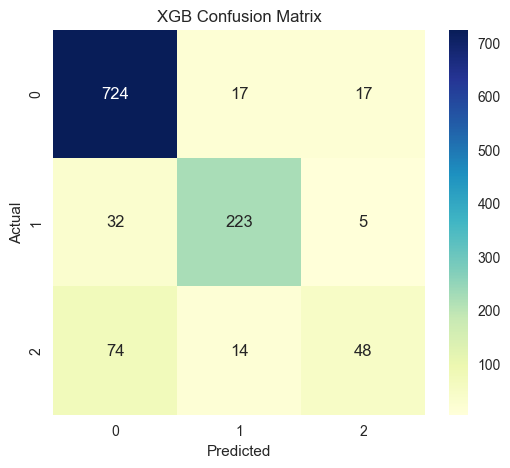

In [129]:
from sklearn.metrics import confusion_matrix

y_pred_enc= xgb_model.predict(X_test)
cm = confusion_matrix(y_test_enc, y_pred_enc)

plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt='d', cmap="YlGnBu")

plt.title("XGB Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

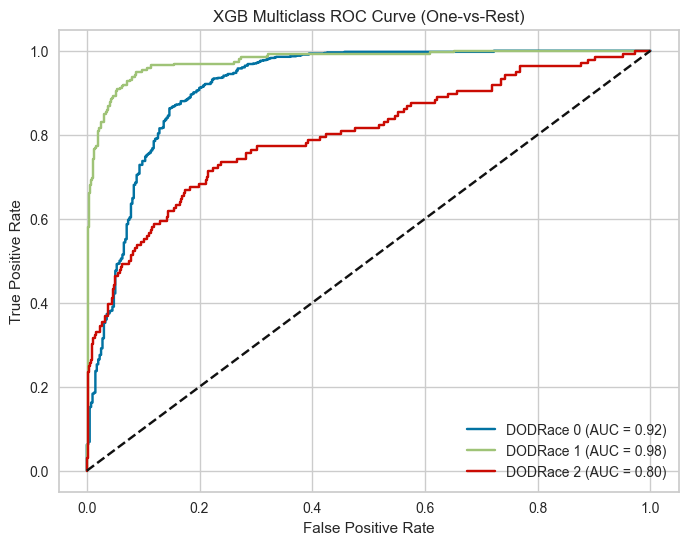

In [131]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc

# Proba tahminleri
y_score = xgb_model.predict_proba(X_test)

# DODRace sınıfları al
dodrace = np.unique(y_test_enc)

# Binary format
y_test_bin = label_binarize(y_test_enc, classes=dodrace)

plt.figure(figsize=(8,6))

# Her DODRace sınıfı için ROC curve
for i in range(len(dodrace)):
    fpr, tpr, _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc = auc(fpr, tpr)

    plt.plot(fpr, tpr, label=f"DODRace {dodrace[i]} (AUC = {roc_auc:.2f})"  )

# Random model çizgisi
plt.plot([0, 1], [0, 1], "k--")

plt.title("XGB Multiclass ROC Curve (One-vs-Rest)")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend()
plt.grid(True)
plt.show()

In [123]:
from xgboost import XGBClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import Pipeline

xgb_pipeline = Pipeline(steps=[ ("preprocessor", preprocessor),
        ("xgb", XGBClassifier( objective="multi:softprob", eval_metric="mlogloss", random_state=42, tree_method="hist", n_jobs=-1))])

param_grid = {
                "xgb__n_estimators": [100, 200, 300],
                "xgb__max_depth": [3, 5, 7],
                "xgb__learning_rate": [0.01, 0.05, 0.1],
                "xgb__subsample": [0.8, 1.0],
                "xgb__colsample_bytree": [0.7, 1.0],
                "xgb__min_child_weight": [1, 3],
                "xgb__gamma": [0, 0.1],
                "xgb__reg_alpha": [0, 0.1],
                "xgb__reg_lambda": [1, 5]
            }
# tree_method="hist":Verileri histogramlara bölerek split arar. Çok daha hızlıdır.

In [124]:
grid_xgb = GridSearchCV(
                        estimator=xgb_pipeline,
                        param_grid=param_grid,
                        scoring="f1_macro",
                        cv=5,
                        n_jobs=-1,
                        verbose=1,
                        refit=True
                        )

grid_xgb.fit(X_train, y_train_enc)

Fitting 5 folds for each of 1728 candidates, totalling 8640 fits


,"estimator estimator: estimator objectThis is assumed to implement the scikit-learn estimator interface.Either estimator needs to provide a ``score`` function,or ``scoring`` must be passed.","Pipeline(step...=None, ...))])"
,"param_grid param_grid: dict or list of dictionariesDictionary with parameters names (`str`) as keys and lists ofparameter settings to try as values, or a list of suchdictionaries, in which case the grids spanned by each dictionaryin the list are explored. This enables searching over any sequenceof parameter settings.","{'xgb__colsample_bytree': [0.7, 1.0], 'xgb__gamma': [0, 0.1], 'xgb__learning_rate': [0.01, 0.05, ...], 'xgb__max_depth': [3, 5, ...], ...}"
,"scoring scoring: str, callable, list, tuple or dict, default=NoneStrategy to evaluate the performance of the cross-validated model onthe test set.If `scoring` represents a single score, one can use:- a single string (see :ref:`scoring_string_names`);- a callable (see :ref:`scoring_callable`) that returns a single value;- `None`, the `estimator`'s :ref:`default evaluation criterion ` is used.If `scoring` represents multiple scores, one can use:- a list or tuple of unique strings;- a callable returning a dictionary where the keys are the metric names and the values are the metric scores;- a dictionary with metric names as keys and callables as values.See :ref:`multimetric_grid_search` for an example.",'f1_macro'
,"n_jobs n_jobs: int, default=NoneNumber of jobs to run in parallel.``None`` means 1 unless in a :obj:`joblib.parallel_backend` context.``-1`` means using all processors. See :term:`Glossary `for more details... versionchanged:: v0.20 `n_jobs` default changed from 1 to None",-1
,"refit refit: bool, str, or callable, default=TrueRefit an estimator using the best found parameters on the wholedataset.For multiple metric evaluation, this needs to be a `str` denoting thescorer that would be used to find the best parameters for refittingthe estimator at the end.Where there are considerations other than maximum score inchoosing a best estimator, ``refit`` can be set to a function whichreturns the selected ``best_index_`` given ``cv_results_``. In thatcase, the ``best_estimator_`` and ``best_params_`` will be setaccording to the returned ``best_index_`` while the ``best_score_``attribute will not be available.The refitted estimator is made available at the ``best_estimator_``attribute and permits using ``predict`` directly on this``GridSearchCV`` instance.Also for multiple metric evaluation, the attributes ``best_index_``,``best_score_`` and ``best_params_`` will only be available if``refit`` is set and all of them will be determined w.r.t this specificscorer.See ``scoring`` parameter to know more about multiple metricevaluation.See :ref:`sphx_glr_auto_examples_model_selection_plot_grid_search_digits.py`to see how to design a custom selection strategy using a callablevia `refit`.See :ref:`this example`for an example of how to use ``refit=callable`` to balance modelcomplexity and cross-validated score... versionchanged:: 0.20 Support for callable added.",True
,"cv cv: int, cross-validation generator or an iterable, default=NoneDetermines the cross-validation splitting strategy.Possible inputs for cv are:- None, to use the default 5-fold cross validation,- integer, to specify the number of folds in a `(Stratified)KFold`,- :term:`CV splitter`,- An iterable yielding (train, test) splits as arrays of indices.For integer/None inputs, if the estimator is a classifier and ``y`` iseither binary or multiclass, :class:`StratifiedKFold` is used. In allother cases, :class:`KFold` is used. These splitters are instantiatedwith `shuffle=False` so the splits will be the same across calls.Refer :ref:`User Guide ` for the variouscross-validation strategies that can be used here... versionchanged:: 0.22 ``cv`` default value if None changed from 3-fold to 5-fold.",5
,"verbose verbose: intControls the verbosity: the higher, the more messages.- >1 : the computation time for 

In [125]:
grid_xgb.best_estimator_

,"steps steps: list of tuplesList of (name of step, estimator) tuples that are to be chained insequential order. To be compatible with the scikit-learn API, all stepsmust define `fit`. All non-last steps must also define `transform`. See:ref:`Combining Estimators ` for more details.","[('preprocessor', ...), ('xgb', ...)]"
,"transform_input transform_input: list of str, default=NoneThe names of the :term:`metadata` parameters that should be transformed by thepipeline before passing it to the step consuming it.This enables transforming some input arguments to ``fit`` (other than ``X``)to be transformed by the steps of the pipeline up to the step which requiresthem. Requirement is defined via :ref:`metadata routing `.For instance, this can be used to pass a validation set through the pipeline.You can only set this if metadata routing is enabled, which youcan enable using ``sklearn.set_config(enable_metadata_routing=True)``... versionadded:: 1.6",None
,"memory memory: str or object with the joblib.Memory interface, default=NoneUsed to cache the fitted transformers of the pipeline. The last stepwill never be cached, even if it is a transformer. By default, nocaching is performed. If a string is given, it is the path to thecaching directory. Enabling caching triggers a clone of the transformersbefore fitting. Therefore, the transformer instance given to thepipeline cannot be inspected directly. Use the attribute ``named_steps``or ``steps`` to inspect estimators within the pipeline. Caching thetransformers is advantageous when fitting is time consuming. See:ref:`sphx_glr_auto_examples_neighbors_plot_caching_nearest_neighbors.py`for an example on how to enable caching.",None
,"verbose verbose: bool, default=FalseIf True, the time elapsed while fitting each step will be printed as itis completed.",False
,"transformers transformers: list of tuplesList of (name, transformer, columns) tuples specifying thetransformer objects to be applied to subsets of the data.name : str Like in Pipeline and FeatureUnion, this allows the transformer and its parameters to be set using ``set_params`` and searched in grid search.transformer : {'drop', 'passthrough'} or estimator Estimator must support :term:`fit` and :term:`transform`. Special-cased strings 'drop' and 'passthrough' are accepted as well, to indicate to drop the columns or to pass them through untransformed, respectively.columns : str, array-like of str, int, array-like of int, array-like of bool, slice or callable Indexes the data on its second axis. Integers are interpreted as positional columns, while strings can reference DataFrame columns by name. A scalar string or int should be used where ``transformer`` expects X to be a 1d array-like (vector), otherwise a 2d array will be passed to the transformer. A callable is passed the input data `X` and can return any of the above. To select multiple columns by name or dtype, you can use :obj:`make_column_selector`.","[('num', ...), ('cat', ...)]"
,"remainder remainder: {'drop', 'passthrough'} or estimator, default='drop'By default, only the specified columns in `transformers` aretransformed and combined in the output, and the non-specifiedcolumns are dropped. (default of ``'drop'``).By specifying ``remainder='passthrough'``, all remaining columns thatwere not specified in `transformers`, but present in the data passedto `fit` will be automatically passed through. This subset of columnsis concatenated with the output of the transformers. For dataframes,extra columns not seen during `fit` will be excluded from the outputof `transform`.By setting ``remainder`` to be an estimator, the remainingnon-specified columns will use the ``remainder`` estimator. Theestimator must support :term:`fit` and :term:`transform`.Note that using this feature requires that the DataFrame columnsinput at :term:`fit` and :term:`transform` have identical order.",'passthrough'
,"sparse_threshold sparse_threshold: float, default=0.3If the output of the different transforme

In [132]:
grid_xgb.best_params_

{'xgb__colsample_bytree': 0.7,
 'xgb__gamma': 0,
 'xgb__learning_rate': 0.1,
 'xgb__max_depth': 3,
 'xgb__min_child_weight': 3,
 'xgb__n_estimators': 300,
 'xgb__reg_alpha': 0,
 'xgb__reg_lambda': 1,
 'xgb__subsample': 0.8}

In [128]:
grid_xgb.best_score_

np.float64(0.7764008136913159)

In [134]:
from sklearn.metrics import accuracy_score, f1_score, recall_score, roc_auc_score, precision_score

y_pred_enc = grid_xgb.predict(X_test)
y_pred_enc_proba = grid_xgb.predict_proba(X_test)

grid_xgb_accuracy = accuracy_score(y_test_enc, y_pred_enc)

grid_xgb_f1 = f1_score(y_test_enc, y_pred_enc,average="macro") # Multiclass için average parametresi verildi 

grid_xgb_recall = recall_score(y_test_enc,y_pred_enc, average="macro")

grid_xgb_precision = precision_score(y_test_enc,y_pred_enc, average="macro")

grid_xgb_auc = roc_auc_score(y_test_enc,y_pred_enc_proba, multi_class="ovr")

print(f"Accuracy : {grid_xgb_accuracy:.4f}")
print(f"F1 Score : {grid_xgb_f1:.4f}")
print(f"Recall   : {grid_xgb_recall:.4f}")
print(f"Percision : {grid_xgb_precision:.4f}")
print(f"ROC AUC  : {grid_xgb_auc:.4f}")

Accuracy : 0.8683
F1 Score : 0.7634
Recall   : 0.7364
Percision : 0.8231
ROC AUC  : 0.9044


In [133]:
eval_metric(grid_xgb,X_train,y_train_enc, X_test, y_test_enc)

Test_Set
[[723  17  18]
 [ 29 227   4]
 [ 73  11  52]]
              precision    recall  f1-score   support

           0       0.88      0.95      0.91       758
           1       0.89      0.87      0.88       260
           2       0.70      0.38      0.50       136

    accuracy                           0.87      1154
   macro avg       0.82      0.74      0.76      1154
weighted avg       0.86      0.87      0.86      1154


Train_Set
[[3026    2    6]
 [  14 1024    0]
 [  86    9  448]]
              precision    recall  f1-score   support

           0       0.97      1.00      0.98      3034
           1       0.99      0.99      0.99      1038
           2       0.99      0.83      0.90       543

    accuracy                           0.97      4615
   macro avg       0.98      0.94      0.96      4615
weighted avg       0.98      0.97      0.97      4615



In [ ]:
from sklearn.metrics import confusion_matrix

y_pred_enc= xgb_model.predict(X_test)
cm = confusion_matrix(y_test_enc, y_pred_enc)

plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt='d', cmap="YlGnBu")

plt.title("XGB Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

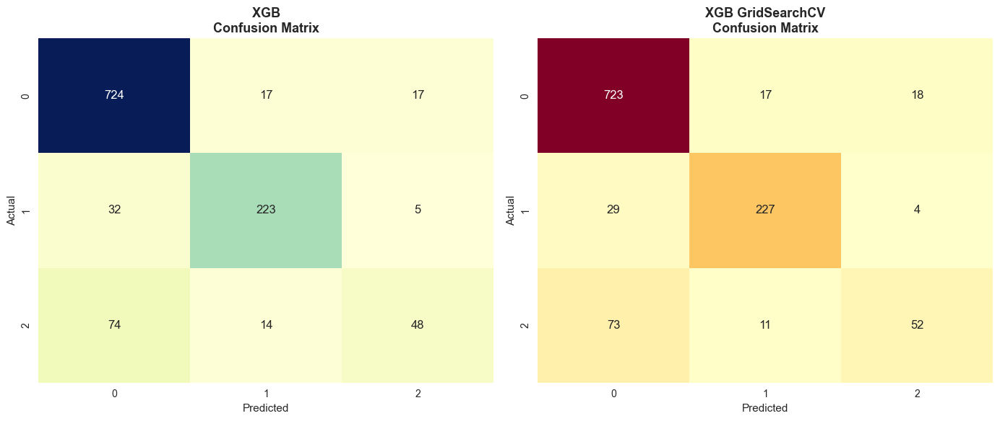

In [135]:
# Tahminler
y_pred_enc_xgb = xgb_model.predict(X_test)
y_pred_enc_grid = grid_xgb.predict(X_test)

# Confusion Matrix'ler
cm_xgb = confusion_matrix(y_test_enc, y_pred_enc_xgb)
cm_grid = confusion_matrix(y_test_enc, y_pred_enc_grid )

# Yan yana grafikler
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# XGB 
sns.heatmap(cm_xgb , annot=True, fmt="d", cmap="YlGnBu", ax=axes[0], cbar=False)

axes[0].set_title("XGB\nConfusion Matrix", fontsize=13, fontweight="bold")
axes[0].set_xlabel("Predicted")
axes[0].set_ylabel("Actual")

#XGB GridSearchCV
sns.heatmap(cm_grid, annot=True, fmt="d", cmap="YlOrRd", ax=axes[1], cbar=False)

axes[1].set_title("XGB GridSearchCV\nConfusion Matrix",fontsize=13,fontweight="bold")
axes[1].set_xlabel("Predicted")
axes[1].set_ylabel("Actual")

plt.tight_layout()
plt.show()

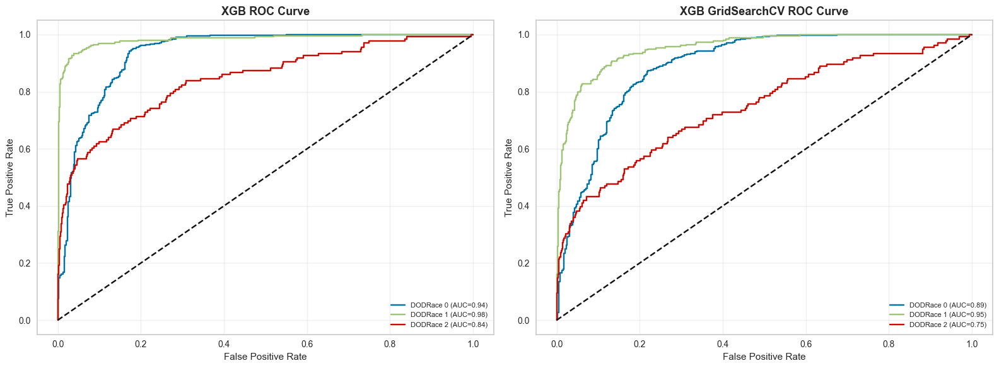

In [136]:
# Tahmin olasılıkları
y_pred_enc_xgb = xgb_model.predict(X_test)
y_pred_enc_grid = grid_xgb.predict(X_test)

# Sınıflar
dodrace = np.unique(y_test_enc)

# One-vs-Rest için binarize
y_test_bin = label_binarize(y_test_enc, classes=dodrace)

# Yan yana grafikler
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# =========================
# XGB
# =========================
for i in range(len(dodrace)):

    fpr, tpr, _ = roc_curve( y_test_bin[:, i], y_score_log[:, i] )

    roc_auc = auc(fpr, tpr)

    axes[0].plot(fpr, tpr, label=f"DODRace {dodrace[i]} (AUC={roc_auc:.2f})" )

axes[0].plot([0, 1], [0, 1], "k--")

axes[0].set_title("XGB ROC Curve", fontsize=13, fontweight="bold")

axes[0].set_xlabel("False Positive Rate")
axes[0].set_ylabel("True Positive Rate")
axes[0].legend(fontsize=8)
axes[0].grid(alpha=0.3)

# =========================
# XGB GridSearchCV
# =========================
for i in range(len(dodrace)):

    fpr, tpr, _ = roc_curve(y_test_bin[:, i], y_score_grid[:, i])

    roc_auc = auc(fpr, tpr)

    axes[1].plot(fpr, tpr,label=f"DODRace {dodrace[i]} (AUC={roc_auc:.2f})"  )

axes[1].plot([0, 1], [0, 1], "k--")

axes[1].set_title("XGB GridSearchCV ROC Curve", fontsize=13, fontweight="bold")

axes[1].set_xlabel("False Positive Rate")
axes[1].set_ylabel("True Positive Rate")
axes[1].legend(fontsize=8)
axes[1].grid(alpha=0.3)

plt.tight_layout()
plt.show()

## Comparing Models

In [ ]:
fig, axes = plt.subplots(3, 2, figsize=(18, 14))
axes = axes.flatten()

# Accuracy
compare_acc = compare.sort_values(by="Accuracy", ascending=False)
ax = sns.barplot( x="Accuracy", y="Model",data=compare_acc,palette="magma", ax=axes[0])
labels(ax)
axes[0].set_title("Model Accuracy Scores")

# F1
compare_f1 = compare.sort_values(by="F1", ascending=False)
ax = sns.barplot(x="F1",y="Model", data=compare_f1, palette="magma", ax=axes[1])
labels(ax)
axes[1].set_title("Model F1 Scores")

# Precision
compare_precision = compare.sort_values( by="Precision", ascending=False)
ax = sns.barplot( x="Precision", y="Model", data=compare_precision, palette="magma", ax=axes[2])
labels(ax)
axes[2].set_title("Model Precision Scores")

# Recall
compare_recall = compare.sort_values(by="Recall", ascending=False)
ax = sns.barplot(x="Recall",y="Model", palette="magma", ax=axes[3])
labels(ax)
axes[3].set_title("Model Recall Scores")

# ROC AUC
compare_auc = compare.sort_values( by="ROC_AUC", ascending=False)
ax = sns.barplot(x="ROC_AUC", y="Model", data=compare_auc, palette="magma", ax=axes[4])
labels(ax)
axes[4].set_title("Model ROC-AUC Scores")


# Son boş subplot'u kaldır
fig.delaxes(axes[5])
plt.tight_layout()
plt.show()

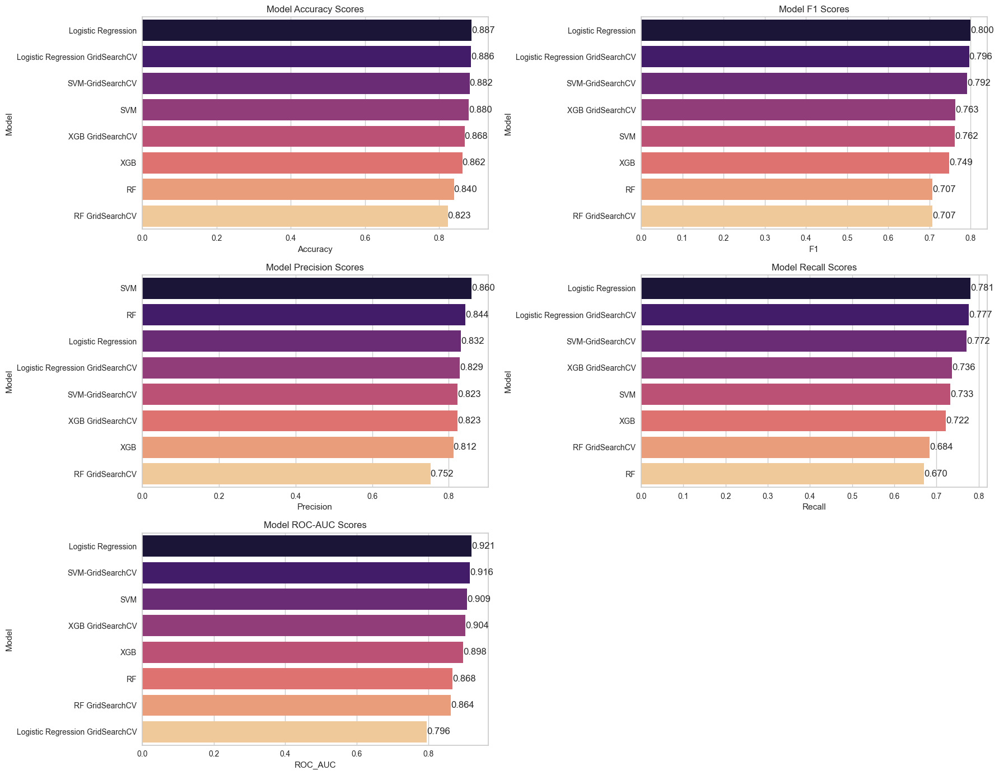

In [142]:
compare = pd.DataFrame({
    "Model": ["Logistic Regression", "Logistic Regression GridSearchCV","SVM", "SVM-GridSearchCV", "RF","RF GridSearchCV", "XGB", "XGB GridSearchCV"],
 # Multiclass için Accuracy ,F1  ve  "ROC_AUC" scoreleri kıyaslanacaktır. 
    "Accuracy": [log_accuracy,log_grid_accuracy ,svm_accuracy, grid_svm_accuracy, rf_model_accuracy ,grid_rf_accuracy ,xgb_model_accuracy, grid_xgb_accuracy],
    "F1": [log_f1 ,log_grid_f1 ,svm_f1, grid_svm_f1, rf_model_f1 , grid_rf_f1 ,xgb_model_f1, grid_xgb_f1 ],
    "Precision": [log_precision,log_grid_precision,svm_precision,grid_svm_precision, rf_model_precision ,grid_rf_precision, xgb_model_precision, grid_xgb_precision],
    "Recall": [log_recall,log_grid_recall,svm_recall, grid_svm_recall, rf_model_recall, grid_rf_recall, xgb_model_recall ,grid_xgb_recall],
    "ROC_AUC": [log_auc ,log_grid_f1 , svm_auc, grid_svm_auc, rf_model_auc , grid_rf_auc,xgb_model_auc,grid_xgb_auc ]})


def labels(ax):

    for p in ax.patches:
        width = p.get_width()                    # get bar length
        ax.text(width,                           # set the text at 1 unit right of the bar
                p.get_y() + p.get_height() / 2,  # get Y coordinate + X coordinate / 2
                '{:1.3f}'.format(width),         # set variable to display, 2 decimals
                ha='left',                       # horizontal alignment
                va='center')                     # vertical alignment

fig, axes = plt.subplots(3, 2, figsize=(18, 14))
axes = axes.flatten()

# Accuracy
compare_acc = compare.sort_values(by="Accuracy", ascending=False)
ax = sns.barplot( x="Accuracy",  y="Model",  data=compare_acc, palette="magma", ax=axes[0])
labels(ax)
axes[0].set_title("Model Accuracy Scores")

# F1
compare_f1 = compare.sort_values(by="F1", ascending=False)
ax = sns.barplot( x="F1", y="Model", data=compare_f1, palette="magma", ax=axes[1])
labels(ax)
axes[1].set_title("Model F1 Scores")

# Precision
compare_precision = compare.sort_values(by="Precision", ascending=False)
ax = sns.barplot(x="Precision", y="Model", data=compare_precision, palette="magma", ax=axes[2])
labels(ax)
axes[2].set_title("Model Precision Scores")

# Recall
compare_recall = compare.sort_values(by="Recall", ascending=False)
ax = sns.barplot(x="Recall", y="Model", data=compare_recall, palette="magma", ax=axes[3])
labels(ax)
axes[3].set_title("Model Recall Scores")

# ROC AUC
compare_auc = compare.sort_values(by="ROC_AUC", ascending=False)
ax = sns.barplot(x="ROC_AUC", y="Model", data=compare_auc, palette="magma", ax=axes[4])
labels(ax)
axes[4].set_title("Model ROC-AUC Scores")

# Son boş subplot'u kaldır
fig.delaxes(axes[5])
plt.tight_layout()
plt.show()


# Model Evaluation and Final Model Selection

## Logistic Regression Analysis

Logistic Regression modeli veri seti üzerinde oldukça başarılı sonuçlar üretmiştir. Model test veri setinde %88.73 Accuracy, %79.98 Macro F1-Score ve 0.9213 ROC-AUC değeri elde etmiştir. Özellikle sınıflar arasındaki genel ayrım performansını gösteren ROC-AUC skorunun yüksek olması, modelin farklı etnik grupları başarılı şekilde ayırt edebildiğini göstermektedir.

Train ve test performansları karşılaştırıldığında metrikler arasında oldukça düşük farklar gözlemlenmiştir. Ayrıca 10-Fold Cross Validation sonuçlarının test sonuçları ile büyük ölçüde uyumlu olması modelin yüksek genelleme kabiliyetine sahip olduğunu göstermektedir. Bu durum modelin veri setini ezberlemek yerine veri içerisindeki gerçek örüntüleri öğrendiğini göstermektedir.

Sınıf bazında incelendiğinde White ve Black sınıflarında oldukça yüksek başarı elde edilirken, örnek sayısı daha az olan Hispanic sınıfında performansın nispeten düştüğü görülmektedir. Ancak bu durum veri setindeki sınıf dağılımı ile ilişkilidir ve tüm modellerde benzer şekilde gözlemlenmiştir.

---

## Logistic Regression GridSearchCV Analysis

GridSearchCV ile Logistic Regression modelinin hiperparametre optimizasyonu gerçekleştirilmiştir. En iyi parametre kombinasyonu olarak L2 regularization, saga solver ve C=1.389 değeri elde edilmiştir.

Ancak optimize edilmiş modelin performansı Vanilla Logistic Regression modeline kıyasla anlamlı bir iyileşme göstermemiştir. Accuracy, F1-Score ve ROC-AUC değerleri neredeyse aynı seviyede kalmıştır. Bu durum başlangıç modelinin zaten optimuma oldukça yakın çalıştığını göstermektedir.

Sonuç olarak hiperparametre optimizasyonunun ek hesaplama maliyetine rağmen kayda değer bir performans artışı sağlamadığı görülmüştür.

---

## Support Vector Machine (SVM) Analysis

Support Vector Machine modeli veri setinde güçlü sonuçlar üretmiştir. Özellikle yüksek precision değeri modelin yaptığı tahminlerde oldukça güvenilir olduğunu göstermektedir.

Ancak Cross Validation sonuçları incelendiğinde train ve test performansları arasında belirgin farklar gözlemlenmiştir. Eğitim verisinde elde edilen yaklaşık %99 doğruluk değeri ile test performansı arasındaki fark modelin belirli ölçüde overfitting eğilimi gösterdiğini ortaya koymaktadır.

Özellikle üçüncü sınıfın (Hispanic) recall değerinin düşük olması, modelin az temsil edilen sınıfları öğrenmekte zorlandığını göstermektedir.

---

## SVM GridSearchCV Analysis

GridSearchCV ile optimize edilen SVM modeli Vanilla SVM modeline göre daha dengeli sonuçlar üretmiştir. En iyi parametre kombinasyonu olarak RBF kernel, C=100 ve gamma=0.001 belirlenmiştir.

Optimize edilmiş model F1-Score ve Recall değerlerinde küçük iyileştirmeler sağlamış olsa da Logistic Regression modelinin genel performansını geçememiştir. Ayrıca eğitim ve test skorları arasındaki fark devam ettiği için modelde halen belirli seviyede overfitting eğilimi bulunmaktadır.

---

## Random Forest Analysis

Random Forest modeli ensemble öğrenme yaklaşımı sayesinde Decision Tree tabanlı güçlü bir sınıflandırıcı olarak değerlendirilmiştir.

Model test veri setinde kabul edilebilir sonuçlar üretmiş olsa da eğitim veri setinde %100 doğruluk elde etmiştir. Bu durum modelin eğitim verisini tamamen ezberlediğini göstermektedir.

Cross Validation sonuçları incelendiğinde train ve test performansları arasındaki fark oldukça yüksektir. Özellikle üçüncü sınıftaki düşük recall değeri modelin az temsil edilen sınıfları tahmin etmekte zorlandığını göstermektedir.

Bu sonuçlar Random Forest modelinde belirgin overfitting problemi bulunduğunu ortaya koymaktadır.

---

## Random Forest GridSearchCV Analysis

Random Forest modeli hiperparametre optimizasyonu sonrasında daha kontrollü bir yapı kazanmıştır. Maksimum derinlik sınırlandırılarak ve minimum yaprak örnek sayısı artırılarak modelin karmaşıklığı azaltılmıştır.

Buna rağmen elde edilen performans Vanilla Random Forest modelinden daha yüksek olmamıştır. Accuracy ve F1 skorlarında düşüş gözlenmiş, model Logistic Regression ve SVM modellerinin gerisinde kalmıştır.

Dolayısıyla Random Forest modeli bu problem için en uygun model olarak değerlendirilmemiştir.

---

## XGBoost Analysis

XGBoost modeli modern gradient boosting algoritmaları arasında yer almakta olup karmaşık ilişkileri öğrenebilme kapasitesi oldukça yüksektir.

Model test veri setinde başarılı sonuçlar üretmesine rağmen eğitim veri setinde neredeyse kusursuz performans göstermiştir. Bu durum modelin veri setini aşırı öğrenme eğiliminde olduğunu göstermektedir.

Özellikle üçüncü sınıfta elde edilen düşük recall değeri modelin az temsil edilen sınıfları ayırt etmekte zorlandığını ortaya koymaktadır.

---

## XGBoost GridSearchCV Analysis

GridSearchCV sonrasında XGBoost modelinde sınırlı düzeyde performans artışı elde edilmiştir. Accuracy değeri %86.22'den %86.83'e yükselmiş, F1-Score değeri de artış göstermiştir.

Ancak optimize edilmiş modelin performansı Logistic Regression ve SVM modellerinin altında kalmıştır. Ayrıca eğitim ve test skorları arasındaki fark halen yüksek olduğundan modelde overfitting etkisinin tamamen ortadan kalkmadığı görülmüştür.

---

# Final Model Selection

Tüm modeller Accuracy, Precision, Recall, F1-Score, ROC-AUC ve Cross Validation sonuçları dikkate alınarak karşılaştırılmıştır.

Karşılaştırma sonucunda Vanilla Logistic Regression modeli final model olarak seçilmiştir.

### Final Model Advantages

* En yüksek Accuracy değeri (%88.73)
* En yüksek Macro F1-Score (%79.98)
* En yüksek ROC-AUC değeri (0.9213)
* Train ve test skorlarının dengeli olması
* Cross Validation sonuçları ile uyumlu performans göstermesi
* Overfitting belirtisinin bulunmaması
* Yüksek yorumlanabilirlik
* Düşük hesaplama maliyeti
* Güçlü genelleme kabiliyeti

Sonuç olarak Logistic Regression modeli, hem performans hem de genelleme yeteneği açısından diğer modellerden daha başarılı bulunmuş ve ANSUR II veri setinde etnik grup sınıflandırması problemi için en uygun model olarak belirlenmiştir.



# Before the Deployment 
- Choose the model that works best based on your chosen metric
- For final step, fit the best model with whole dataset to get better performance.
- And your model ready to deploy, dump your model and scaler.

In [ ]:
#df = pd.read_csv("ANSUR II Public_EDA.csv")

In [147]:
X = df.drop("dodrace", axis=1)
y = df["dodrace"]

preprocessor = ColumnTransformer(transformers=[('num', StandardScaler(), numeric_col),
        ('cat', OneHotEncoder(handle_unknown='ignore', sparse_output=False, drop='first'), cat_col)],
        remainder='passthrough')

# full dataset ile yeniden eğit
final_model = Pipeline(steps=[("preprocessor", preprocessor),("logistic", LogisticRegression(max_iter=1000))])

final_model.fit(X, y)

,"steps steps: list of tuplesList of (name of step, estimator) tuples that are to be chained insequential order. To be compatible with the scikit-learn API, all stepsmust define `fit`. All non-last steps must also define `transform`. See:ref:`Combining Estimators ` for more details.","[('preprocessor', ...), ('logistic', ...)]"
,"transform_input transform_input: list of str, default=NoneThe names of the :term:`metadata` parameters that should be transformed by thepipeline before passing it to the step consuming it.This enables transforming some input arguments to ``fit`` (other than ``X``)to be transformed by the steps of the pipeline up to the step which requiresthem. Requirement is defined via :ref:`metadata routing `.For instance, this can be used to pass a validation set through the pipeline.You can only set this if metadata routing is enabled, which youcan enable using ``sklearn.set_config(enable_metadata_routing=True)``... versionadded:: 1.6",None
,"memory memory: str or object with the joblib.Memory interface, default=NoneUsed to cache the fitted transformers of the pipeline. The last stepwill never be cached, even if it is a transformer. By default, nocaching is performed. If a string is given, it is the path to thecaching directory. Enabling caching triggers a clone of the transformersbefore fitting. Therefore, the transformer instance given to thepipeline cannot be inspected directly. Use the attribute ``named_steps``or ``steps`` to inspect estimators within the pipeline. Caching thetransformers is advantageous when fitting is time consuming. See:ref:`sphx_glr_auto_examples_neighbors_plot_caching_nearest_neighbors.py`for an example on how to enable caching.",None
,"verbose verbose: bool, default=FalseIf True, the time elapsed while fitting each step will be printed as itis completed.",False
,"transformers transformers: list of tuplesList of (name, transformer, columns) tuples specifying thetransformer objects to be applied to subsets of the data.name : str Like in Pipeline and FeatureUnion, this allows the transformer and its parameters to be set using ``set_params`` and searched in grid search.transformer : {'drop', 'passthrough'} or estimator Estimator must support :term:`fit` and :term:`transform`. Special-cased strings 'drop' and 'passthrough' are accepted as well, to indicate to drop the columns or to pass them through untransformed, respectively.columns : str, array-like of str, int, array-like of int, array-like of bool, slice or callable Indexes the data on its second axis. Integers are interpreted as positional columns, while strings can reference DataFrame columns by name. A scalar string or int should be used where ``transformer`` expects X to be a 1d array-like (vector), otherwise a 2d array will be passed to the transformer. A callable is passed the input data `X` and can return any of the above. To select multiple columns by name or dtype, you can use :obj:`make_column_selector`.","[('num', ...), ('cat', ...)]"
,"remainder remainder: {'drop', 'passthrough'} or estimator, default='drop'By default, only the specified columns in `transformers` aretransformed and combined in the output, and the non-specifiedcolumns are dropped. (default of ``'drop'``).By specifying ``remainder='passthrough'``, all remaining columns thatwere not specified in `transformers`, but present in the data passedto `fit` will be automatically passed through. This subset of columnsis concatenated with the output of the transformers. For dataframes,extra columns not seen during `fit` will be excluded from the outputof `transform`.By setting ``remainder`` to be an estimator, the remainingnon-specified columns will use the ``remainder`` estimator. Theestimator must support :term:`fit` and :term:`transform`.Note that using this feature requires that the DataFrame columnsinput at :term:`fit` and :term:`transform` have identical order.",'passthrough'
,"sparse_threshold sparse_threshold: float, default=0.3If the output of the different trans

In [148]:
import joblib

joblib.dump(final_model, "final_logistic_model.pkl")

['final_logistic_model.pkl']

In [149]:
import joblib

model = joblib.load("final_logistic_model.pkl")

In [155]:
df.head(5)

,abdominalextensiondepthsitting,acromialheight,anklecircumference,axillaheight,balloffootcircumference,balloffootlength,bicepscircumferenceflexed,bicristalbreadth,bideltoidbreadth,bimalleolarbreadth,...,foot_width_ratio,hand_length_ratio,hand_breadth_ratio,shoulder_hip_ratio,waist_hip_ratio,chest_waist_ratio,arm_length_ratio,forearm_upper_ratio,tibia_femur_ratio,neck_height_ratio
0,266,1467,222,1347,253,202,369,274,493,71,...,36.996337,10.867117,46.632124,1.207831,0.953013,1.151125,33.783784,0.810089,0.534276,22.522523
1,233,1395,220,1293,245,193,338,257,479,67,...,37.262357,11.457109,44.102564,1.262821,0.921610,1.173563,33.137485,0.779141,0.518519,22.326675
2,287,1430,230,1327,256,196,408,261,544,75,...,38.148148,11.700288,45.812808,1.223496,0.914611,1.161826,34.812680,0.785924,0.519608,23.227666
3,234,1347,230,1239,262,199,359,262,518,73,...,39.700375,11.722054,46.907216,1.186391,0.864783,1.299883,33.232628,0.803226,0.525384,24.592145
4,250,1585,247,1478,267,224,356,263,524,80,...,36.393443,11.389760,43.119266,1.310241,0.843537,1.207373,33.490073,0.811828,0.535780,20.794148


In [156]:
new_data = X.iloc[[0]].copy()

In [157]:
prediction = model.predict(new_data)

print(prediction)

[1]


Model Deployment Preparation

Model karşılaştırmaları sonucunda Vanilla Logistic Regression modeli final model olarak seçilmiştir. Model yüksek doğruluk oranı (%88.73), en yüksek F1-Skoru (%79.98) ve güçlü ROC-AUC değeri (0.9213) ile diğer modellerden daha başarılı performans göstermiştir.

Dağıtıma hazırlık aşamasında model, eğitim ve test verileri tekrar birleştirilerek tüm veri seti üzerinde yeniden eğitilmiştir. Böylece model mevcut tüm gözlemlerden öğrenerek maksimum bilgi ile eğitilmiştir.

Model ve ön işleme adımları (StandardScaler ve OneHotEncoder) Pipeline yapısı içerisinde birleştirilmiş ve joblib kütüphanesi kullanılarak final_logistic_model.pkl dosyası olarak dışa aktarılmıştır. Bu sayede model üretim ortamında doğrudan yüklenip yeni gözlemler üzerinde tahmin yapmak için hazır hale getirilmiştir.

# SMOTE
https://machinelearningmastery.com/smote-oversampling-for-imbalanced-classification/

https://www.geeksforgeeks.org/machine-learning/smote-for-imbalanced-classification-with-python/

**SMOTE (Synthetic Minority Over-sampling Technique)**

**Kullanım Amacı:**

SMOTE, dengesiz veri setlerini dengelemek için kullanılan bir örnekleme tekniğidir. Dengesiz veri setleri, bir sınıfın diğer sınıflardan çok daha fazla örneğe sahip olduğu durumları ifade eder. Bu tür veri setlerinde, azınlık sınıfı (daha az örneği olan sınıf) genellikle göz ardı edilir ve model, çoğunluk sınıfını tahmin etmekte daha başarılı olur. SMOTE, azınlık sınıfından yeni "sentetik" örnekler üreterek bu dengesizliği gidermeye çalışır.

**Kullanım Yerleri:**

- **Kredi Riski Değerlendirmesi**: Dolandırıcılık durumları genellikle dengesizdir; yani, çoğu işlem yasal olup, sadece birkaçı dolandırıcılıktır.
- **Tıbbi Tanı**: Örneğin, bir hastalık nadir görülüyorsa, sağlıklı ve hasta örnekleri arasında dengesizlik olacaktır.
- **Müşteri Terk Analizi**: Çoğu müşteri hizmeti kullanmaya devam ederken, sadece birkaçı hizmeti bırakır.
- **Anomali Tespiti**: Normal durumlar genellikle daha sık görülürken, anomaliler (örneğin, güvenlik ihlalleri) nadirdir.

**Unbalanced Datalar için Önemi:**

Dengesiz veri setleri, sınıflandırma modellerinin performansını olumsuz etkileyebilir. Model, çoğunluk sınıfını tahmin etmekte iyi olabilir, ancak azınlık sınıfını genellikle göz ardı eder. Bu, özellikle azınlık sınıfı daha önemliyse (örneğin, dolandırıcılık tespiti, nadir hastalıkların teşhisi) problem olabilir. SMOTE, bu tür problemleri mitigasyon (hafifletme) amacıyla kullanılır.

**Nasıl Çalışır?**

1. Azınlık sınıfından rastgele bir örnek seçilir.
2. Bu örneğin k en yakın komşusu hesaplanır.
3. Rastgele seçilen k en yakın komşulardan biri seçilir.
4. Rastgele bir interpolasyon faktörü* üretilir.
5. Bu faktör kullanılarak yeni bir "sentetik" örnek oluşturulur.

**Kullanımı:**

Python'da, SMOTE genellikle imbalanced-learn kütüphanesi ile kullanılır.

*Interpolasyon faktörü, SMOTE algoritmasında yeni "sentetik" örnekler oluştururken kullanılan bir ağırlık faktörüdür. Temel fikir, azınlık sınıfından seçilen bir örnekle onun k en yakın komşuları arasında yeni bir örnek oluşturmaktır. Interpolasyon faktörü, bu iki örnek arasında ne kadar "yakın" olacağını belirler. SMOTE algoritmasının esnekliğini artırır ve azınlık sınıfının örneklerini daha geniş bir alana yayarak modelin genelleme yeteneğini iyileştirmeye yardımcı olur.

In [10]:
import pandas as pd

print("Before SMOTE")
print(y_train.value_counts())

Before SMOTE
dodrace
1    3034
2    1038
3     543
Name: count, dtype: int64


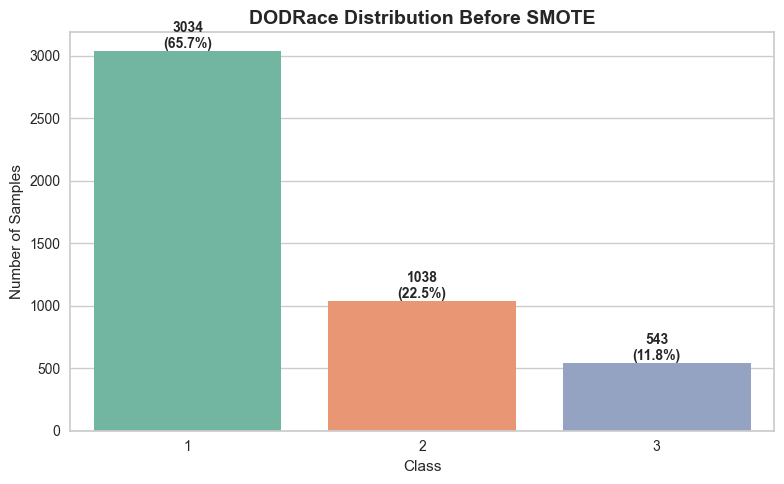

In [11]:
plt.figure(figsize=(8,5))

ax = sns.countplot( x=y_train, palette="Set2")
total = len(y_train)

for p in ax.patches:
    count = int(p.get_height())
    percentage = 100 * count / total

    ax.annotate(f"{count}\n({percentage:.1f}%)",
                (p.get_x() + p.get_width()/2, p.get_height()),
                 ha="center",
                 va="bottom",
                 fontsize=10,
                fontweight="bold"
                )

plt.title("DODRace Distribution Before SMOTE",fontsize=14, fontweight="bold")
plt.xlabel("Class")
plt.ylabel("Number of Samples")

plt.tight_layout()
plt.show()
# datada bağımlı hedef feature DODRace dağılımı görülmektedir. Dengesiz imbalance veri setidir. 

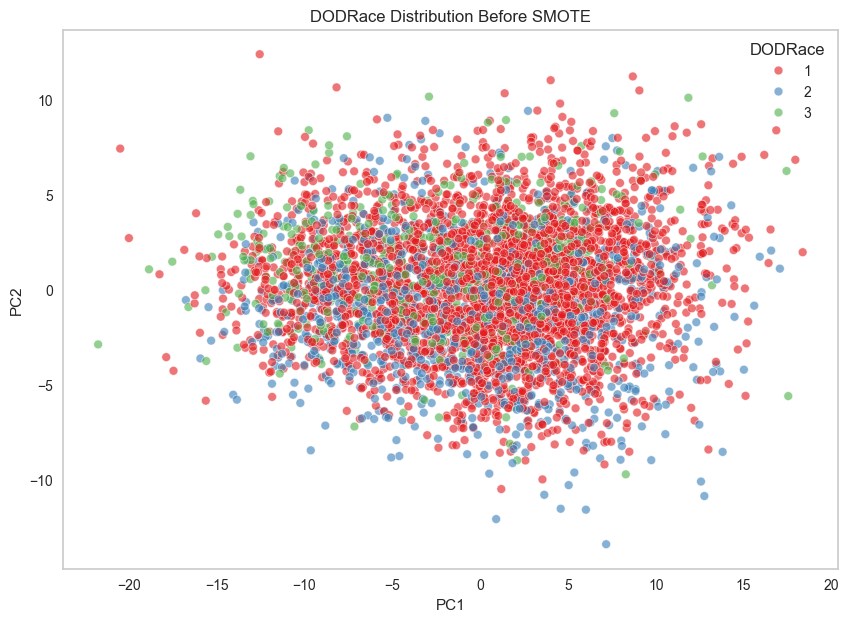

In [14]:
from sklearn.decomposition import PCA
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Preprocess edilmiş veri
X_train_transformed = preprocessor.fit_transform(X_train)

# PCA
pca = PCA(n_components=2, random_state=42)

X_pca_before = pca.fit_transform(X_train_transformed)

pca_before = pd.DataFrame({
    "PC1": X_pca_before[:,0],
    "PC2": X_pca_before[:,1],
    "DODRace": y_train.values
})

plt.figure(figsize=(10,7))

sns.scatterplot(
    data=pca_before,
    x="PC1",
    y="PC2",
    hue="DODRace",
    palette="Set1",
    alpha=0.6,
    s=40
)

plt.title("DODRace Distribution Before SMOTE")
plt.grid(False)
plt.show()

In [16]:
!pip uninstall imbalanced-learn -y
!pip install --upgrade imbalanced-learn

Found existing installation: imbalanced-learn 0.14.2
Uninstalling imbalanced-learn-0.14.2:
  Successfully uninstalled imbalanced-learn-0.14.2
  Using cached imbalanced_learn-0.14.2-py3-none-any.whl.metadata (8.9 kB)
Using cached imbalanced_learn-0.14.2-py3-none-any.whl (236 kB)


In [17]:
from imblearn.over_sampling import SMOTE

print("SMOTE import başarılı")

SMOTE import başarılı


In [18]:
smote = SMOTE(random_state=42)

X_train_smote, y_train_smote = smote.fit_resample( X_train_transformed, y_train)

print("After SMOTE")
print(pd.Series(y_train_smote).value_counts())

After SMOTE
dodrace
1    3034
2    3034
3    3034
Name: count, dtype: int64


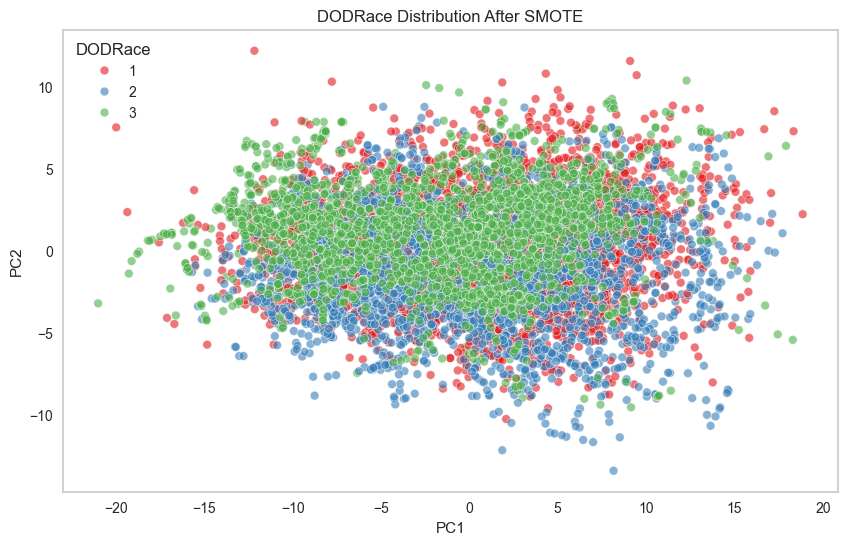

In [19]:
pca = PCA(n_components=2, random_state=42)

X_pca_after = pca.fit_transform(X_train_smote)

pca_after = pd.DataFrame({
    "PC1": X_pca_after[:,0],
    "PC2": X_pca_after[:,1],
    "DODRace": y_train_smote
})

sns.scatterplot(
    data=pca_after,
    x="PC1",
    y="PC2",
    hue="DODRace",
    palette="Set1",
    alpha=0.6,
    s=40
)

plt.title("DODRace Distribution After SMOTE")
plt.grid(False)
plt.show()

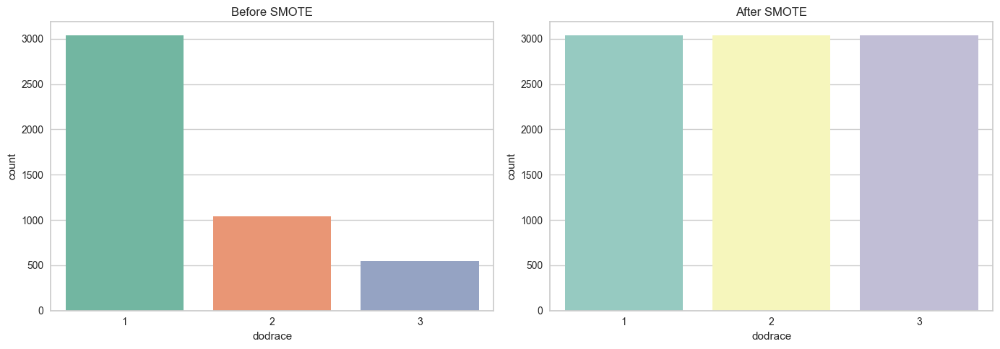

In [20]:
fig, axes = plt.subplots(1, 2, figsize=(14,5))

sns.countplot(
    x=y_train,
    palette="Set2",
    ax=axes[0]
)

axes[0].set_title("Before SMOTE")

sns.countplot(
    x=y_train_smote,
    palette="Set3",
    ax=axes[1]
)

axes[1].set_title("After SMOTE")

plt.tight_layout()
plt.show()

In [21]:
from imblearn.pipeline import Pipeline
from imblearn.over_sampling import SMOTE
from sklearn.linear_model import LogisticRegression

preprocessor = ColumnTransformer(transformers=[('num', StandardScaler(), numeric_col),
        ('cat', OneHotEncoder(handle_unknown='ignore', sparse_output=False, drop='first'), cat_col)],
        remainder='passthrough')


log_smote_model = Pipeline([("preprocessor", preprocessor),("smote", SMOTE(random_state=42)),("logistic", LogisticRegression( max_iter=1000,random_state=42))])

log_smote_model.fit(X_train, y_train)

,steps,"[('preprocessor', ...), ('smote', ...), ...]"
,transform_input,None
,memory,None
,verbose,False
,"transformers transformers: list of tuplesList of (name, transformer, columns) tuples specifying thetransformer objects to be applied to subsets of the data.name : str Like in Pipeline and FeatureUnion, this allows the transformer and its parameters to be set using ``set_params`` and searched in grid search.transformer : {'drop', 'passthrough'} or estimator Estimator must support :term:`fit` and :term:`transform`. Special-cased strings 'drop' and 'passthrough' are accepted as well, to indicate to drop the columns or to pass them through untransformed, respectively.columns : str, array-like of str, int, array-like of int, array-like of bool, slice or callable Indexes the data on its second axis. Integers are interpreted as positional columns, while strings can reference DataFrame columns by name. A scalar string or int should be used where ``transformer`` expects X to be a 1d array-like (vector), otherwise a 2d array will be passed to the transformer. A callable is passed the input data `X` and can return any of the above. To select multiple columns by name or dtype, you can use :obj:`make_column_selector`.","[('num', ...), ('cat', ...)]"
,"remainder remainder: {'drop', 'passthrough'} or estimator, default='drop'By default, only the specified columns in `transformers` aretransformed and combined in the output, and the non-specifiedcolumns are dropped. (default of ``'drop'``).By specifying ``remainder='passthrough'``, all remaining columns thatwere not specified in `transformers`, but present in the data passedto `fit` will be automatically passed through. This subset of columnsis concatenated with the output of the transformers. For dataframes,extra columns not seen during `fit` will be excluded from the outputof `transform`.By setting ``remainder`` to be an estimator, the remainingnon-specified columns will use the ``remainder`` estimator. Theestimator must support :term:`fit` and :term:`transform`.Note that using this feature requires that the DataFrame columnsinput at :term:`fit` and :term:`transform` have identical order.",'passthrough'
,"sparse_threshold sparse_threshold: float, default=0.3If the output of the different transformers contains sparse matrices,these will be stacked as a sparse matrix if the overall density islower than this value. Use ``sparse_threshold=0`` to always returndense. When the transformed output consists of all dense data, thestacked result will be dense, and this keyword will be ignored.",0.3
,"n_jobs n_jobs: int, default=NoneNumber of jobs to run in parallel.``None`` means 1 unless in a :obj:`joblib.parallel_backend` context.``-1`` means using all processors. See :term:`Glossary `for more details.",None
,"transformer_weights transformer_weights: dict, default=NoneMultiplicative weights for features per transformer. The output of thetransformer is multiplied by these weights. Keys are transformer names,values the weights.",None
,"verbose verbose: bool, default=FalseIf True, the time elapsed while fitting each transformer will beprinted as it is completed.",False
,"verbose_feature_names_out verbose_feature_names_out: bool, str or Callable[[str, str], str], default=True- If True, :meth:`ColumnTransformer.get_feature_names_out` will prefix all feature names with the name of the transformer that generated that feature. It is equivalent to setting `verbose_feature_names_out=""{transformer_name}__{feature_name}""`.- If False, :meth:`ColumnTransformer.get_feature_names_out` will not prefix any feature names and will error if feature names are not unique.- If ``Callable[[str, str], str]``, :meth:`ColumnTransformer.get_feature_names_out` will rename all the features using the name of the transformer. The first argument of the callable is the transformer name and the second argument is the feature name. The returned string will be the new feature name.- If ``str``, it must be a string ready for formatti

In [42]:
from sklearn.metrics import accuracy_score, f1_score, recall_score, roc_auc_score, precision_score

y_pred_smote = log_smote_model.predict(X_test)
y_pred_smote_proba = log_smote_model.predict_proba(X_test)

log_smote_accuracy = accuracy_score(y_test,y_pred_smote)

log_smote_f1 = f1_score(y_test, y_pred_smote,average="macro") # Multiclass için average parametresi verildi 

log_smote_recall = recall_score(y_test,y_pred_smote, average="macro")

log_smote_precision = precision_score(y_test,y_pred_smote, average="macro")

log_smote_auc = roc_auc_score(y_test,y_pred_smote_proba , multi_class="ovr")

print(f"Accuracy : {log_smote_accuracy:.4f}")
print(f"F1 Score : {log_smote_f1:.4f}")
print(f"Recall   : {log_smote_recall:.4f}")
print(f"Percision : {log_smote_precision:.4f}")
print(f"ROC AUC  : {log_smote_auc:.4f}")

Accuracy : 0.8189
F1 Score : 0.7515
Recall   : 0.7823
Percision : 0.7398
ROC AUC  : 0.9168


In [23]:
eval_metric(log_smote_model, X_train, y_train, X_test, y_test)

Test_Set
[[629  16 113]
 [ 14 230  16]
 [ 40  10  86]]
              precision    recall  f1-score   support

           1       0.92      0.83      0.87       758
           2       0.90      0.88      0.89       260
           3       0.40      0.63      0.49       136

    accuracy                           0.82      1154
   macro avg       0.74      0.78      0.75      1154
weighted avg       0.85      0.82      0.83      1154


Train_Set
[[2607   59  368]
 [  28  957   53]
 [  98   37  408]]
              precision    recall  f1-score   support

           1       0.95      0.86      0.90      3034
           2       0.91      0.92      0.92      1038
           3       0.49      0.75      0.59       543

    accuracy                           0.86      4615
   macro avg       0.78      0.84      0.80      4615
weighted avg       0.89      0.86      0.87      4615



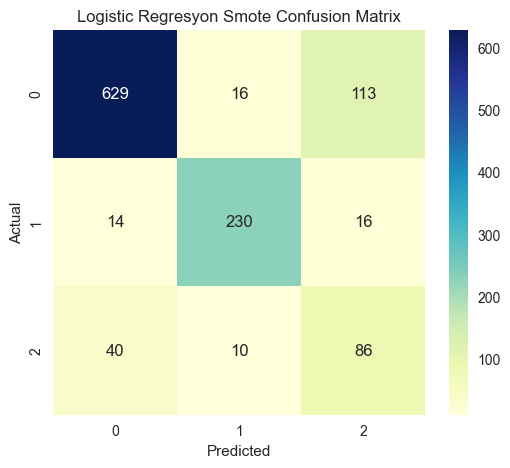

In [26]:
from sklearn.metrics import confusion_matrix

y_pred_smote= log_smote_model.predict(X_test)
cm = confusion_matrix(y_test, y_pred_smote)

plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt='d', cmap="YlGnBu")

plt.title("Logistic Regresyon Smote Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()


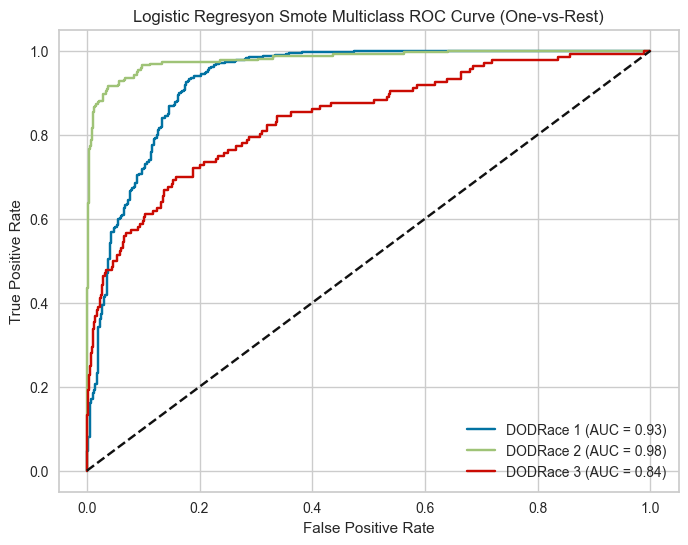

In [25]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc

# Proba tahminleri
y_score =log_smote_model.predict_proba(X_test)

# DODRace sınıfları al
dodrace = np.unique(y_test)

# Binary format
y_test_bin = label_binarize(y_test, classes=dodrace)

plt.figure(figsize=(8,6))

# Her DODRace sınıfı için ROC curve
for i in range(len(dodrace)):
    fpr, tpr, _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc = auc(fpr, tpr)

    plt.plot(fpr, tpr, label=f"DODRace {dodrace[i]} (AUC = {roc_auc:.2f})"  )

# Random model çizgisi
plt.plot([0, 1], [0, 1], "k--")

plt.title("Logistic Regresyon Smote Multiclass ROC Curve (One-vs-Rest)")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend()
plt.grid(True)
plt.show()


In [27]:
from sklearn.model_selection import cross_validate
import pandas as pd

# 10-fold Cross Validation
scores = cross_validate(log_smote_model,
                            X_train, y_train,
                            scoring={"accuracy": "accuracy", "precision": "precision_macro", "recall": "recall_macro", "f1": "f1_macro"},
                            cv=10,
                            return_train_score=True,
                            n_jobs=-1
                        )

df_scores = pd.DataFrame(scores, index = range(1, 11))
df_scores.mean()[2:]


test_accuracy      0.844207
train_accuracy     0.864163
test_precision     0.765508
train_precision    0.788953
test_recall        0.818048
train_recall       0.847462
test_f1            0.781593
train_f1           0.808956
dtype: float64

In [28]:
from sklearn.model_selection import GridSearchCV
import numpy as np

param_grid = [
    {
        "smote__k_neighbors": [3, 5, 7, 9],

        "logistic__penalty": ["l2"],
        "logistic__solver": ["lbfgs", "liblinear"],

        "logistic__C": np.logspace(-2, 2, 10),

        "logistic__class_weight": [None, "balanced"]
    },
    {
        "smote__k_neighbors": [3, 5, 7, 9],

        "logistic__penalty": ["l1"],
        "logistic__solver": ["liblinear"],

        "logistic__C": np.logspace(-2, 2, 10),

        "logistic__class_weight": [None, "balanced"]
    }
]

log_smote_grid = GridSearchCV(
                estimator=log_smote_model,
                param_grid=param_grid,
                scoring="f1_macro",
                cv=5,
                n_jobs=-1,
                verbose=1,
                refit=True
            )

log_smote_grid.fit(X_train, y_train)

Fitting 5 folds for each of 240 candidates, totalling 1200 fits


,"estimator estimator: estimator objectThis is assumed to implement the scikit-learn estimator interface.Either estimator needs to provide a ``score`` function,or ``scoring`` must be passed.",Pipeline(step...m_state=42))])
,"param_grid param_grid: dict or list of dictionariesDictionary with parameters names (`str`) as keys and lists ofparameter settings to try as values, or a list of suchdictionaries, in which case the grids spanned by each dictionaryin the list are explored. This enables searching over any sequenceof parameter settings.","[{'logistic__C': array([1.0000...00000000e+02]), 'logistic__class_weight': [None, 'balanced'], 'logistic__penalty': ['l2'], 'logistic__solver': ['lbfgs', 'liblinear'], ...}, {'logistic__C': array([1.0000...00000000e+02]), 'logistic__class_weight': [None, 'balanced'], 'logistic__penalty': ['l1'], 'logistic__solver': ['liblinear'], ...}]"
,"scoring scoring: str, callable, list, tuple or dict, default=NoneStrategy to evaluate the performance of the cross-validated model onthe test set.If `scoring` represents a single score, one can use:- a single string (see :ref:`scoring_string_names`);- a callable (see :ref:`scoring_callable`) that returns a single value;- `None`, the `estimator`'s :ref:`default evaluation criterion ` is used.If `scoring` represents multiple scores, one can use:- a list or tuple of unique strings;- a callable returning a dictionary where the keys are the metric names and the values are the metric scores;- a dictionary with metric names as keys and callables as values.See :ref:`multimetric_grid_search` for an example.",'f1_macro'
,"n_jobs n_jobs: int, default=NoneNumber of jobs to run in parallel.``None`` means 1 unless in a :obj:`joblib.parallel_backend` context.``-1`` means using all processors. See :term:`Glossary `for more details... versionchanged:: v0.20 `n_jobs` default changed from 1 to None",-1
,"refit refit: bool, str, or callable, default=TrueRefit an estimator using the best found parameters on the wholedataset.For multiple metric evaluation, this needs to be a `str` denoting thescorer that would be used to find the best parameters for refittingthe estimator at the end.Where there are considerations other than maximum score inchoosing a best estimator, ``refit`` can be set to a function whichreturns the selected ``best_index_`` given ``cv_results_``. In thatcase, the ``best_estimator_`` and ``best_params_`` will be setaccording to the returned ``best_index_`` while the ``best_score_``attribute will not be available.The refitted estimator is made available at the ``best_estimator_``attribute and permits using ``predict`` directly on this``GridSearchCV`` instance.Also for multiple metric evaluation, the attributes ``best_index_``,``best_score_`` and ``best_params_`` will only be available if``refit`` is set and all of them will be determined w.r.t this specificscorer.See ``scoring`` parameter to know more about multiple metricevaluation.See :ref:`sphx_glr_auto_examples_model_selection_plot_grid_search_digits.py`to see how to design a custom selection strategy using a callablevia `refit`.See :ref:`this example`for an example of how to use ``refit=callable`` to balance modelcomplexity and cross-validated score... versionchanged:: 0.20 Support for callable added.",True
,"cv cv: int, cross-validation generator or an iterable, default=NoneDetermines the cross-validation splitting strategy.Possible inputs for cv are:- None, to use the default 5-fold cross validation,- integer, to specify the number of folds in a `(Stratified)KFold`,- :term:`CV splitter`,- An iterable yielding (train, test) splits as arrays of indices.For integer/None inputs, if the estimator is a classifier and ``y`` iseither binary or multiclass, :class:`StratifiedKFold` is used. In allother cases, :class:`KFold` is used. These splitters are instantiatedwith `shuffle=False` so the splits will be the same across calls.Refer :ref:`User Guide ` for the variouscross-validation strategies that can be used here

In [30]:
log_smote_grid.best_estimator_

,steps,"[('preprocessor', ...), ('smote', ...), ...]"
,transform_input,None
,memory,None
,verbose,False
,"transformers transformers: list of tuplesList of (name, transformer, columns) tuples specifying thetransformer objects to be applied to subsets of the data.name : str Like in Pipeline and FeatureUnion, this allows the transformer and its parameters to be set using ``set_params`` and searched in grid search.transformer : {'drop', 'passthrough'} or estimator Estimator must support :term:`fit` and :term:`transform`. Special-cased strings 'drop' and 'passthrough' are accepted as well, to indicate to drop the columns or to pass them through untransformed, respectively.columns : str, array-like of str, int, array-like of int, array-like of bool, slice or callable Indexes the data on its second axis. Integers are interpreted as positional columns, while strings can reference DataFrame columns by name. A scalar string or int should be used where ``transformer`` expects X to be a 1d array-like (vector), otherwise a 2d array will be passed to the transformer. A callable is passed the input data `X` and can return any of the above. To select multiple columns by name or dtype, you can use :obj:`make_column_selector`.","[('num', ...), ('cat', ...)]"
,"remainder remainder: {'drop', 'passthrough'} or estimator, default='drop'By default, only the specified columns in `transformers` aretransformed and combined in the output, and the non-specifiedcolumns are dropped. (default of ``'drop'``).By specifying ``remainder='passthrough'``, all remaining columns thatwere not specified in `transformers`, but present in the data passedto `fit` will be automatically passed through. This subset of columnsis concatenated with the output of the transformers. For dataframes,extra columns not seen during `fit` will be excluded from the outputof `transform`.By setting ``remainder`` to be an estimator, the remainingnon-specified columns will use the ``remainder`` estimator. Theestimator must support :term:`fit` and :term:`transform`.Note that using this feature requires that the DataFrame columnsinput at :term:`fit` and :term:`transform` have identical order.",'passthrough'
,"sparse_threshold sparse_threshold: float, default=0.3If the output of the different transformers contains sparse matrices,these will be stacked as a sparse matrix if the overall density islower than this value. Use ``sparse_threshold=0`` to always returndense. When the transformed output consists of all dense data, thestacked result will be dense, and this keyword will be ignored.",0.3
,"n_jobs n_jobs: int, default=NoneNumber of jobs to run in parallel.``None`` means 1 unless in a :obj:`joblib.parallel_backend` context.``-1`` means using all processors. See :term:`Glossary `for more details.",None
,"transformer_weights transformer_weights: dict, default=NoneMultiplicative weights for features per transformer. The output of thetransformer is multiplied by these weights. Keys are transformer names,values the weights.",None
,"verbose verbose: bool, default=FalseIf True, the time elapsed while fitting each transformer will beprinted as it is completed.",False
,"verbose_feature_names_out verbose_feature_names_out: bool, str or Callable[[str, str], str], default=True- If True, :meth:`ColumnTransformer.get_feature_names_out` will prefix all feature names with the name of the transformer that generated that feature. It is equivalent to setting `verbose_feature_names_out=""{transformer_name}__{feature_name}""`.- If False, :meth:`ColumnTransformer.get_feature_names_out` will not prefix any feature names and will error if feature names are not unique.- If ``Callable[[str, str], str]``, :meth:`ColumnTransformer.get_feature_names_out` will rename all the features using the name of the transformer. The first argument of the callable is the transformer name and the second argument is the feature name. The returned string will be the new feature name.- If ``str``, it must be a string ready for formatti

In [31]:
log_smote_grid.best_params_

{'logistic__C': np.float64(0.0774263682681127),
 'logistic__class_weight': None,
 'logistic__penalty': 'l2',
 'logistic__solver': 'lbfgs',
 'smote__k_neighbors': 9}

In [32]:
log_smote_grid.best_score_

np.float64(0.7854986762502383)

In [33]:
from sklearn.metrics import accuracy_score, f1_score, recall_score, roc_auc_score, precision_score

y_pred_smote = log_smote_grid.predict(X_test)
y_pred_smote_proba = log_smote_grid.predict_proba(X_test)

log_smote_grid_accuracy = accuracy_score(y_test,y_pred_smote)

log_smote_grid_f1 = f1_score(y_test, y_pred_smote,average="macro") # Multiclass için average parametresi verildi 

log_smote_grid_recall = recall_score(y_test,y_pred_smote, average="macro")

log_smote_grid_precision = precision_score(y_test,y_pred_smote, average="macro")

log_smote_grid_auc = roc_auc_score(y_test,y_pred_smote_proba , multi_class="ovr")

print(f"Accuracy : {log_smote_grid_accuracy:.4f}")
print(f"F1 Score : {log_smote_grid_f1:.4f}")
print(f"Recall   : {log_smote_grid_recall:.4f}")
print(f"Percision : {log_smote_grid_precision:.4f}")
print(f"ROC AUC  : {log_smote_grid_auc:.4f}")

Accuracy : 0.8284
F1 Score : 0.7640
Recall   : 0.7945
Percision : 0.7519
ROC AUC  : 0.9227


In [34]:
eval_metric(log_smote_grid, X_train, y_train, X_test, y_test)

Test_Set
[[634  14 110]
 [ 12 234  14]
 [ 41   7  88]]
              precision    recall  f1-score   support

           1       0.92      0.84      0.88       758
           2       0.92      0.90      0.91       260
           3       0.42      0.65      0.51       136

    accuracy                           0.83      1154
   macro avg       0.75      0.79      0.76      1154
weighted avg       0.86      0.83      0.84      1154


Train_Set
[[2620   58  356]
 [  35  951   52]
 [  99   38  406]]
              precision    recall  f1-score   support

           1       0.95      0.86      0.91      3034
           2       0.91      0.92      0.91      1038
           3       0.50      0.75      0.60       543

    accuracy                           0.86      4615
   macro avg       0.79      0.84      0.81      4615
weighted avg       0.89      0.86      0.87      4615



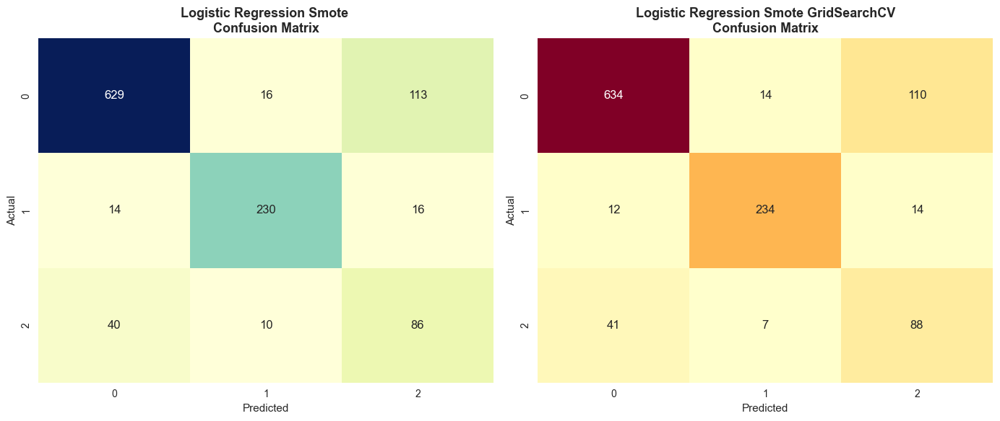

In [37]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Tahminler
y_pred_smote = log_smote_model.predict(X_test)
y_pred_smote_grid = log_smote_grid.predict(X_test)

# Confusion Matrix'ler
cm_smote = confusion_matrix(y_test, y_pred_smote )
cm_smote_grid= confusion_matrix(y_test, y_pred_smote_grid)

# Yan yana grafikler
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Logistic SMOTE Regression
sns.heatmap(cm_smote, annot=True, fmt="d", cmap='YlGnBu', ax=axes[0], cbar=False)

axes[0].set_title("Logistic Regression Smote \nConfusion Matrix", fontsize=13, fontweight="bold")
axes[0].set_xlabel("Predicted")
axes[0].set_ylabel("Actual")

# Logistic Regression SMOTE GridSearchCV
sns.heatmap(cm_smote_grid, annot=True, fmt="d", cmap= 'YlOrRd', ax=axes[1], cbar=False)

axes[1].set_title("Logistic Regression Smote GridSearchCV\nConfusion Matrix",fontsize=13,fontweight="bold")
axes[1].set_xlabel("Predicted")
axes[1].set_ylabel("Actual")

plt.tight_layout()
plt.show()


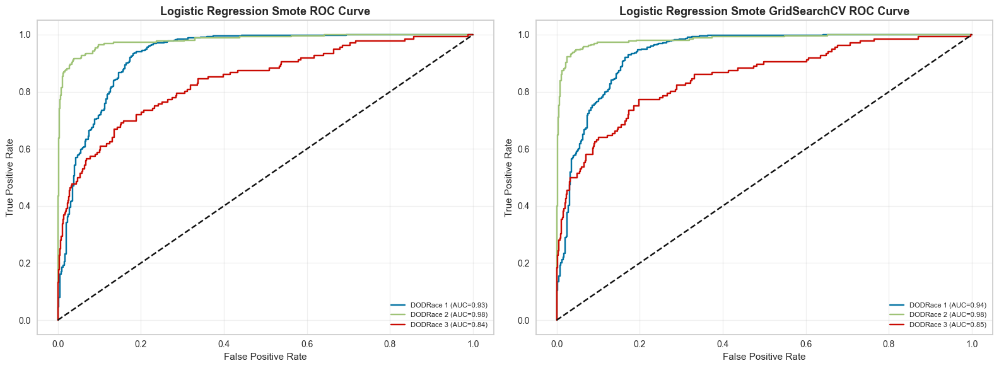

In [39]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc

# Tahmin olasılıkları
y_score_log = log_smote_model.predict_proba(X_test)
y_score_grid = log_smote_grid.predict_proba(X_test)


# Sınıflar
dodrace = np.unique(y_test)

# One-vs-Rest için binarize
y_test_bin = label_binarize(y_test, classes=dodrace)

# Yan yana grafikler
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# =========================
# Logistic  Regression SMOTE
# =========================
for i in range(len(dodrace)):

    fpr, tpr, _ = roc_curve( y_test_bin[:, i], y_score_log[:, i] )

    roc_auc = auc(fpr, tpr)

    axes[0].plot(fpr, tpr, label=f"DODRace {dodrace[i]} (AUC={roc_auc:.2f})" )

axes[0].plot([0, 1], [0, 1], "k--")

axes[0].set_title("Logistic Regression Smote ROC Curve", fontsize=13, fontweight="bold")

axes[0].set_xlabel("False Positive Rate")
axes[0].set_ylabel("True Positive Rate")
axes[0].legend(fontsize=8)
axes[0].grid(alpha=0.3)

# =========================
# Logistic Regression SMOTE GridSearchCV
# =========================
for i in range(len(dodrace)):

    fpr, tpr, _ = roc_curve(y_test_bin[:, i], y_score_grid[:, i])

    roc_auc = auc(fpr, tpr)

    axes[1].plot(fpr, tpr,label=f"DODRace {dodrace[i]} (AUC={roc_auc:.2f})"    )

axes[1].plot([0, 1], [0, 1], "k--")

axes[1].set_title("Logistic Regression Smote GridSearchCV ROC Curve", fontsize=13, fontweight="bold")

axes[1].set_xlabel("False Positive Rate")
axes[1].set_ylabel("True Positive Rate")
axes[1].legend(fontsize=8)
axes[1].grid(alpha=0.3)

plt.tight_layout()
plt.show()


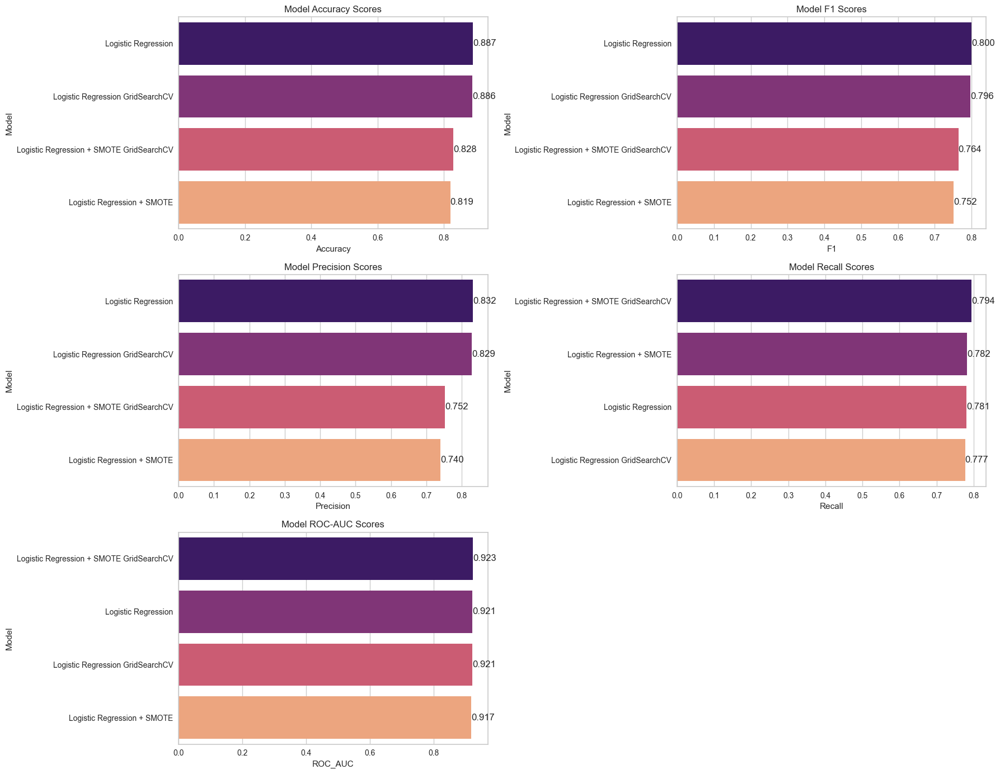

In [61]:
import pandas as pd

compare = pd.DataFrame({"Model": [ "Logistic Regression", "Logistic Regression GridSearchCV",    "Logistic Regression + SMOTE",  "Logistic Regression + SMOTE GridSearchCV" ],

    "Accuracy": [ log_accuracy, log_grid_accuracy, log_smote_accuracy, log_smote_grid_accuracy],

    "F1": [log_f1, log_grid_f1, log_smote_f1, log_smote_grid_f1 ],

    "Precision": [log_precision, log_grid_precision, log_smote_precision, log_smote_grid_precision],

    "Recall": [log_recall,log_grid_recall, log_smote_recall,log_smote_grid_recall],

    "ROC_AUC": [log_auc,log_grid_auc,log_smote_auc,log_smote_grid_auc]})


def labels(ax):

    for p in ax.patches:
        width = p.get_width()                    # get bar length
        ax.text(width,                           # set the text at 1 unit right of the bar
                p.get_y() + p.get_height() / 2,  # get Y coordinate + X coordinate / 2
                '{:1.3f}'.format(width),         # set variable to display, 2 decimals
                ha='left',                       # horizontal alignment
                va='center')                     # vertical alignment

fig, axes = plt.subplots(3, 2, figsize=(18, 14))
axes = axes.flatten()

# Accuracy
compare_acc = compare.sort_values(by="Accuracy", ascending=False)
ax = sns.barplot( x="Accuracy",  y="Model",  data=compare_acc, palette="magma", ax=axes[0])
labels(ax)
axes[0].set_title("Model Accuracy Scores")

# F1
compare_f1 = compare.sort_values(by="F1", ascending=False)
ax = sns.barplot( x="F1", y="Model", data=compare_f1, palette="magma", ax=axes[1])
labels(ax)
axes[1].set_title("Model F1 Scores")

# Precision
compare_precision = compare.sort_values(by="Precision", ascending=False)
ax = sns.barplot(x="Precision", y="Model", data=compare_precision, palette="magma", ax=axes[2])
labels(ax)
axes[2].set_title("Model Precision Scores")

# Recall
compare_recall = compare.sort_values(by="Recall", ascending=False)
ax = sns.barplot(x="Recall", y="Model", data=compare_recall, palette="magma", ax=axes[3])
labels(ax)
axes[3].set_title("Model Recall Scores")

# ROC AUC
compare_auc = compare.sort_values(by="ROC_AUC", ascending=False)
ax = sns.barplot(x="ROC_AUC", y="Model", data=compare_auc, palette="magma", ax=axes[4])
labels(ax)
axes[4].set_title("Model ROC-AUC Scores")

# Son boş subplot'u kaldır
fig.delaxes(axes[5])
plt.tight_layout()
plt.show()


#  SHAP

**SHAP (SHapley Additive exPlanations)**

**Nedir?**

SHAP, makine öğrenimi modellerinin tahminlerini açıklamak için kullanılan bir araçtır. SHAP değerleri, bir modelin her bir özelliğinin bir tahmin üzerindeki etkisini ölçer. Bu değerler, kooperatif oyun teorisi olarak bilinen bir matematiksel teori olan Shapley değerlerine dayanır.

**Ne Amaçla Kullanılır?**
- **Model Yorumlanabilirliği**: Modelin hangi özelliklerin tahminleri en çok etkilediğini anlamak.
- **Özellik Seçimi**: En önemli özellikleri belirleyerek modelin karmaşıklığını azaltmak.
- **Denetim ve Uyum**: Modelin kararlarını açıklamak ve yasal gereksinimleri karşılamak.
- **Model Geliştirme**: Modelin hangi alanlarda iyi veya kötü performans gösterdiğini anlamak.

**Nerelerde Kullanılır?**
- **Kredi Skorlama**: Hangi faktörlerin bir kişinin kredi puanını etkilediğini anlamak.
- **Sağlık**: Hangi tıbbi özelliklerin bir hastalığı tahmin etmede önemli olduğunu belirlemek.
- **Pazarlama**: Müşteri davranışını etkileyen faktörleri anlamak.
- **Doğal Dil İşleme**: Metin sınıflandırma veya duygu analizi gibi NLP görevlerinde modelin hangi kelimeleri veya özellikleri önemli bulduğunu anlamak.

**Unbalanced Data Setlerinde Önemi
Dengesiz veri setlerinde, model genellikle çoğunluk sınıfına yanlı olabilir. SHAP, bu tür durumlar için de yararlıdır çünkü modelin azınlık sınıfını yanlış sınıflandırma nedenlerini açıklayabilir. Bu, modelin performansını artırmak için hangi özelliklerin daha fazla dikkate alınması gerektiğini anlamak için çok yararlıdır.

**SHAP, model yorumlanabilirliği için güçlü ve esnek bir araçtır ve birçok farklı türde makine öğrenimi modeli ile kullanılabilir.**

Bilgi için: https://towardsdatascience.com/explain-machine-learning-models-using-shap-library-e05a1583c34f/

- Shap; bir tahmin yaparken gozlem bazinda veya tum data icinde class' lari tahmin ederken hangi feature' in ne kadar katkisi var, bunu gosterir. 

- Mesela bu datada Hispanic class' ina ait feature' lari secip sadece onlar uzerinden bir feature selection yaparsak skorlarimiz daha az gozlem sayisi ile daha iyi olabilir. 

- Daha once yaptigimiz feature importance isleminden daha farkli bir islem.

In [40]:
pip install shap

Note: you may need to restart the kernel to use updated packages.


Background dataset has 4615 samples but max_samples=500. Subsampling to 500 samples for SHAP value computation. To use all samples, set max_samples=4615 when initializing the masker.


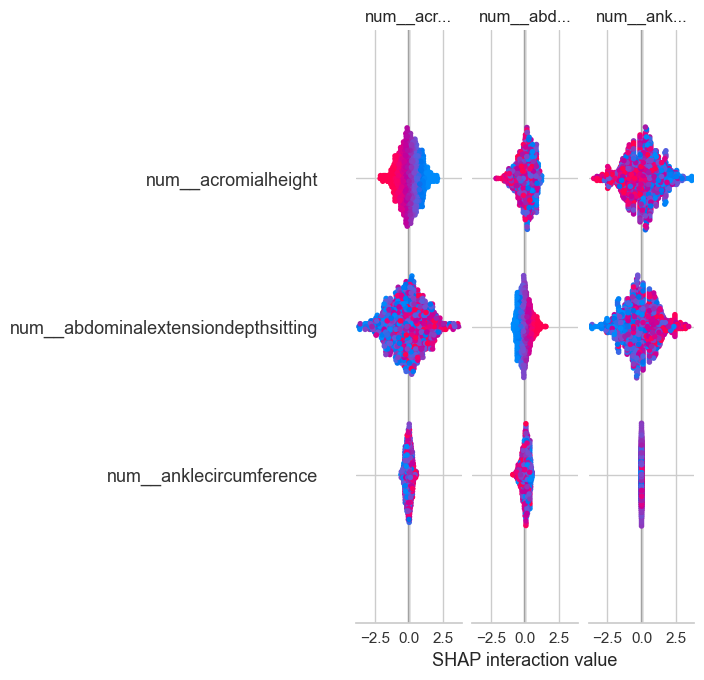

In [65]:
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
import shap

column_transformer = ColumnTransformer( transformers=[("num", StandardScaler(), numeric_col),
                                                      ("cat", OneHotEncoder( handle_unknown="ignore", sparse_output=False, drop="first" ), cat_col)],
                                                        remainder="passthrough"
                                                        )
log_final = Pipeline([
    ("transformer", column_transformer),
    ("log_model", LogisticRegression(max_iter=1000, random_state=42))
])

log_final.fit(X_train, y_train)

X_train_transformed = log_final.named_steps["transformer"].transform(X_train)
X_test_transformed = log_final.named_steps["transformer"].transform(X_test)

feature_names = log_final.named_steps["transformer"].get_feature_names_out()

# SHAP Masker
masker = shap.maskers.Independent(
    X_train_transformed,
    max_samples=500
)

# SHAP Explainer
explainer = shap.LinearExplainer(
    log_final.named_steps["log_model"],
    masker
)

# SHAP values
shap_values = explainer.shap_values(X_test_transformed)

if isinstance(shap_values, list):

    class_id = 0  # istediğin sınıfı seç
    shap.summary_plot(
        shap_values[class_id],
        X_test_transformed,
        feature_names=feature_names
    )

else:

    shap.summary_plot(
        shap_values,
        X_test_transformed,
        feature_names=feature_names
    )